# Separate runs by HKLE due to size limits

# Positions rounded to 1,000

In [1]:
data="TCGA/focused.1000.T.csv.gz"

In [2]:
hkle='SVA_A'

['HERVK113', 'SVA_A', 'SVA_B', 'SVA_C', 'SVA_D', 'SVA_E', 'SVA_F']

Number of insertions detected needed to call insertion present

In [3]:
threshold=3   # 1

In [4]:
import numpy as np
np.__version__

'1.20.3'

In [5]:
import pandas as pd
pd.__version__

'1.2.4'

In [6]:
import matplotlib
matplotlib.__version__

'3.4.2'

In [7]:
import matplotlib.pyplot as plt

In [8]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [9]:
import scipy
scipy.__version__

'1.6.3'

In [10]:
from scipy import stats

In [11]:
import seaborn as sns
sns.__version__

'0.11.1'

In [12]:
from datetime import datetime

In [13]:
import sklearn
sklearn.__version__

'0.24.2'

In [14]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [15]:
default_max_columns=pd.get_option('display.max_columns')

In [16]:
default_max_rows=pd.get_option('display.max_rows')

In [17]:
default_precision=pd.get_option('display.precision')

In [18]:
pd.set_option('display.precision', 2)

In [19]:
#default_threshold=np.get_printoptions()['threshold']

In [20]:
#np.set_printoptions(threshold=10000000)

# Read Metadata 1

In [21]:
mt1=pd.read_csv("TCGA/metadata.cart.TCGA.GBM-LGG.WGS.bam.2020-07-17.csv",header=None,
 names=['submitter','days_to_death','gender','disease_type','center_name'])

In [22]:
mt1.shape

(127, 5)

In [23]:
mt1.rename(columns={"submitter": "subject"},inplace=True)
mt1.rename(columns={"gender": "gender1"},inplace=True)

In [24]:
mt1.head()

,subject,days_to_death,gender1,disease_type,center_name
0,02-2483,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,02-2485,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
2,06-0125,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
3,06-0152,375.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
4,06-0157,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [25]:
list(mt1)

['subject', 'days_to_death', 'gender1', 'disease_type', 'center_name']

# Read Metadata 2

In [26]:
mt2=pd.read_csv("TCGA/TCGA.Glioma.metadata.tsv",sep="\t")

In [27]:
mt2.shape

(1114, 18)

In [28]:
mt2.head()

,case_submitter_id,project_id,primary_diagnosis,race,ethnicity,gender,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,WHO_groups,Triple_group,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status
0,TCGA-02-0001,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,44.0,11.76,1.0
1,TCGA-02-0003,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,50.0,4.73,1.0
2,TCGA-02-0004,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,NaN,NaN,IDH-WT:1p19q-NA,NaN,IDH-WT:1p19q-NA:TERT-NA,MD Anderson Cancer Center,NaN,59.0,11.33,1.0
3,TCGA-02-0006,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,56.0,18.33,1.0
4,TCGA-02-0007,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,40.0,23.16,1.0


In [29]:
list(mt2)

['case_submitter_id',
 'project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status']

In [30]:
mt2['subject']=mt2['case_submitter_id'].astype(str).str[5:12]

In [31]:
mt2[['subject','case_submitter_id']].head()

,subject,case_submitter_id
0,02-0001,TCGA-02-0001
1,02-0003,TCGA-02-0003
2,02-0004,TCGA-02-0004
3,02-0006,TCGA-02-0006
4,02-0007,TCGA-02-0007


In [32]:
mt2.drop('case_submitter_id',axis='columns',inplace=True)
mt2.rename(columns={"gender": "gender2"},inplace=True)

In [33]:
list(mt2)

['project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender2',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status',
 'subject']

# Merge Metadata

In [34]:
#meta=mt2.merge(mt1,left_on='subject2',right_on='subject1',suffixes=["_mt2","_mt1"],how='inner')
meta=mt2.merge(mt1,on='subject',suffixes=["_mt2","_mt1"],how='inner')

In [35]:
del mt1
del mt2

In [36]:
meta.head()

,project_id,primary_diagnosis,race,ethnicity,gender2,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,...,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,subject,days_to_death,gender1,disease_type,center_name
0,TCGA-GBM,Glioblastoma,asian,not hispanic or latino,male,02-2483-01A-01R-1849-01+1,Mutant,non-codel,WT,IDH-Mutant:1p19q-non-codel,...,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,02-2483,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,TCGA-GBM,Glioblastoma,black or african american,not hispanic or latino,male,02-2485-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,MD Anderson Cancer Center,Unmethylated,53.0,15.44,0.0,02-2485,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
2,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0125-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,Methylated,63.0,47.57,1.0,06-0125,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
3,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,NaN,68.0,12.32,1.0,06-0152,375.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
4,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0157-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,NaN,63.0,3.19,1.0,06-0157,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [37]:
meta.drop(meta[(meta['subject']=='CS-6186') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [38]:
meta.drop(meta[(meta['subject']=='DU-5872') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [39]:
meta.columns

Index(['project_id', 'primary_diagnosis', 'race', 'ethnicity', 'gender2',
       'RE_names', 'IDH', 'x1p19q', 'TERT', 'IDH_1p19q_status', 'WHO_groups',
       'Triple_group', 'Tissue_sample_location', 'MGMT', 'Age',
       'Survival_months', 'Vital_status', 'subject', 'days_to_death',
       'gender1', 'disease_type', 'center_name'],
      dtype='object')

In [40]:
meta['primary_diagnosis'].value_counts()

Glioblastoma                     35
Oligodendroglioma, NOS           33
Astrocytoma, anaplastic          24
Mixed glioma                     16
Astrocytoma, NOS                  9
Oligodendroglioma, anaplastic     8
Name: primary_diagnosis, dtype: int64

In [41]:
meta['TERT'].value_counts()

Mutant    68
WT        54
Name: TERT, dtype: int64

In [42]:
meta['IDH'].value_counts()

Mutant    74
WT        50
Name: IDH, dtype: int64

In [43]:
meta['x1p19q'].value_counts()

non-codel    102
codel         23
Name: x1p19q, dtype: int64

In [44]:
meta['disease_type'].value_counts()

Brain Lower Grade Glioma    90
Glioblastoma Multiforme     35
Name: disease_type, dtype: int64

In [45]:
meta['gender1'].value_counts()

male      72
female    53
Name: gender1, dtype: int64

In [46]:
meta['race'].value_counts()

white                        114
black or african american      7
not reported                   3
asian                          1
Name: race, dtype: int64

In [47]:
meta['ethnicity'].value_counts()

not hispanic or latino    108
not reported               11
hispanic or latino          6
Name: ethnicity, dtype: int64

In [48]:
meta['IDH_1p19q_status'].value_counts()

IDH-Mutant:1p19q-non-codel    51
IDH-WT:1p19q-non-codel        50
IDH-Mutant:1p19q-codel        23
IDH-NA:1p19q-non-codel         1
Name: IDH_1p19q_status, dtype: int64

In [49]:
meta['WHO_groups'].value_counts()

glioblastoma:IDH-WT:1p19q-non-codel             29
oligodendroglioma:IDH-Mutant:1p19q-codel        23
astrocytoma:IDH-Mutant:1p19q-non-codel          18
oligodendroglioma:IDH-Mutant:1p19q-non-codel    13
astrocytoma:IDH-WT:1p19q-non-codel              13
oligoastrocytoma:IDH-Mutant:1p19q-non-codel     11
glioblastoma:IDH-Mutant:1p19q-non-codel          5
oligodendroglioma:IDH-WT:1p19q-non-codel         4
oligoastrocytoma:IDH-WT:1p19q-non-codel          4
Name: WHO_groups, dtype: int64

In [50]:
meta['Triple_group'].value_counts()

IDH-Mutant:1p19q-non-codel:TERT-WT        49
IDH-WT:1p19q-non-codel:TERT-Mutant        44
IDH-Mutant:1p19q-codel:TERT-Mutant        22
IDH-WT:1p19q-non-codel:TERT-WT             4
IDH-WT:1p19q-non-codel:TERT-NA             2
IDH-Mutant:1p19q-codel:TERT-WT             1
IDH-Mutant:1p19q-non-codel:TERT-NA         1
IDH-NA:1p19q-non-codel:TERT-Mutant         1
IDH-Mutant:1p19q-non-codel:TERT-Mutant     1
Name: Triple_group, dtype: int64

In [51]:
meta['MGMT'].value_counts()

Methylated      87
Unmethylated    27
Name: MGMT, dtype: int64

In [52]:
meta['center_name'].value_counts()

Broad Institute of MIT and Harvard    75
Harvard Medical School                50
Name: center_name, dtype: int64

## We need a multi-level index to merge with df later so adding an empty index level

In [53]:
meta.columns=[meta.columns,[''] * len(meta.columns)]

In [54]:
#meta.columns.names=['chromosome','position']

In [55]:
meta.columns

MultiIndex([(            'project_id', ''),
            (     'primary_diagnosis', ''),
            (                  'race', ''),
            (             'ethnicity', ''),
            (               'gender2', ''),
            (              'RE_names', ''),
            (                   'IDH', ''),
            (                'x1p19q', ''),
            (                  'TERT', ''),
            (      'IDH_1p19q_status', ''),
            (            'WHO_groups', ''),
            (          'Triple_group', ''),
            ('Tissue_sample_location', ''),
            (                  'MGMT', ''),
            (                   'Age', ''),
            (       'Survival_months', ''),
            (          'Vital_status', ''),
            (               'subject', ''),
            (         'days_to_death', ''),
            (               'gender1', ''),
            (          'disease_type', ''),
            (           'center_name', '')],
           )

# Read raw data and cleanup

In [56]:
#df=pd.read_csv("focused.csv.gz",header=[0,1,2,3],index_col=[0,1])
#df.columns.names=['sample','pup','hkle','q']
#df=df.T
df=pd.read_csv(data,header=[0,1],index_col=[0,1,2,3])

df.reset_index(inplace=True)
df.head()


chromosome       sample     pup      hkle mapq    chr1                  \
position                                       1048000 1190000 1308000   
0           02-2483-01A  paired  HERVK113  Q20       0       0       0   
1           02-2483-01A  paired     SVA_A  Q20       0       0       0   
2           02-2483-01A  paired     SVA_B  Q20       0       0       0   
3           02-2483-01A  paired     SVA_C  Q20       0       0       0   
4           02-2483-01A  paired     SVA_D  Q20       0       0       0   

chromosome                          ...     chrY                             \
position   1409000 1410000 1580000  ... 19535000 19536000 19699000 19700000   
0                4       1       4  ...        0        0        2        0   
1                0       0       0  ...        0        0        0        0   
2                0       0       0  ...        0        0        0        0   
3                0       0       0  ...        0        0        0        0   
4                0       0       0  ...        0        0        0        0   

chromosome                                                        
position   20552000 20553000 20976000 21047000 21217000 21639000  
0                 0        0        0        0        0        0  
1                 0        0        0        0        0        0  
2                 0        0        0        0        0        0  
3                 0        0        0        0        0        0  
4                 0        0        0        0        0        0  

[5 rows x 17413 columns]

In [57]:
df['subject']=df['sample'].str[0:7]
df['subject']

0       02-2483
1       02-2483
2       02-2483
3       02-2483
4       02-2483
         ...   
1913    TQ-A8XE
1914    TQ-A8XE
1915    TQ-A8XE
1916    TQ-A8XE
1917    TQ-A8XE
Name: subject, Length: 1918, dtype: object

In [58]:
df.columns

MultiIndex([( 'sample',         ''),
            (    'pup',         ''),
            (   'hkle',         ''),
            (   'mapq',         ''),
            (   'chr1',  '1048000'),
            (   'chr1',  '1190000'),
            (   'chr1',  '1308000'),
            (   'chr1',  '1409000'),
            (   'chr1',  '1410000'),
            (   'chr1',  '1580000'),
            ...
            (   'chrY', '19536000'),
            (   'chrY', '19699000'),
            (   'chrY', '19700000'),
            (   'chrY', '20552000'),
            (   'chrY', '20553000'),
            (   'chrY', '20976000'),
            (   'chrY', '21047000'),
            (   'chrY', '21217000'),
            (   'chrY', '21639000'),
            ('subject',         '')],
           names=['chromosome', 'position'], length=17414)

In [59]:
df.head()

chromosome       sample     pup      hkle mapq    chr1                  \
position                                       1048000 1190000 1308000   
0           02-2483-01A  paired  HERVK113  Q20       0       0       0   
1           02-2483-01A  paired     SVA_A  Q20       0       0       0   
2           02-2483-01A  paired     SVA_B  Q20       0       0       0   
3           02-2483-01A  paired     SVA_C  Q20       0       0       0   
4           02-2483-01A  paired     SVA_D  Q20       0       0       0   

chromosome                          ...     chrY                             \
position   1409000 1410000 1580000  ... 19536000 19699000 19700000 20552000   
0                4       1       4  ...        0        2        0        0   
1                0       0       0  ...        0        0        0        0   
2                0       0       0  ...        0        0        0        0   
3                0       0       0  ...        0        0        0        0   
4                0       0       0  ...        0        0        0        0   

chromosome                                               subject  
position   20553000 20976000 21047000 21217000 21639000           
0                 0        0        0        0        0  02-2483  
1                 0        0        0        0        0  02-2483  
2                 0        0        0        0        0  02-2483  
3                 0        0        0        0        0  02-2483  
4                 0        0        0        0        0  02-2483  

[5 rows x 17414 columns]

In [60]:
df.set_index(['subject','sample','pup','hkle','mapq'],inplace=True)

In [61]:
df.head()

chromosome                                  chr1                          \
position                                 1048000 1190000 1308000 1409000   
subject sample      pup    hkle     mapq                                   
02-2483 02-2483-01A paired HERVK113 Q20        0       0       0       4   
                           SVA_A    Q20        0       0       0       0   
                           SVA_B    Q20        0       0       0       0   
                           SVA_C    Q20        0       0       0       0   
                           SVA_D    Q20        0       0       0       0   

chromosome                                                                \
position                                 1410000 1580000 1581000 2211000   
subject sample      pup    hkle     mapq                                   
02-2483 02-2483-01A paired HERVK113 Q20        1       4       0       0   
                           SVA_A    Q20        0       0       0       0   
                           SVA_B    Q20        0       0       0       0   
                           SVA_C    Q20        0       0       0       0   
                           SVA_D    Q20        0       0       0       0   

chromosome                                                ...     chrY  \
position                                 2513000 2581000  ... 19535000   
subject sample      pup    hkle     mapq                  ...            
02-2483 02-2483-01A paired HERVK113 Q20        0       0  ...        0   
                           SVA_A    Q20        0       0  ...        0   
                           SVA_B    Q20        0       0  ...        0   
                           SVA_C    Q20        0       0  ...        0   
                           SVA_D    Q20        0       0  ...        0   

chromosome                                                                    \
position                                 19536000 19699000 19700000 20552000   
subject sample      pup    hkle     mapq                                       
02-2483 02-2483-01A paired HERVK113 Q20         0        2        0        0   
                           SVA_A    Q20         0        0        0        0   
                           SVA_B    Q20         0        0        0        0   
                           SVA_C    Q20         0        0        0        0   
                           SVA_D    Q20         0        0        0        0   

chromosome                                                                    \
position                                 20553000 20976000 21047000 21217000   
subject sample      pup    hkle     mapq                                       
02-2483 02-2483-01A paired HERVK113 Q20         0        0        0        0   
                           SVA_A    Q20         0        0        0        0   
                           SVA_B    Q20         0        0        0        0   
                           SVA_C    Q20         0        0        0        0   
                           SVA_D    Q20         0        0        0        0   

chromosome                                         
position                                 21639000  
subject sample      pup    hkle     mapq           
02-2483 02-2483-01A paired HERVK113 Q20         0  
                           SVA_A    Q20         0  
                           SVA_B    Q20         0  
                           SVA_C    Q20         0  
                           SVA_D    Q20         0  

[5 rows x 17409 columns]

In [62]:
df.shape

(1918, 17409)

## Remove "pup" and "q" as they are useless in this dataset.

In [63]:
df=df.droplevel('pup',axis='index').droplevel('mapq',axis='index')

In [64]:
df.head()

chromosome                      chr1                                          \
position                     1048000 1190000 1308000 1409000 1410000 1580000   
subject sample      hkle                                                       
02-2483 02-2483-01A HERVK113       0       0       0       4       1       4   
                    SVA_A          0       0       0       0       0       0   
                    SVA_B          0       0       0       0       0       0   
                    SVA_C          0       0       0       0       0       0   
                    SVA_D          0       0       0       0       0       0   

chromosome                                                    ...     chrY  \
position                     1581000 2211000 2513000 2581000  ... 19535000   
subject sample      hkle                                      ...            
02-2483 02-2483-01A HERVK113       0       0       0       0  ...        0   
                    SVA_A          0       0       0       0  ...        0   
                    SVA_B          0       0       0       0  ...        0   
                    SVA_C          0       0       0       0  ...        0   
                    SVA_D          0       0       0       0  ...        0   

chromosome                                                                 \
position                     19536000 19699000 19700000 20552000 20553000   
subject sample      hkle                                                    
02-2483 02-2483-01A HERVK113        0        2        0        0        0   
                    SVA_A           0        0        0        0        0   
                    SVA_B           0        0        0        0        0   
                    SVA_C           0        0        0        0        0   
                    SVA_D           0        0        0        0        0   

chromosome                                                        
position                     20976000 21047000 21217000 21639000  
subject sample      hkle                                          
02-2483 02-2483-01A HERVK113        0        0        0        0  
                    SVA_A           0        0        0        0  
                    SVA_B           0        0        0        0  
                    SVA_C           0        0        0        0  
                    SVA_D           0        0        0        0  

[5 rows x 17409 columns]

In [65]:
df.shape

(1918, 17409)

## Drop recurrent tumor (-02?)

In [66]:
df.loc[df.index.get_level_values('sample').str.contains("-02.$")].index

MultiIndex([('06-0125', '06-0125-02A', 'HERVK113'),
            ('06-0125', '06-0125-02A',    'SVA_A'),
            ('06-0125', '06-0125-02A',    'SVA_B'),
            ('06-0125', '06-0125-02A',    'SVA_C'),
            ('06-0125', '06-0125-02A',    'SVA_D'),
            ('06-0125', '06-0125-02A',    'SVA_E'),
            ('06-0125', '06-0125-02A',    'SVA_F'),
            ('06-0152', '06-0152-02A', 'HERVK113'),
            ('06-0152', '06-0152-02A',    'SVA_A'),
            ('06-0152', '06-0152-02A',    'SVA_B'),
            ...
            ('TQ-A7RV', 'TQ-A7RV-02A',    'SVA_D'),
            ('TQ-A7RV', 'TQ-A7RV-02A',    'SVA_E'),
            ('TQ-A7RV', 'TQ-A7RV-02A',    'SVA_F'),
            ('TQ-A8XE', 'TQ-A8XE-02A', 'HERVK113'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_A'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_B'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_C'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_D'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_E

In [67]:
df.drop(df.loc[df.index.get_level_values('sample').str.contains("-02.$")].index,axis='index',inplace=True)

In [68]:
df.loc[df.index.get_level_values('sample').str.contains("-02.$")].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

## Drop solid normal (-11?) (I've seen a couple)

In [69]:
df.loc[df.index.get_level_values('sample').str.contains("-11.$")].index

MultiIndex([('FG-5963', 'FG-5963-11A', 'HERVK113'),
            ('FG-5963', 'FG-5963-11A',    'SVA_A'),
            ('FG-5963', 'FG-5963-11A',    'SVA_B'),
            ('FG-5963', 'FG-5963-11A',    'SVA_C'),
            ('FG-5963', 'FG-5963-11A',    'SVA_D'),
            ('FG-5963', 'FG-5963-11A',    'SVA_E'),
            ('FG-5963', 'FG-5963-11A',    'SVA_F')],
           names=['subject', 'sample', 'hkle'])

In [70]:
df.drop(df.loc[df.index.get_level_values('sample').str.contains("-11.$")].index,axis='index',inplace=True)

In [71]:
df.loc[df.index.get_level_values('sample').str.contains("-11.$")].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

## Drop solitary tumor / normal ( not sure how to do this programmatically )

* FG-5963-01A
* CS-5390-10A

In [72]:
df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([('FG-5963', 'FG-5963-01A', 'HERVK113'),
            ('FG-5963', 'FG-5963-01A',    'SVA_A'),
            ('FG-5963', 'FG-5963-01A',    'SVA_B'),
            ('FG-5963', 'FG-5963-01A',    'SVA_C'),
            ('FG-5963', 'FG-5963-01A',    'SVA_D'),
            ('FG-5963', 'FG-5963-01A',    'SVA_E'),
            ('FG-5963', 'FG-5963-01A',    'SVA_F')],
           names=['subject', 'sample', 'hkle'])

In [73]:
df.drop(df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index,axis='index',inplace=True)

In [74]:
df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

In [75]:
df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([('CS-5390', 'CS-5390-10A', 'HERVK113'),
            ('CS-5390', 'CS-5390-10A',    'SVA_A'),
            ('CS-5390', 'CS-5390-10A',    'SVA_B'),
            ('CS-5390', 'CS-5390-10A',    'SVA_C'),
            ('CS-5390', 'CS-5390-10A',    'SVA_D'),
            ('CS-5390', 'CS-5390-10A',    'SVA_E'),
            ('CS-5390', 'CS-5390-10A',    'SVA_F')],
           names=['subject', 'sample', 'hkle'])

In [76]:
df.drop(df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index,axis='index',inplace=True)

In [77]:
df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

# Match earlier HERVK113 notebook counts
* CS-5390-10A - 553
* FG-5963-01A - 68
* CS-6186-01A - 1100
* CS-6186-10A - 950
* DU-5872-01A - 1108
* DU-5872-10A - 776
* 02-2483-01A - 568
* 02-2483-10A - 557
* 02-2485-01A - 587
* 02-2485-10A - 498
* 06-0125-01A - 734

In [78]:
df[df[df.columns]>0].count(axis='columns')['CS-6186','CS-6186-01A']

hkle
HERVK113    1100
SVA_A       2224
SVA_B       2141
SVA_C       2174
SVA_D       2200
SVA_E       2159
SVA_F       1784
dtype: int64

In [79]:
df[df[df.columns]>0].count(axis='columns')['CS-6186','CS-6186-10A']

hkle
HERVK113     950
SVA_A       1962
SVA_B       1839
SVA_C       1845
SVA_D       1868
SVA_E       1827
SVA_F       1512
dtype: int64

In [80]:
df[df[df.columns]>0].count(axis='columns')['DU-5872','DU-5872-01A']

hkle
HERVK113    1108
SVA_A       2744
SVA_B       2640
SVA_C       2625
SVA_D       2644
SVA_E       2614
SVA_F       2285
dtype: int64

In [81]:
df[df[df.columns]>0].count(axis='columns')['DU-5872','DU-5872-10A']

hkle
HERVK113     776
SVA_A       2008
SVA_B       1904
SVA_C       1908
SVA_D       1926
SVA_E       1884
SVA_F       1547
dtype: int64

## Keep only Broad and drop Harvard Medical School

### Harvard's samples were really low coverage?

In [82]:
meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique()


array(['02-2483', '02-2485', '06-0125', '06-0152', '06-0157', '06-0171',
       '06-0190', '06-0210', '06-0211', '06-0214', '06-0221', '06-0686',
       '06-0744', '06-0745', '06-2557', '06-2570', '06-5411', '06-5415',
       '14-1034', '14-1402', '14-1823', '14-2554', '15-1444', '19-1389',
       '19-2620', '19-2624', '19-2629', '19-5960', '26-5132', '26-5135',
       '27-1831', '27-2523', '27-2528', '32-1970', '41-5651', 'CS-5390',
       'CS-5395', 'CS-6186', 'CS-6665', 'CS-6668', 'CS-6669', 'DB-5278',
       'DH-A669', 'DU-5870', 'DU-5872', 'DU-5874', 'DU-6397', 'DU-6401',
       'DU-6404', 'DU-6407', 'DU-7009', 'DU-7013', 'DU-7301', 'DU-7304',
       'E1-5318', 'E1-5319', 'EZ-7264', 'FG-5964', 'FG-5965', 'FG-7643',
       'FG-8182', 'FG-A4MT', 'HT-7602', 'HT-7689', 'HT-7695', 'HT-8104',
       'HT-A5R7', 'HT-A61B', 'HW-7486', 'HW-7487', 'IK-7675', 'TM-A7CF',
       'TQ-A7RK', 'TQ-A7RV', 'TQ-A8XE'], dtype=object)

In [83]:
df.index.get_level_values('subject')


Index(['02-2483', '02-2483', '02-2483', '02-2483', '02-2483', '02-2483',
       '02-2483', '02-2483', '02-2483', '02-2483',
       ...
       'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE',
       'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE'],
      dtype='object', name='subject', length=1708)

In [84]:
df.index.get_level_values('subject').isin(
    meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique())


array([ True,  True,  True, ...,  True,  True,  True])

In [85]:
df=df[df.index.get_level_values('subject').isin(
    meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique())]
df.head()


chromosome                      chr1                                          \
position                     1048000 1190000 1308000 1409000 1410000 1580000   
subject sample      hkle                                                       
02-2483 02-2483-01A HERVK113       0       0       0       4       1       4   
                    SVA_A          0       0       0       0       0       0   
                    SVA_B          0       0       0       0       0       0   
                    SVA_C          0       0       0       0       0       0   
                    SVA_D          0       0       0       0       0       0   

chromosome                                                    ...     chrY  \
position                     1581000 2211000 2513000 2581000  ... 19535000   
subject sample      hkle                                      ...            
02-2483 02-2483-01A HERVK113       0       0       0       0  ...        0   
                    SVA_A          0       0       0       0  ...        0   
                    SVA_B          0       0       0       0  ...        0   
                    SVA_C          0       0       0       0  ...        0   
                    SVA_D          0       0       0       0  ...        0   

chromosome                                                                 \
position                     19536000 19699000 19700000 20552000 20553000   
subject sample      hkle                                                    
02-2483 02-2483-01A HERVK113        0        2        0        0        0   
                    SVA_A           0        0        0        0        0   
                    SVA_B           0        0        0        0        0   
                    SVA_C           0        0        0        0        0   
                    SVA_D           0        0        0        0        0   

chromosome                                                        
position                     20976000 21047000 21217000 21639000  
subject sample      hkle                                          
02-2483 02-2483-01A HERVK113        0        0        0        0  
                    SVA_A           0        0        0        0  
                    SVA_B           0        0        0        0  
                    SVA_C           0        0        0        0  
                    SVA_D           0        0        0        0  

[5 rows x 17409 columns]

In [86]:
df.shape

(1022, 17409)

# New technique. Separate the tumor and normal counts.
### Remove the sample column
### DO NOT RESHAPE

In [87]:
n=df.copy()    # NORMAL
t=df.copy()    # TUMOR

In [88]:
n.drop(n.loc[n.index.get_level_values('sample').str.contains("-01.$")].index,axis='index',inplace=True)
t.drop(t.loc[t.index.get_level_values('sample').str.contains("-10.$")].index,axis='index',inplace=True)

In [89]:
n=n.droplevel('sample',axis='index')
t=t.droplevel('sample',axis='index')

In [90]:
n.head()

chromosome          chr1                                                  \
position         1048000 1190000 1308000 1409000 1410000 1580000 1581000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       2       3       3       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2211000 2513000 2581000  ... 19535000 19536000 19699000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        1   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19700000 20552000 20553000 20976000 21047000 21217000   
subject hkle                                                             
02-2483 HERVK113        1        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   

chromosome                 
position         21639000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  

[5 rows x 17409 columns]

In [91]:
t.head()

chromosome          chr1                                                  \
position         1048000 1190000 1308000 1409000 1410000 1580000 1581000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       4       1       4       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2211000 2513000 2581000  ... 19535000 19536000 19699000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        2   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19700000 20552000 20553000 20976000 21047000 21217000   
subject hkle                                                             
02-2483 HERVK113        0        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   

chromosome                 
position         21639000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  

[5 rows x 17409 columns]

In [92]:
n_index=n.index
t_index=t.index

### Compare the indexes. An empty array shows that the indexes are the same. Yay.

In [93]:
n_index[n_index != t_index]

MultiIndex([], names=['subject', 'hkle'])

In [94]:
#ngtet=(n>=threshold)
#tgtet=(t>=threshold)
#
#compdf=((((ngtet)^(tgtet))&(tgtet)).replace([False,True],[0,1]) - 
#        (((ngtet)^(tgtet))&(ngtet)).replace([False,True],[0,1]))

# Tumor only. Could have filtered earlier but here is good too.

In [95]:
#compdf=(t>=threshold).replace([False,True],[0,1])

# Normal only. Could have filtered earlier but here is good too.

In [96]:
compdf=(n>=threshold).replace([False,True],[0,1])

In [97]:
compdf

chromosome          chr1                                                  \
position         1048000 1190000 1308000 1409000 1410000 1580000 1581000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       0       1       1       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   
...                  ...     ...     ...     ...     ...     ...     ...   
TQ-A8XE SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   
        SVA_E          0       0       0       0       0       0       0   
        SVA_F          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2211000 2513000 2581000  ... 19535000 19536000 19699000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        0   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   
...                  ...     ...     ...  ...      ...      ...      ...   
TQ-A8XE SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   
        SVA_E          0       0       0  ...        0        0        0   
        SVA_F          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19700000 20552000 20553000 20976000 21047000 21217000   
subject hkle                                                             
02-2483 HERVK113        0        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
...                   ...      ...      ...      ...      ...      ...   
TQ-A8XE SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
        SVA_E           0        0        0        0        0        0   
        SVA_F           0        0        0        0        0        0   

chromosome                 
position         21639000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  
...                   ...  
TQ-A8XE SVA_B           0  
        SVA_C           0  
        SVA_D           0  
        SVA_E           0  
        SVA_F           0  

[511 rows x 17409 columns]

In [98]:
compdf.head()

chromosome          chr1                                                  \
position         1048000 1190000 1308000 1409000 1410000 1580000 1581000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       0       1       1       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2211000 2513000 2581000  ... 19535000 19536000 19699000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        0   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19700000 20552000 20553000 20976000 21047000 21217000   
subject hkle                                                             
02-2483 HERVK113        0        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   

chromosome                 
position         21639000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  

[5 rows x 17409 columns]

In [99]:
compdf.shape

(511, 17409)

### Keep only positions with any sample with something other than 0

In [100]:
compdf=compdf.loc[:, (compdf != 0).any(axis=0)]

In [101]:
compdf.shape

(511, 4527)

In [102]:
compdf

chromosome          chr1                                                  \
position         1409000 1410000 1580000 1581000 6304000 6306000 6714000   
subject hkle                                                               
02-2483 HERVK113       0       1       1       0       0       0       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   
...                  ...     ...     ...     ...     ...     ...     ...   
TQ-A8XE SVA_B          0       0       0       0       0       1       0   
        SVA_C          0       0       0       0       0       1       0   
        SVA_D          0       0       0       0       0       1       0   
        SVA_E          0       0       0       0       0       1       0   
        SVA_F          0       0       0       0       0       0       0   

chromosome                                ...    chrY                    \
position         6716000 7600000 7601000  ... 8917000 12352000 12452000   
subject hkle                              ...                             
02-2483 HERVK113       0       0       0  ...       0        0        0   
        SVA_A          1       0       0  ...       0        0        0   
        SVA_B          1       0       0  ...       0        0        0   
        SVA_C          1       0       0  ...       0        0        0   
        SVA_D          1       0       0  ...       0        0        0   
...                  ...     ...     ...  ...     ...      ...      ...   
TQ-A8XE SVA_B          1       0       0  ...       0        0        0   
        SVA_C          1       0       0  ...       0        0        0   
        SVA_D          1       0       0  ...       0        0        0   
        SVA_E          1       0       0  ...       0        0        0   
        SVA_F          0       0       0  ...       0        0        0   

chromosome                                                              \
position         12463000 12878000 12879000 13103000 13104000 19699000   
subject hkle                                                             
02-2483 HERVK113        0        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
...                   ...      ...      ...      ...      ...      ...   
TQ-A8XE SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
        SVA_E           0        0        0        0        0        0   
        SVA_F           0        0        0        0        0        0   

chromosome                 
position         19700000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  
...                   ...  
TQ-A8XE SVA_B           0  
        SVA_C           0  
        SVA_D           0  
        SVA_E           0  
        SVA_F           0  

[511 rows x 4527 columns]

### Get the chromosome columns for analysis after merging with the metadata

In [103]:
chromosome_columns=compdf.columns[compdf.columns.get_level_values('chromosome').str.contains("^chr")]
chromosome_columns

MultiIndex([('chr1',  '1409000'),
            ('chr1',  '1410000'),
            ('chr1',  '1580000'),
            ('chr1',  '1581000'),
            ('chr1',  '6304000'),
            ('chr1',  '6306000'),
            ('chr1',  '6714000'),
            ('chr1',  '6716000'),
            ('chr1',  '7600000'),
            ('chr1',  '7601000'),
            ...
            ('chrY',  '8917000'),
            ('chrY', '12352000'),
            ('chrY', '12452000'),
            ('chrY', '12463000'),
            ('chrY', '12878000'),
            ('chrY', '12879000'),
            ('chrY', '13103000'),
            ('chrY', '13104000'),
            ('chrY', '19699000'),
            ('chrY', '19700000')],
           names=['chromosome', 'position'], length=4527)

### Merge with the metadata for later grouping

In [104]:
compdf.reset_index(inplace=True)
compdf=compdf.merge(meta,on='subject')
compdf.set_index(['subject','hkle'],inplace=True)
compdf.head()

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/pandas/core/generic.py:4153: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


chromosome          chr1                                                  \
position         1409000 1410000 1580000 1581000 6304000 6306000 6714000   
subject hkle                                                               
02-2483 HERVK113       0       1       1       0       0       0       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...  \
position         6716000 7600000 7601000  ...   
subject hkle                              ...   
02-2483 HERVK113       0       0       0  ...   
        SVA_A          1       0       0  ...   
        SVA_B          1       0       0  ...   
        SVA_C          1       0       0  ...   
        SVA_D          1       0       0  ...   

chromosome                              Triple_group  \
position                                               
subject hkle                                           
02-2483 HERVK113  IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_A     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_B     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_C     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_D     IDH-Mutant:1p19q-non-codel:TERT-WT   

chromosome           Tissue_sample_location        MGMT   Age Survival_months  \
position                                                                        
subject hkle                                                                    
02-2483 HERVK113  MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_A     MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_B     MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_C     MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_D     MD Anderson Cancer Center  Methylated  43.0           15.31   

chromosome       Vital_status days_to_death gender1             disease_type  \
position                                                                       
subject hkle                                                                   
02-2483 HERVK113          0.0           NaN    male  Glioblastoma Multiforme   
        SVA_A             0.0           NaN    male  Glioblastoma Multiforme   
        SVA_B             0.0           NaN    male  Glioblastoma Multiforme   
        SVA_C             0.0           NaN    male  Glioblastoma Multiforme   
        SVA_D             0.0           NaN    male  Glioblastoma Multiforme   

chromosome                               center_name  
position                                              
subject hkle                                          
02-2483 HERVK113  Broad Institute of MIT and Harvard  
        SVA_A     Broad Institute of MIT and Harvard  
        SVA_B     Broad Institute of MIT and Harvard  
        SVA_C     Broad Institute of MIT and Harvard  
        SVA_D     Broad Institute of MIT and Harvard  

[5 rows x 4548 columns]

In [105]:
def ttests_boxplots_and_heatmaps(localdf,columns,group_column,box_p=0.05,heat_p=0.15):
    select_p_values=[]
    groups=localdf[group_column].unique().tolist()
    print("T-Testing")
    for col in columns:
        if ( col not in localdf.columns ):
            continue
        for group in groups:
            others = groups.copy()
            others.remove(group)
            for other in others:
                t,p = stats.ttest_ind(
                    localdf[localdf[group_column]==group][col],
                    localdf[localdf[group_column]==other][col])
                #if(p<0.1):
                #    print(col,group,other,t,p)
                if(( p > 0 ) and ( p < heat_p )):
                    select_p_values.append([abs(t),p,col])

    pdf = pd.DataFrame(select_p_values, columns=['t','p','col'])                        
    pdf=pdf.drop_duplicates().sort_values('p')
    print("Boxplotting")
    for index, row in pdf.iterrows():
        if(( row['p'] > 0 ) and ( row['p'] < box_p )):
            print(" p : "+str(row['p'])+"  ( t : "+str(row['t'])+" ) :  "+str(row['col']))
            
            localdf.boxplot(column=row['col'],by=[group_column])
            plt.title(str(row['col']))
            plt.xticks(rotation=75,ha='right')
            plt.show()                            

    print("Clustermapping")

    selected=['subject',group_column]
    selected=np.append(selected,pdf['col'])
    selected=np.unique(selected)
    print(selected)
    
    #['Lab kit' 'NR_029609.1' 'trimmer' 'diag' 'idh' 'sample' 'subject']
    #['IDH_1p19q_status' 'chrY 7711000' 'subject']
    if len(selected) > 3: #7:
        tmp=localdf[selected].copy()
        tmp.set_index(['subject',group_column],inplace=True)

        #tmp-=tmp.min() # This may almost always be 0 now.
#        tmp/=tmp.max() # given that there should be no NAs now, coule let clustermap do this
        # ...
        #standard_scale int or None, optional
        #Either 0 (rows) or 1 (columns).
        #Whether or not to standardize that dimension, meaning for each row or column,
        #subtract the minimum and divide each by its maximum.
        # how would that deal with 0s or empty cells

        tmp=tmp.fillna(0) # Somehow, some scaled values become NaN so keep this

        tmp.reset_index(inplace=True)

        tmp=tmp.sort_values([group_column])
        tmp.set_index(['subject'],inplace=True)

        diagnoses=tmp.pop(group_column)
        tmp=tmp.T

        network_pal = sns.cubehelix_palette(len(diagnoses.unique()),
                            light=.9, dark=.1, reverse=True,
                            start=1, rot=-2)
        #print(network_pal)
        network_pal
        #print('lut')
        network_lut = dict(zip(diagnoses.unique(), network_pal))
        #print(network_lut)
        #print('labels')
        # Convert the palette to vectors that will be drawn on the side of the matrix
        network_labels = diagnoses
        #print(network_labels)
        network_colors = pd.Series(network_labels, index=tmp.columns).map(network_lut)                
        #print('colors')
        #print(network_colors)

#        print(tmp)

        g=sns.clustermap(tmp,col_cluster=False,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 1 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        #g.cax.set_position([.97, .2, .03, .45])
        g.cax.set_position([0, .15, .005, .6])
        plt.show()

        g=sns.clustermap(tmp,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 2 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        # [dist from left,dist from bottom?,width?,height?]
        g.cax.set_position([0, .15, .005, .6])
        plt.show()  
        


        pcadf=localdf[selected].copy()

        #pcadf=tmp[(tmp["Lab kit"]==labkit) & (tmp["trimmer"]==trimmer) & tmp['diag'].isin(diags)].copy()
        #pcadf=pcadf.drop('trimmer',axis='columns')
        #pcadf=pcadf.drop('Lab kit',axis='columns')
        pcadf.set_index(['subject',group_column],inplace=True)
        elements=pcadf.columns
        pcadf.reset_index(inplace=True)
        scaler = StandardScaler()
        scaler.fit(pcadf[elements])
        scaled_data = scaler.transform(pcadf[elements])
        #scaled_data[0]
        
        #ValueError: n_components=8 must be between 0 and min(n_samples, n_features)=2 with svd_solver='full'
        n=min([len(pcadf),len(pcadf.columns)-2,8])
        pca = PCA(n_components=n)
        
        pca.fit(scaled_data)
        x_pca = pca.transform(scaled_data)
        
        # for color
        groups=pcadf[group_column].unique().tolist()
        pcadf['group_index']=pcadf[group_column].apply(lambda x: groups.index(x))
        
        fig = plt.figure(figsize = (18,8))
        ax = fig.add_subplot(1,1,1) 
        ax.set_xlabel('Principal Component 1', fontsize = 15)
        ax.set_ylabel('Principal Component 2', fontsize = 15)
        ax.set_title(''+str(n)+' component PCA '+group_column, fontsize = 20)

        colors = ['r','g','b','c','m','y','k']
        for target, color in zip(groups,colors):
            indicesToKeep = pcadf[group_column] == target
            ax.scatter(x_pca[indicesToKeep, 0], x_pca[indicesToKeep, 1], c = color, s = 50)
        ax.legend(groups)
        ax.grid()
        #plt.title(group_column)
        plt.show()

    else:
        print("Not enough data to produce cluster maps")
        

In [106]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210601 19:08:39'

### Flatten the multi-level column names

In [107]:
compdf.columns= [' '.join(col).strip() for col in compdf.columns.values]
compdf.head()

chr1 1409000  chr1 1410000  chr1 1580000  chr1 1581000  \
subject hkle                                                               
02-2483 HERVK113             0             1             1             0   
        SVA_A                0             0             0             0   
        SVA_B                0             0             0             0   
        SVA_C                0             0             0             0   
        SVA_D                0             0             0             0   

                  chr1 6304000  chr1 6306000  chr1 6714000  chr1 6716000  \
subject hkle                                                               
02-2483 HERVK113             0             0             0             0   
        SVA_A                0             0             0             1   
        SVA_B                0             0             0             1   
        SVA_C                0             0             0             1   
        SVA_D                0             0             0             1   

                  chr1 7600000  chr1 7601000  ...  \
subject hkle                                  ...   
02-2483 HERVK113             0             0  ...   
        SVA_A                0             0  ...   
        SVA_B                0             0  ...   
        SVA_C                0             0  ...   
        SVA_D                0             0  ...   

                                        Triple_group  \
subject hkle                                           
02-2483 HERVK113  IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_A     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_B     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_C     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_D     IDH-Mutant:1p19q-non-codel:TERT-WT   

                     Tissue_sample_location        MGMT   Age  \
subject hkle                                                    
02-2483 HERVK113  MD Anderson Cancer Center  Methylated  43.0   
        SVA_A     MD Anderson Cancer Center  Methylated  43.0   
        SVA_B     MD Anderson Cancer Center  Methylated  43.0   
        SVA_C     MD Anderson Cancer Center  Methylated  43.0   
        SVA_D     MD Anderson Cancer Center  Methylated  43.0   

                  Survival_months  Vital_status  days_to_death  gender1  \
subject hkle                                                              
02-2483 HERVK113            15.31           0.0            NaN     male   
        SVA_A               15.31           0.0            NaN     male   
        SVA_B               15.31           0.0            NaN     male   
        SVA_C               15.31           0.0            NaN     male   
        SVA_D               15.31           0.0            NaN     male   

                             disease_type                         center_name  
subject hkle                                                                   
02-2483 HERVK113  Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_A     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_B     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_C     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_D     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  

[5 rows x 4548 columns]

### Reset Index

In [108]:
compdf.reset_index(inplace=True)
compdf.head()

,subject,hkle,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,...,Triple_group,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,days_to_death,gender1,disease_type,center_name
0,02-2483,HERVK113,0,1,1,0,0,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,02-2483,SVA_A,0,0,0,0,0,0,0,1,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
2,02-2483,SVA_B,0,0,0,0,0,0,0,1,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
3,02-2483,SVA_C,0,0,0,0,0,0,0,1,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
4,02-2483,SVA_D,0,0,0,0,0,0,0,1,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [109]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210601 19:08:39'

primary_diagnosis
T-Testing
Boxplotting
 p : 2.698715257411419e-16  ( t : 13.714955340794955 ) :  chr10 99891000


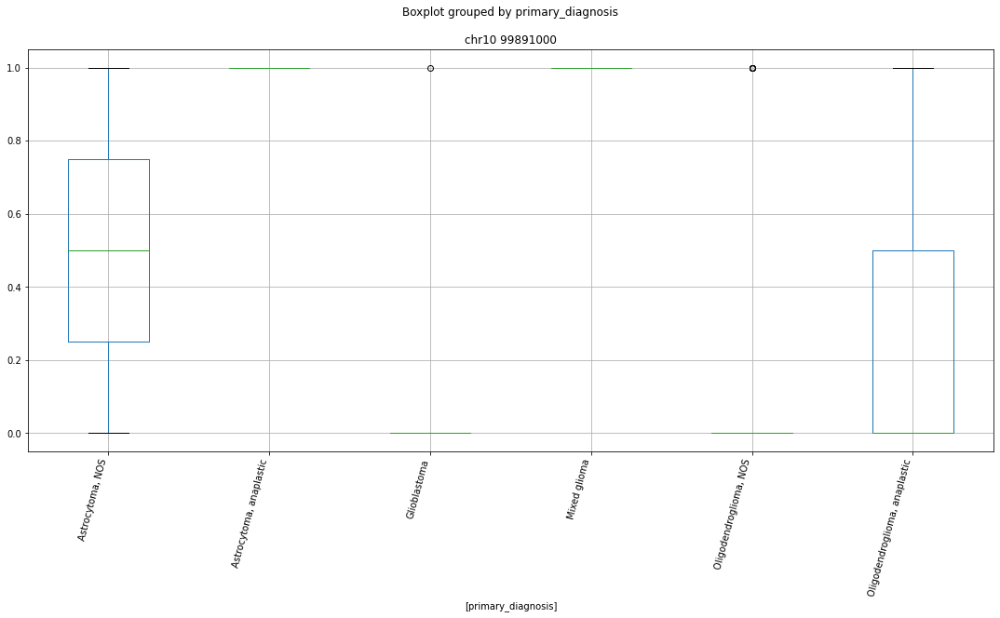

 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr20 45646000


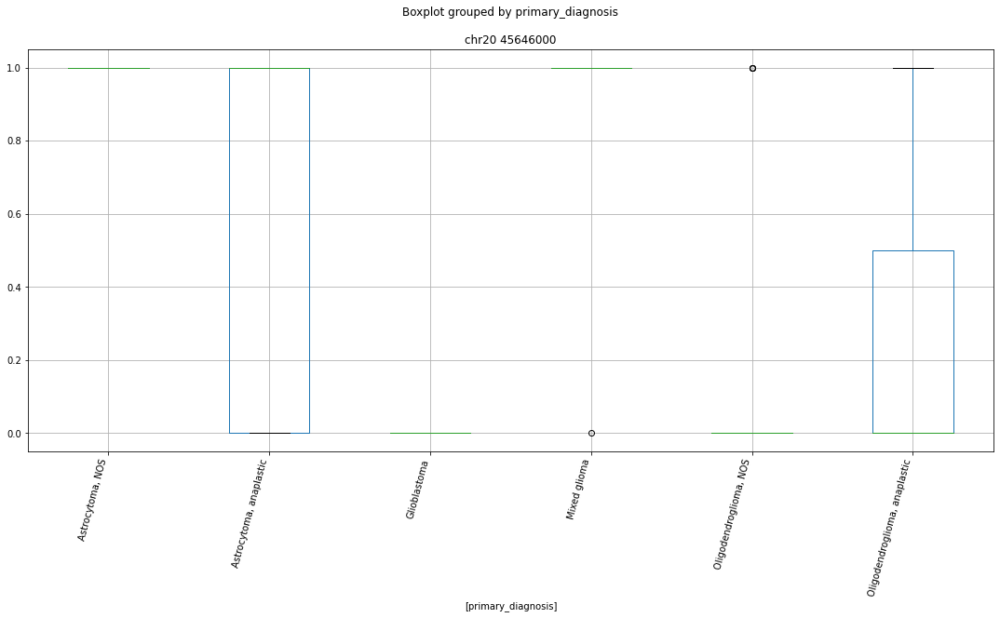

 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr2 71160000


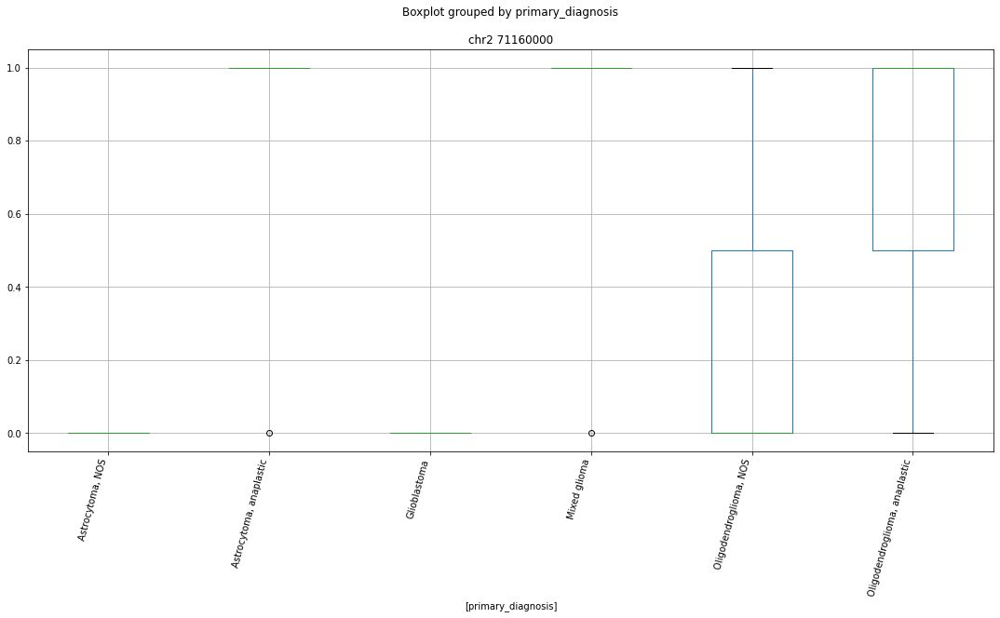

 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr11 61167000


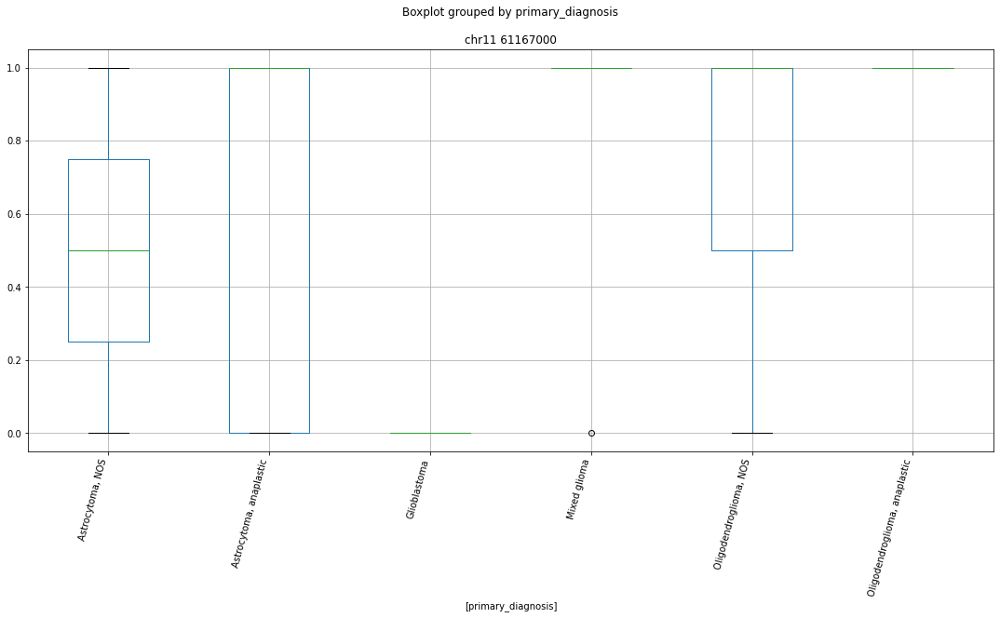

 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr11 83317000


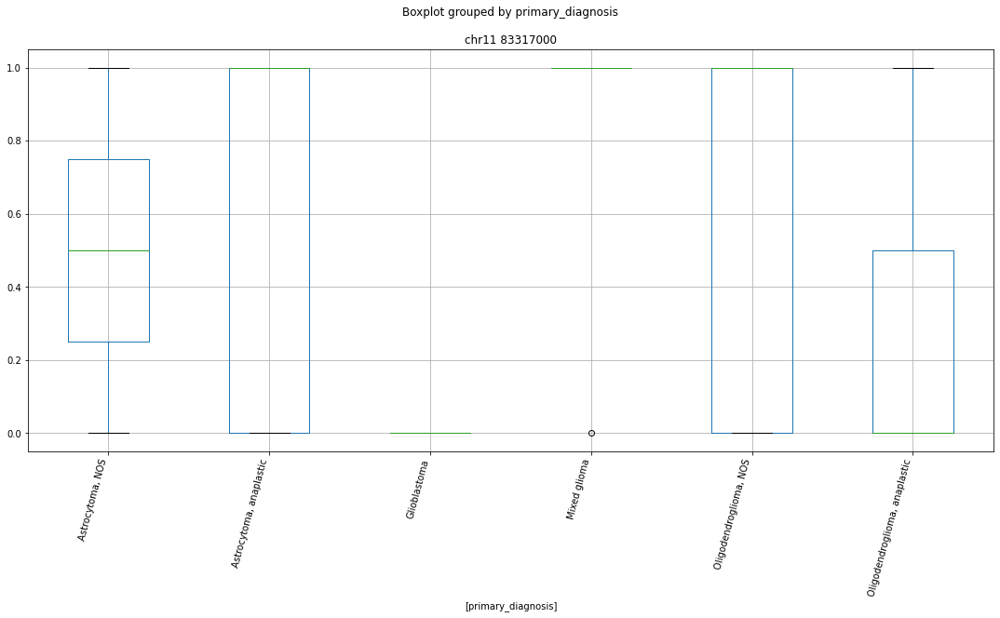

 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr14 89505000


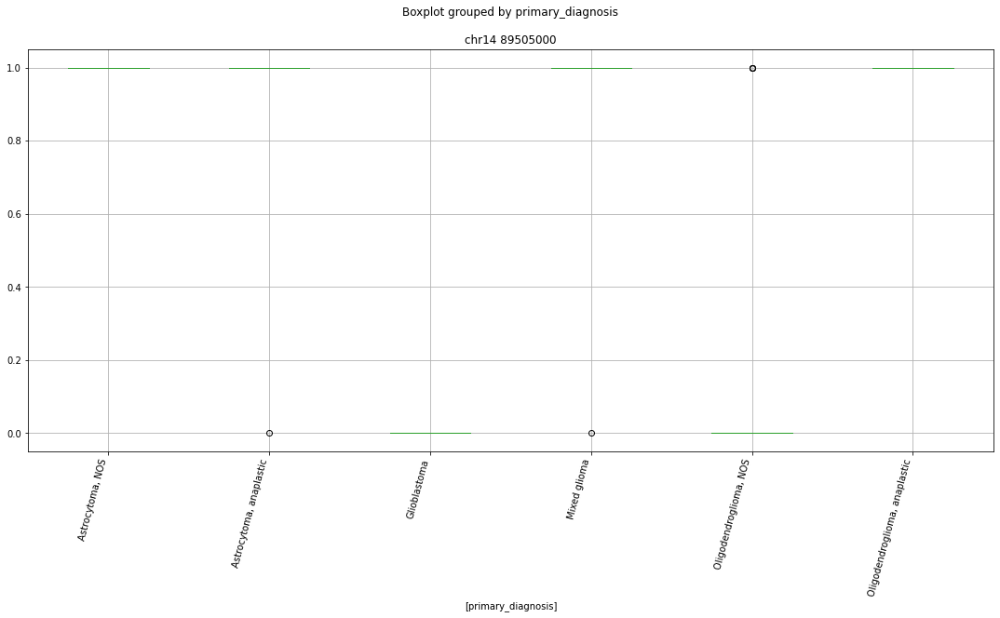

 p : 7.32689326172455e-15  ( t : 12.511533141004804 ) :  chr10 99891000


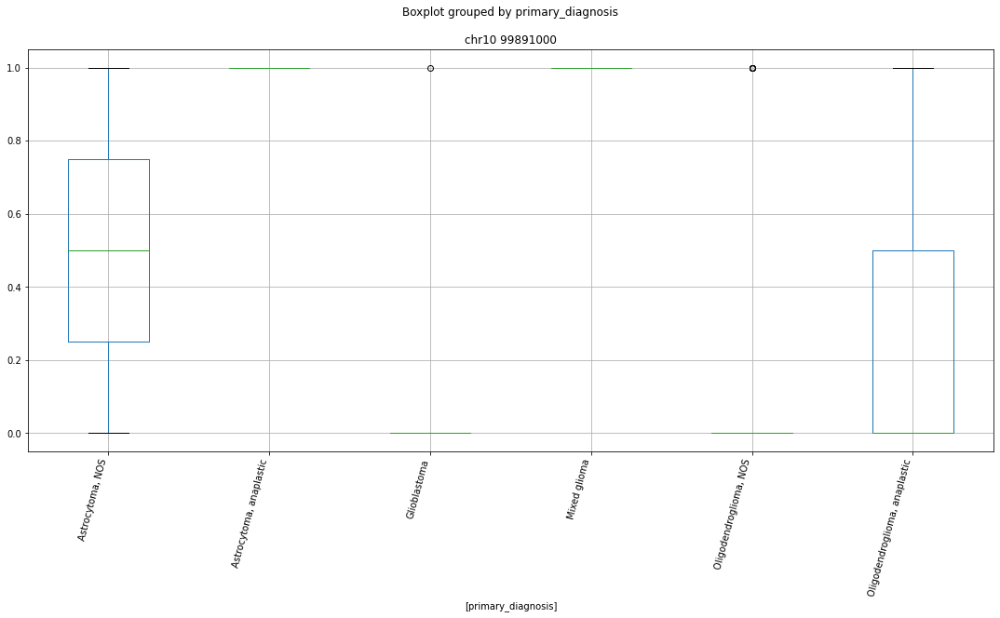

 p : 7.32689326172455e-15  ( t : 12.511533141004804 ) :  chr7 37291000


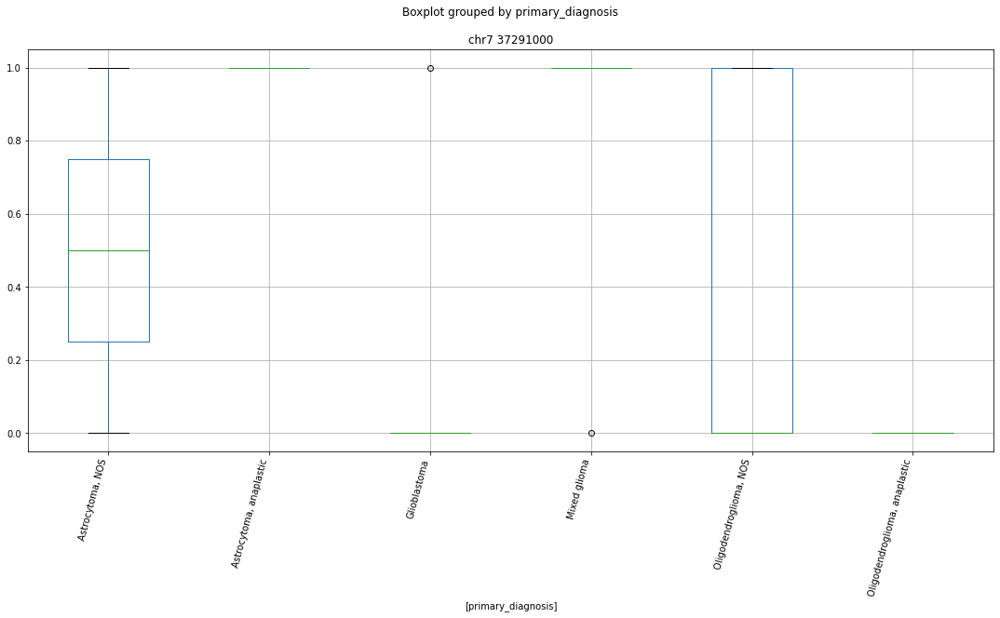

 p : 7.32689326172455e-15  ( t : 12.511533141004804 ) :  chr1 7601000


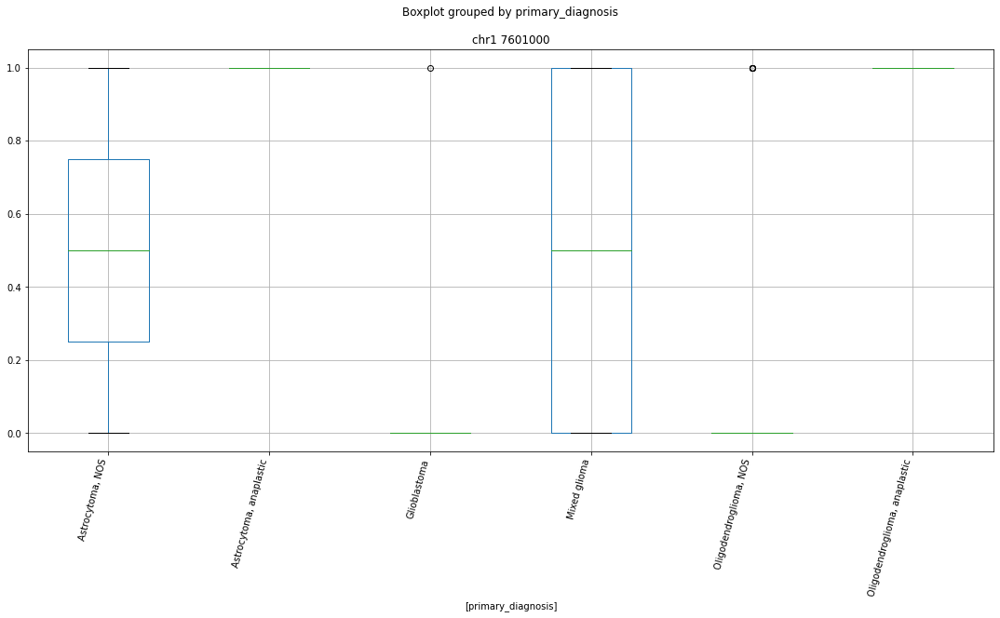

 p : 7.32689326172455e-15  ( t : 12.511533141004804 ) :  chr18 77029000


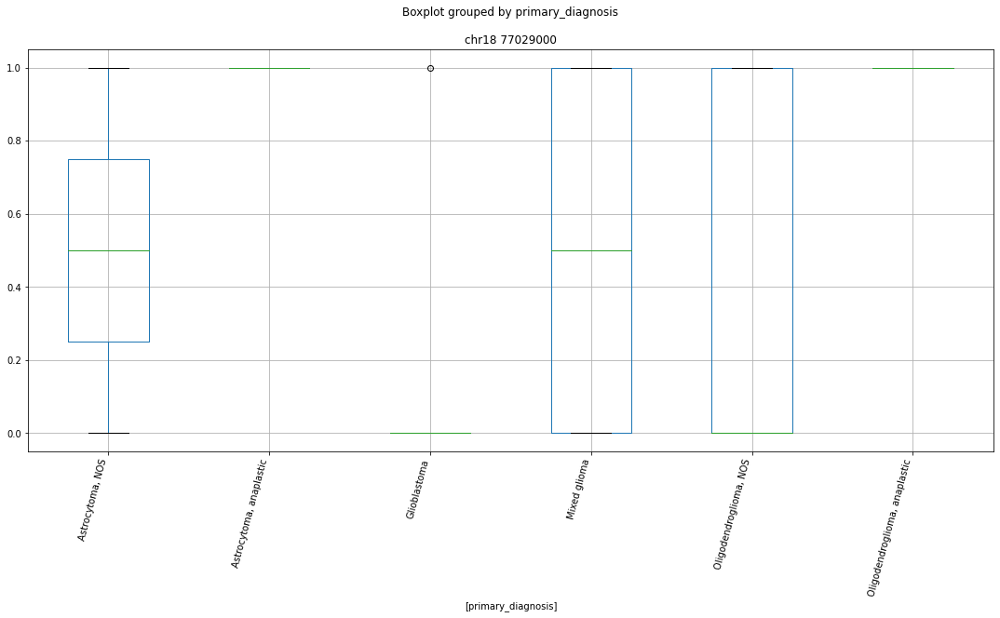

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr14 89505000


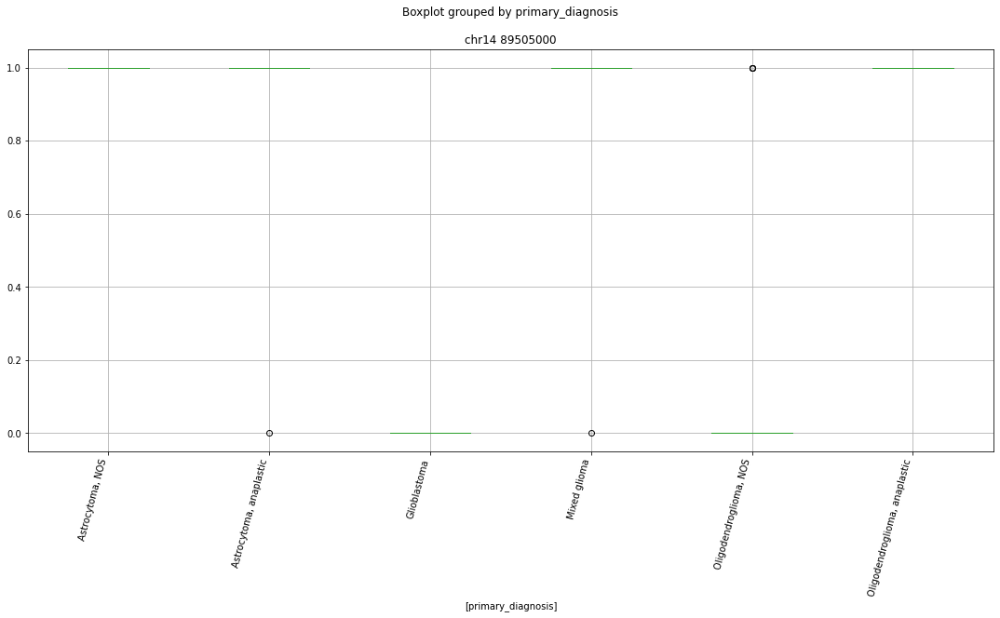

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr3 136722000


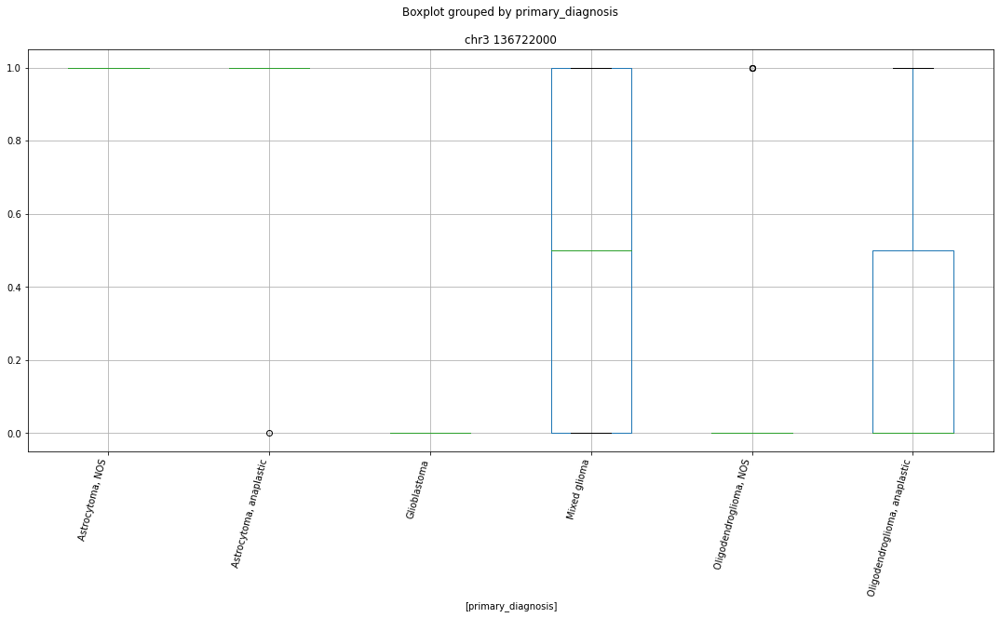

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr2 71160000


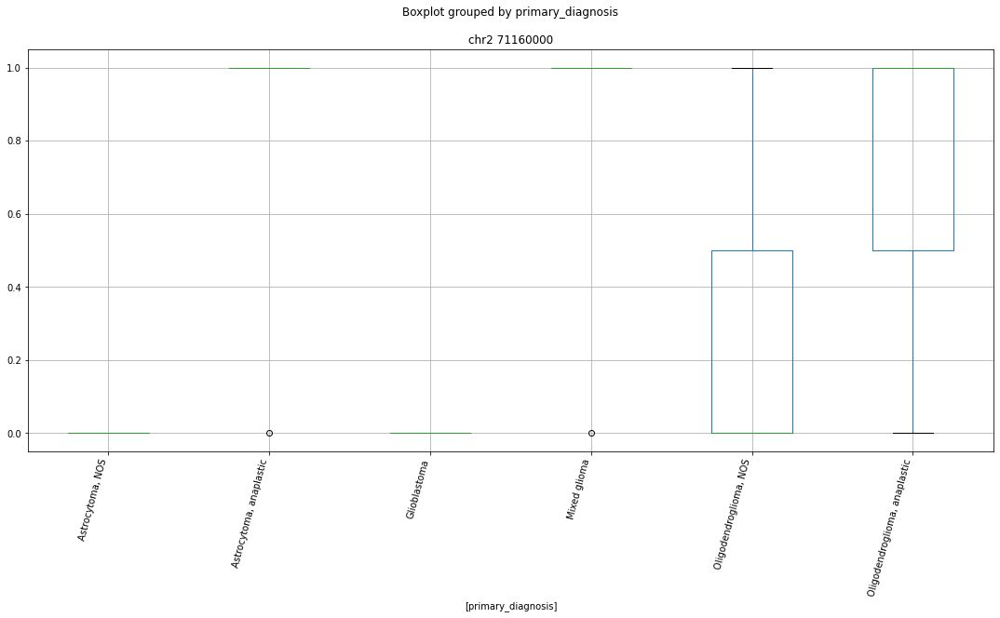

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr2 71543000


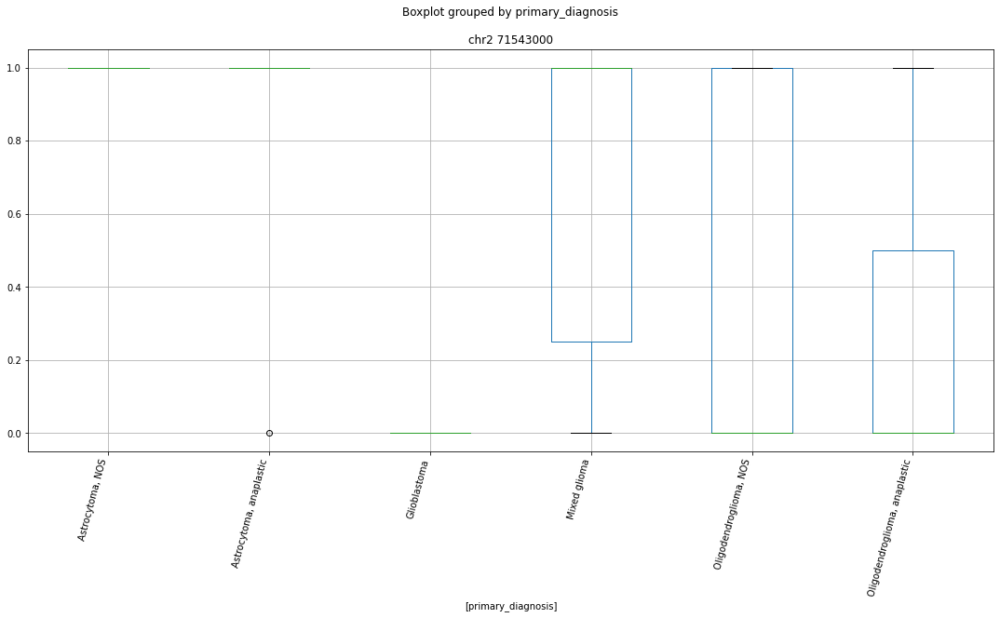

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr3 8439000


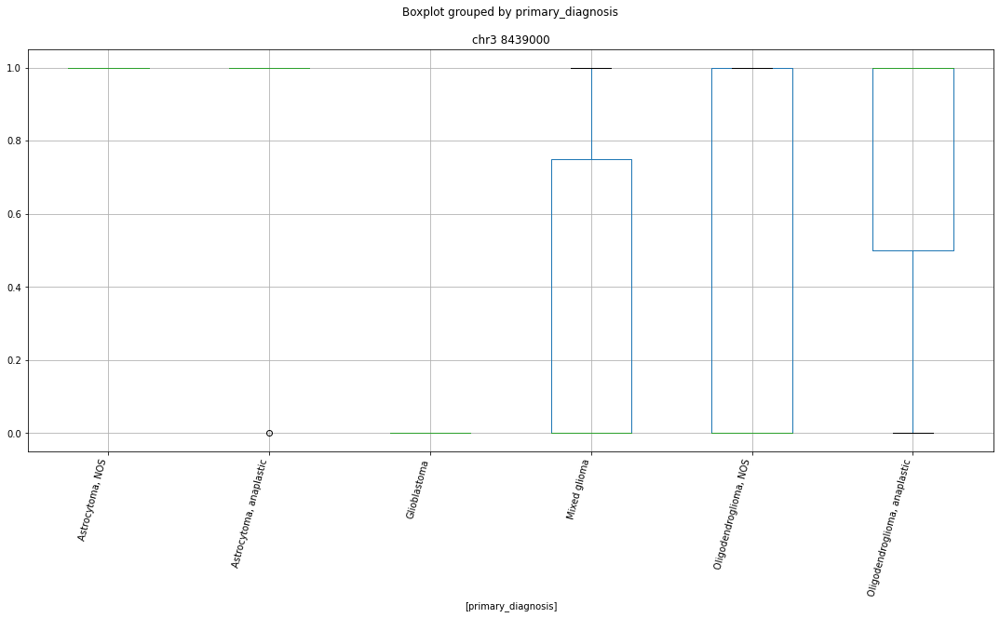

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr12 14354000


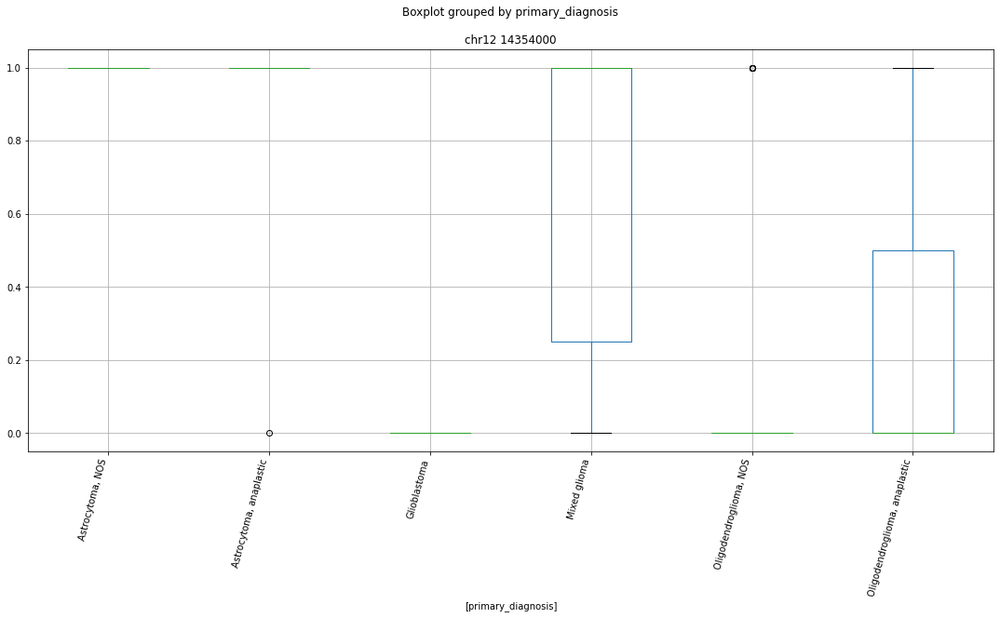

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr16 66630000


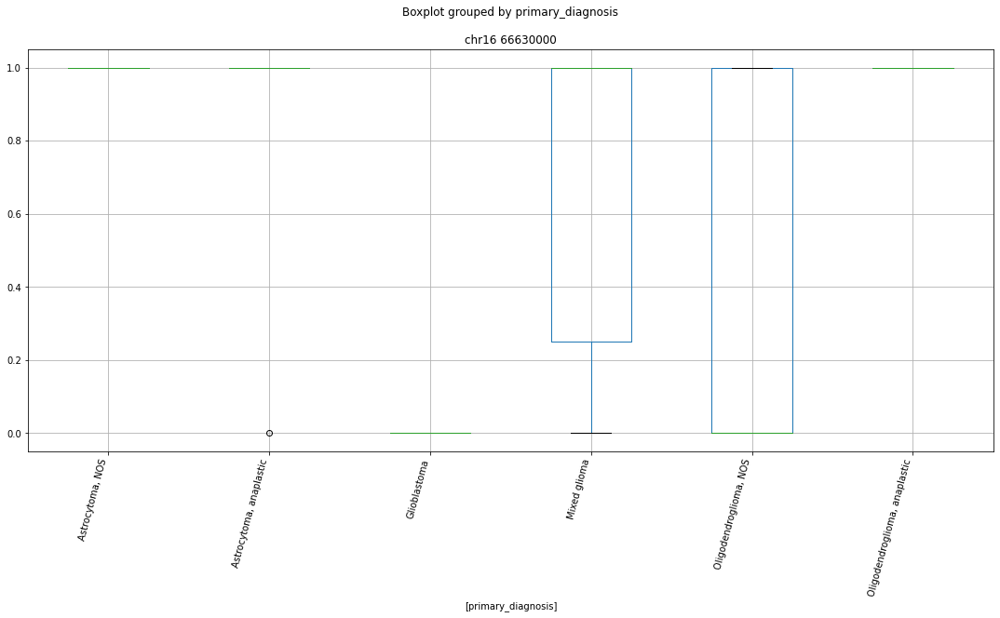

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr13 46162000


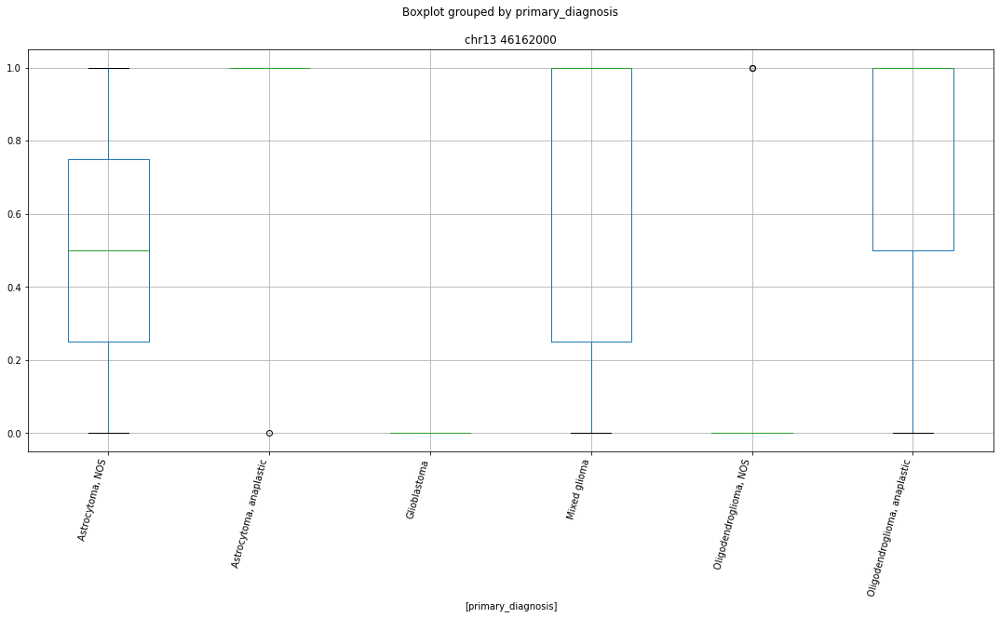

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr1 7952000


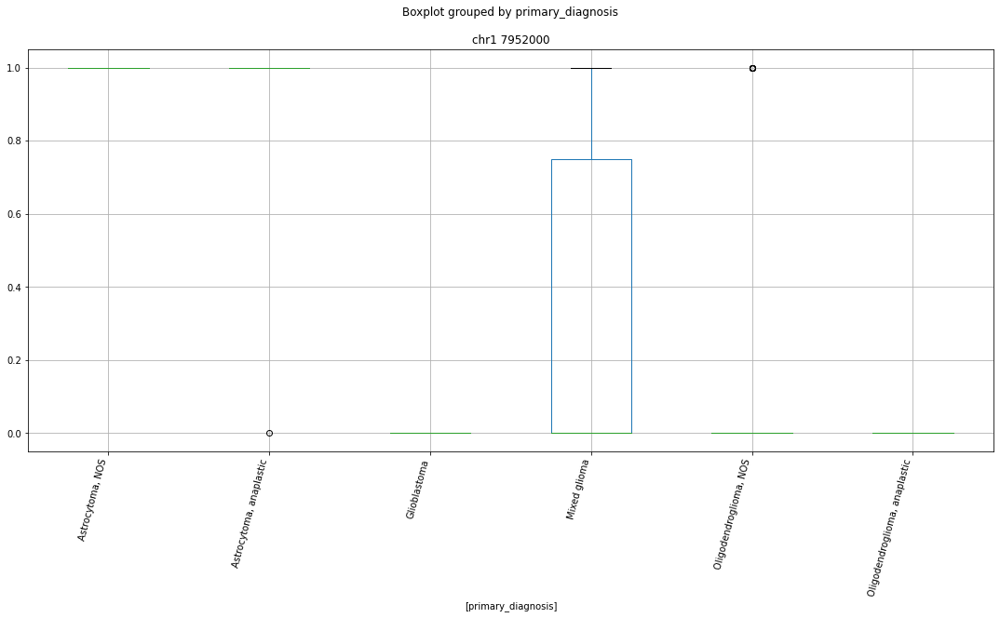

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr2 63808000


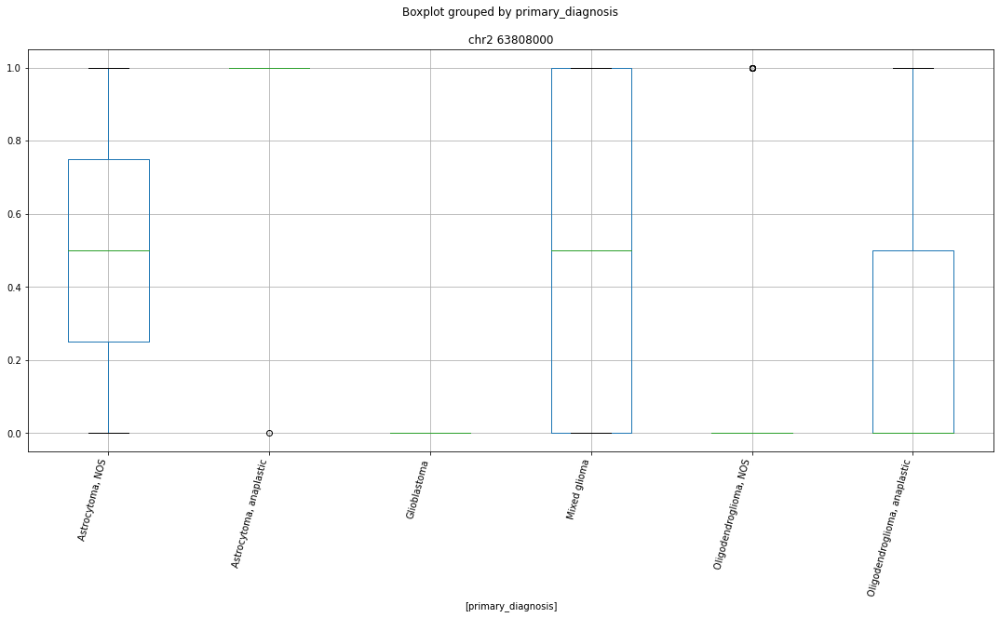

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr22 19083000


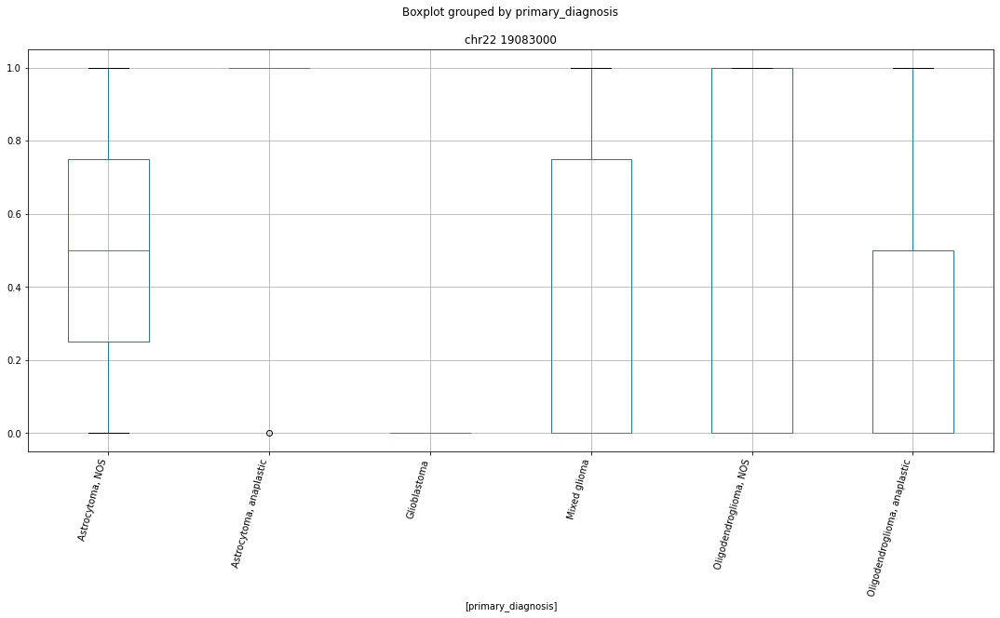

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr8 37927000


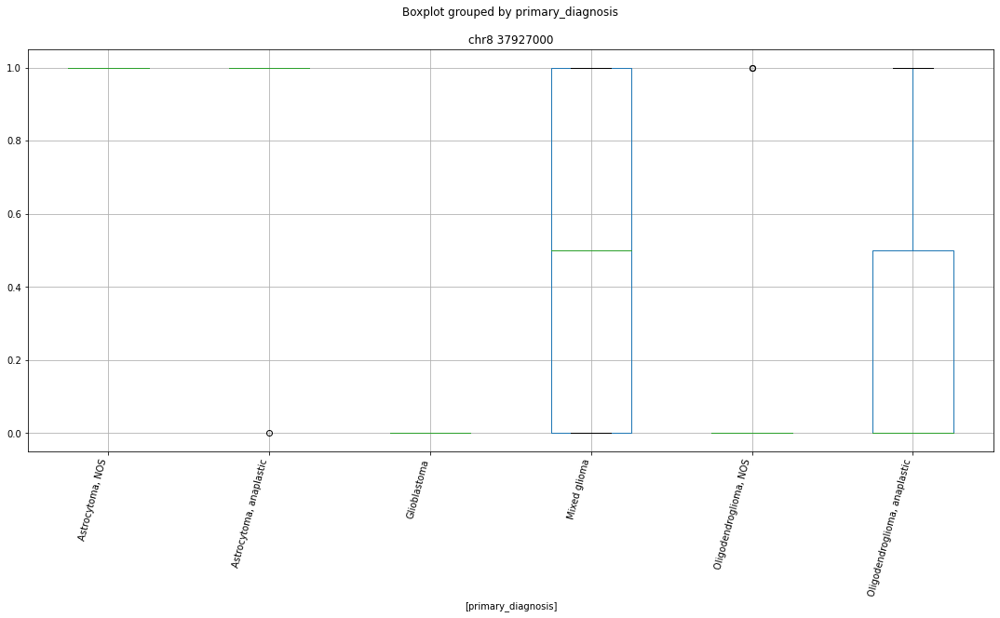

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr8 66231000


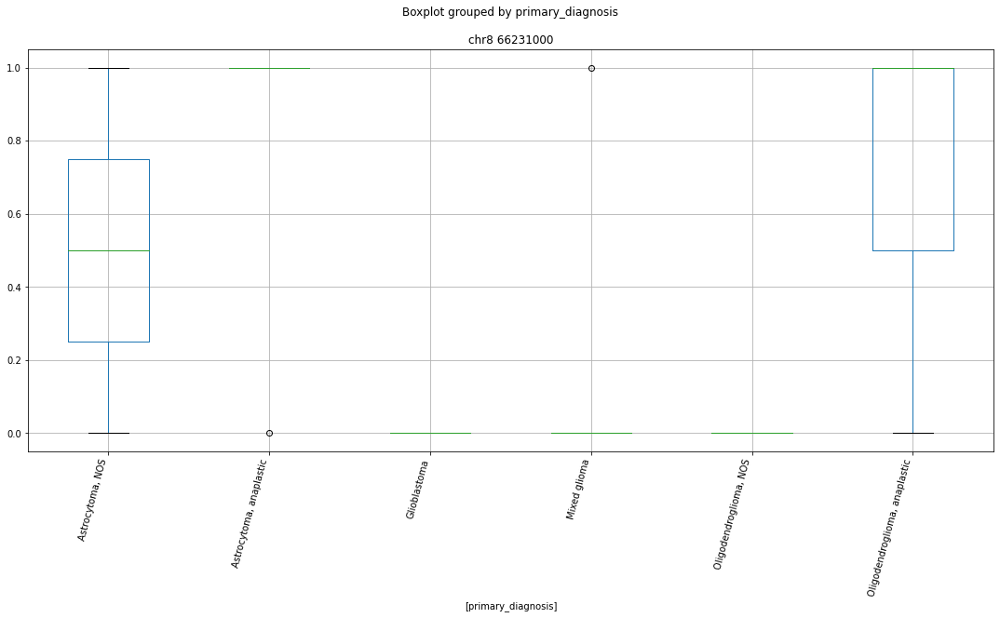

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr8 30247000


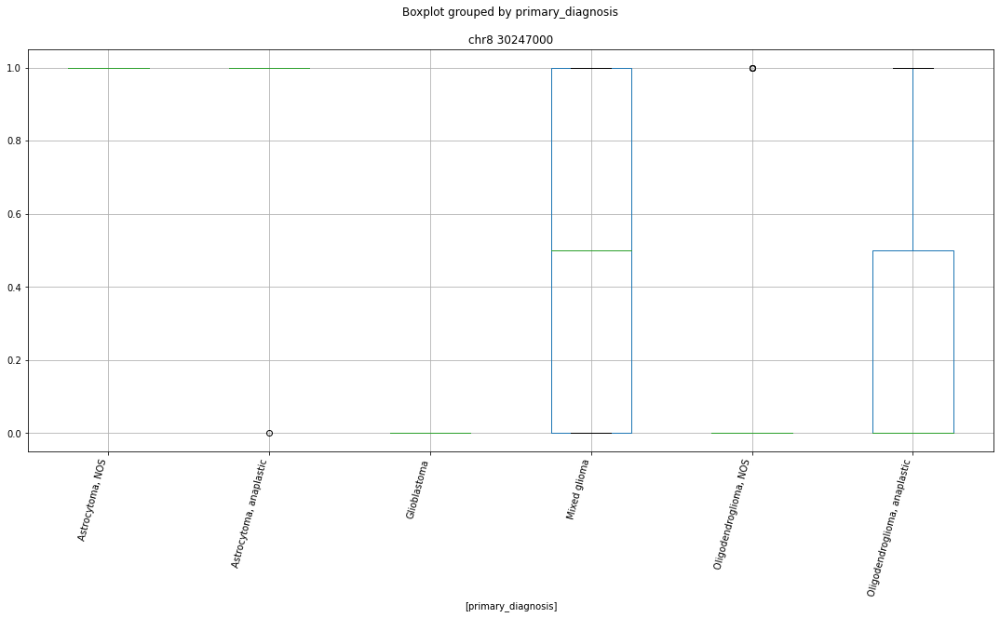

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr16 67712000


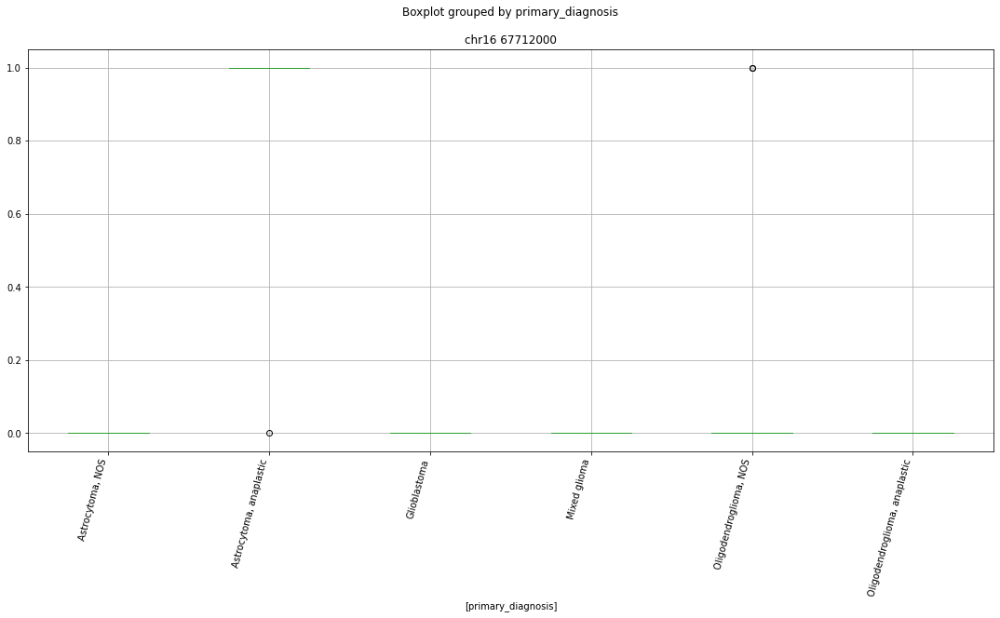

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr6 107802000


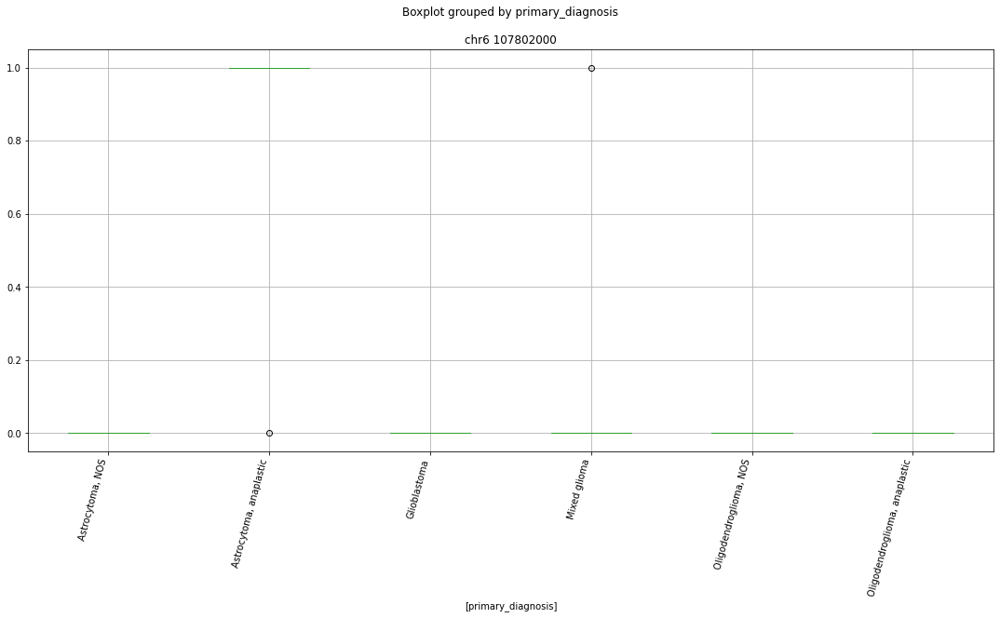

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr5 132983000


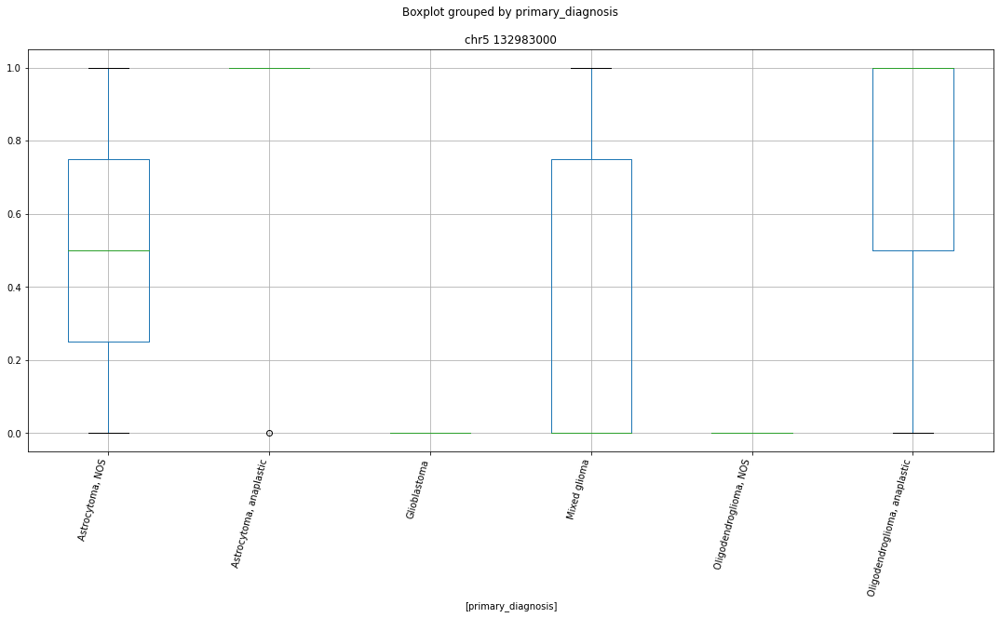

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr20 5701000


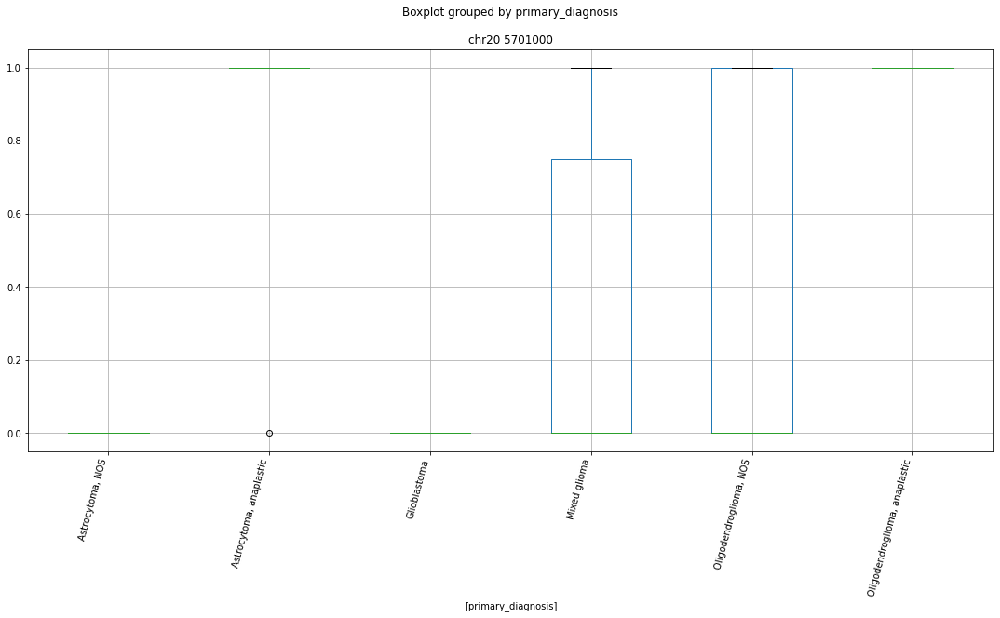

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr10 125517000


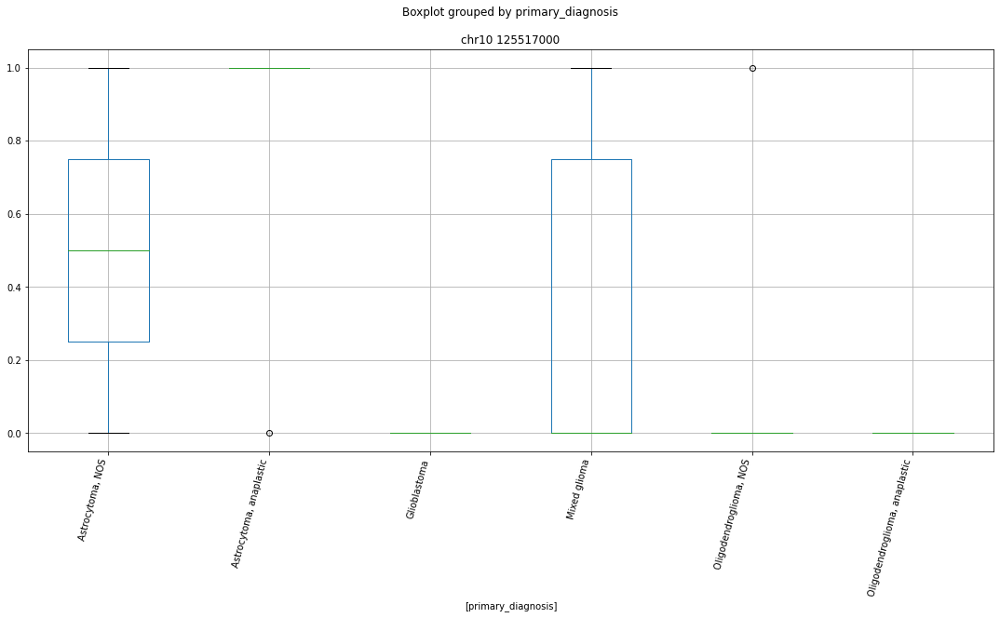

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr11 31972000


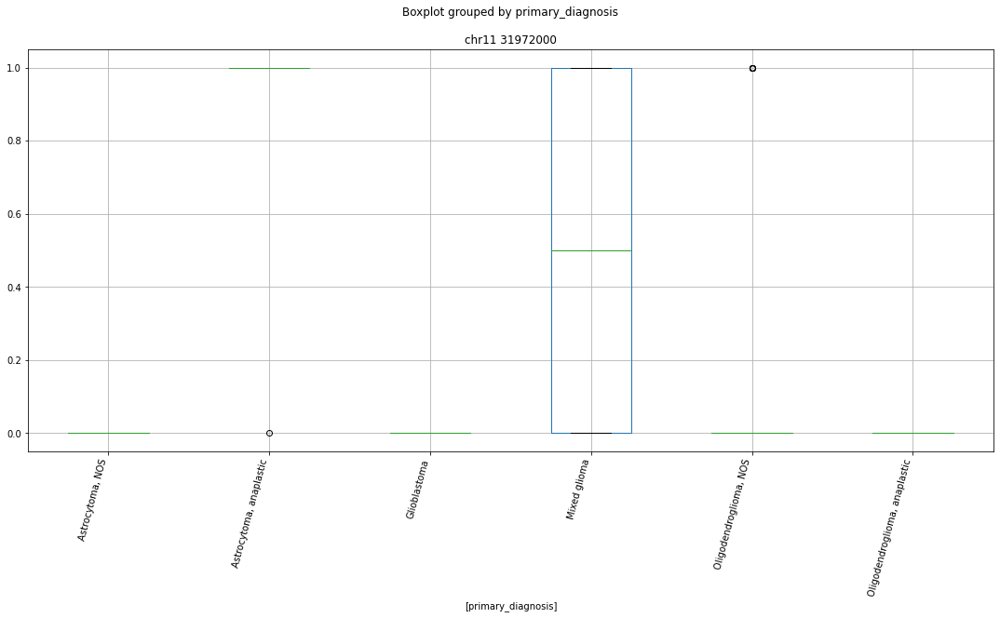

 p : 2.03173192681254e-13  ( t : 9.64122483786521 ) :  chr11 61167000


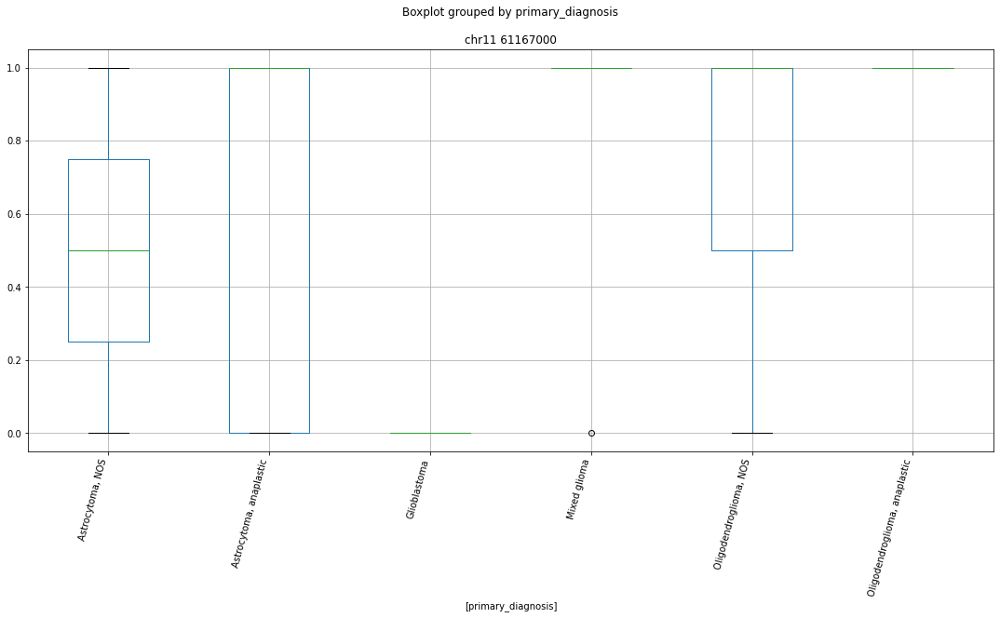

 p : 1.3824096980508297e-11  ( t : 8.492772985453934 ) :  chr9 129662000


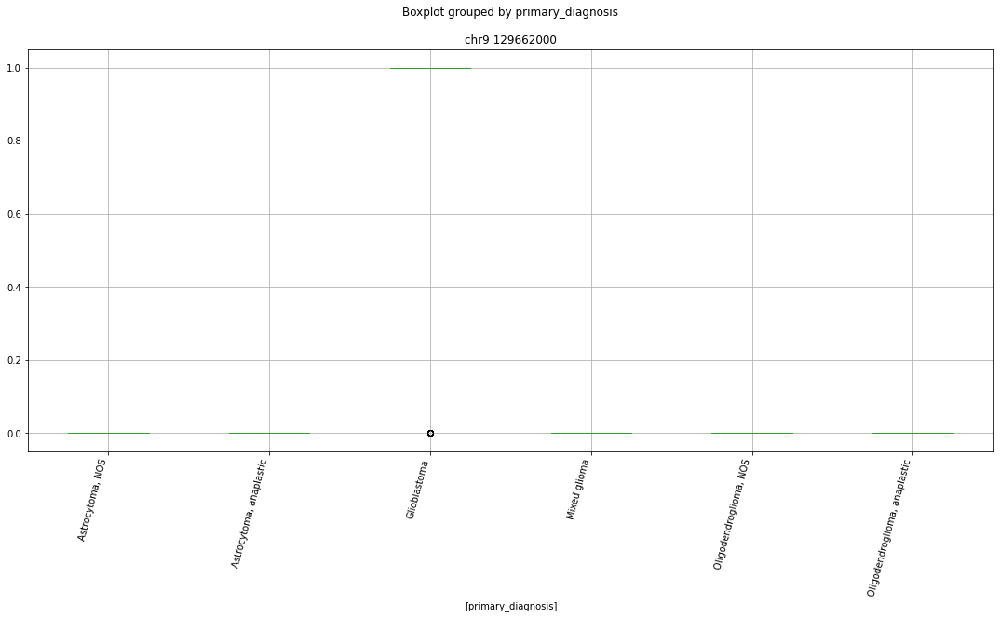

 p : 1.9864071913231304e-11  ( t : 9.677223188944682 ) :  chr18 77029000


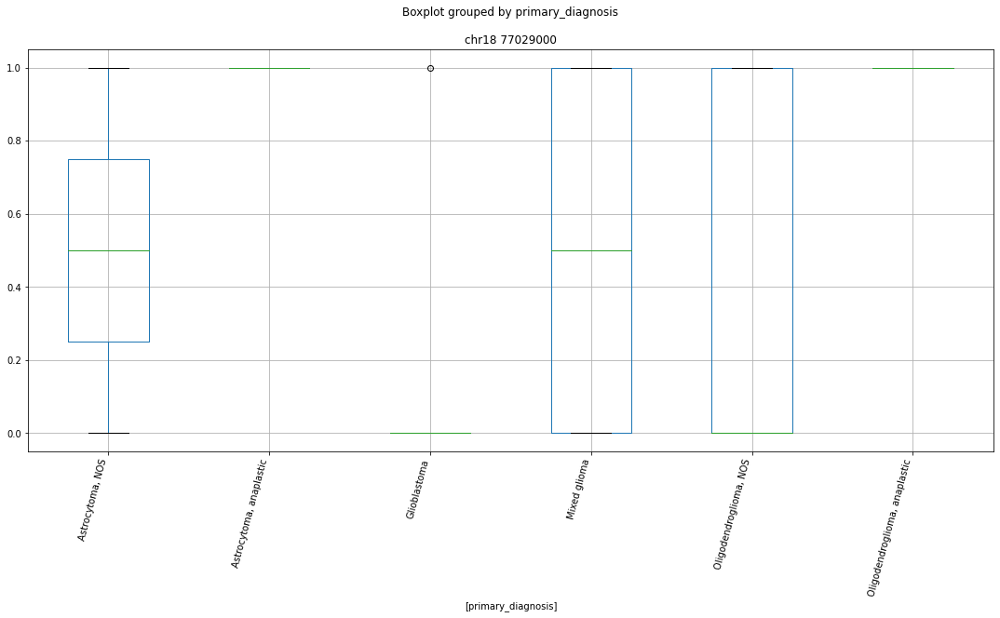

 p : 1.9864071913231304e-11  ( t : 9.677223188944682 ) :  chr1 7601000


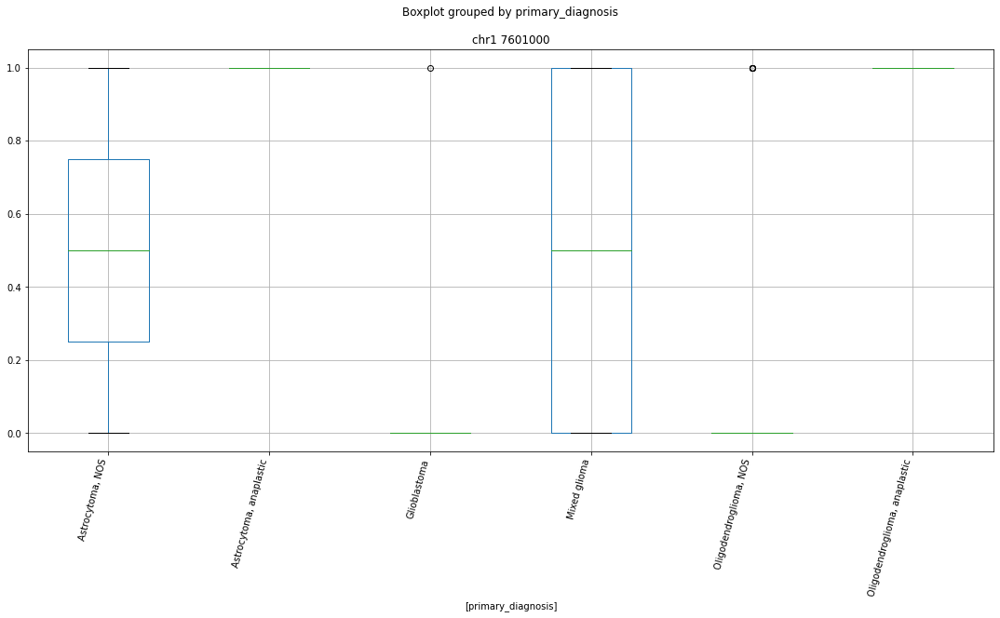

 p : 1.9864071913231304e-11  ( t : 9.677223188944682 ) :  chr1 98513000


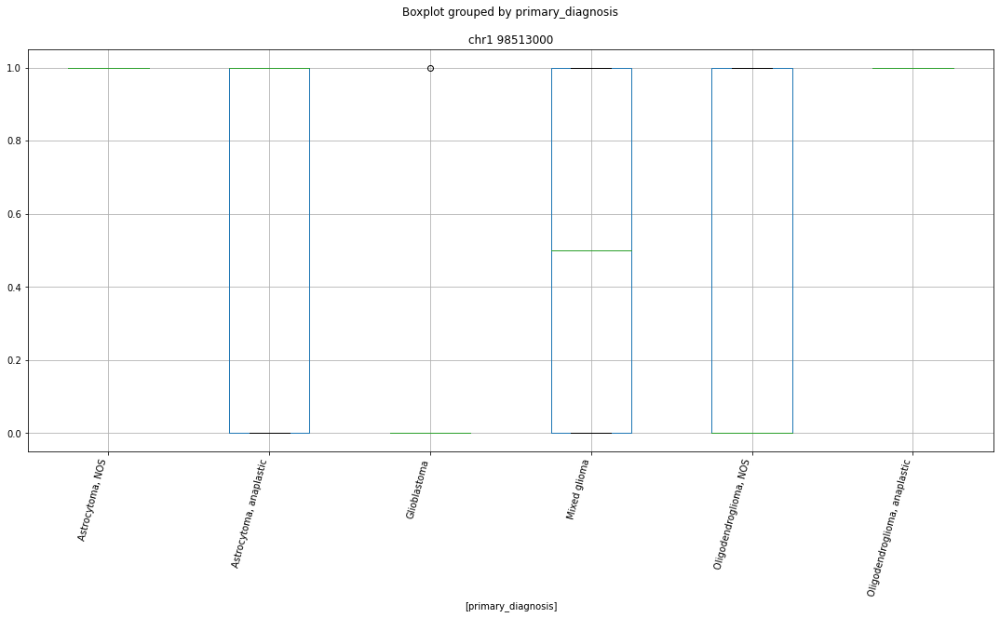

 p : 1.9864071913231304e-11  ( t : 9.677223188944682 ) :  chr15 62691000


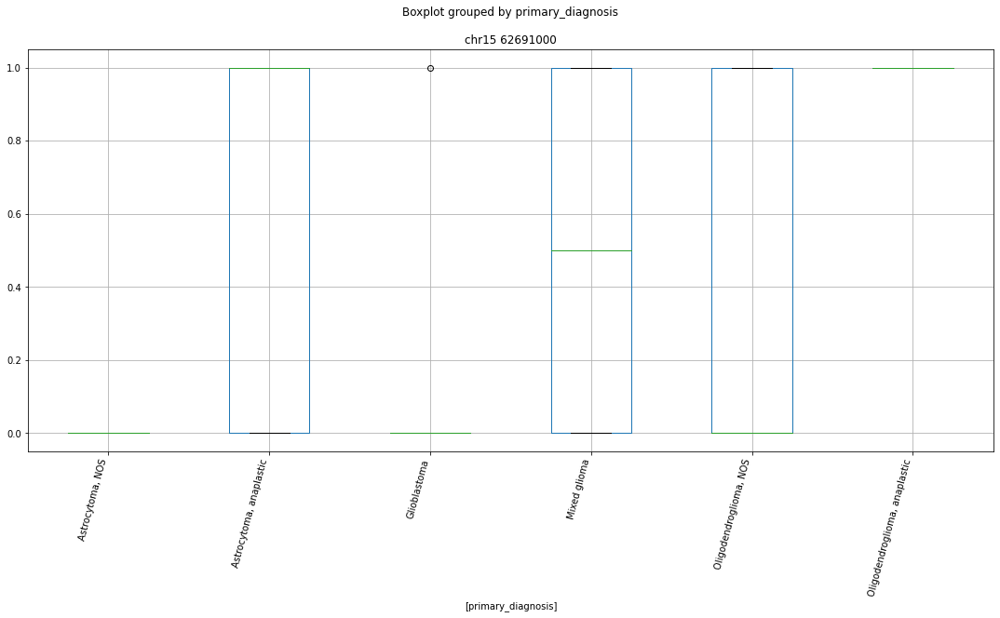

 p : 1.9864071913231304e-11  ( t : 9.677223188944682 ) :  chr16 49211000


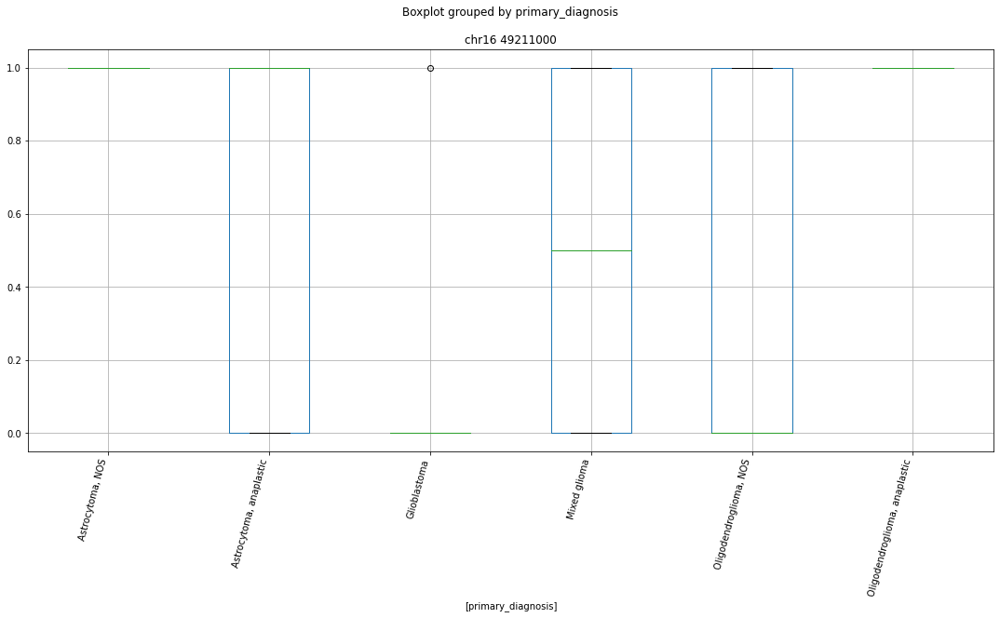

 p : 1.9864071913231304e-11  ( t : 9.677223188944682 ) :  chr17 19475000


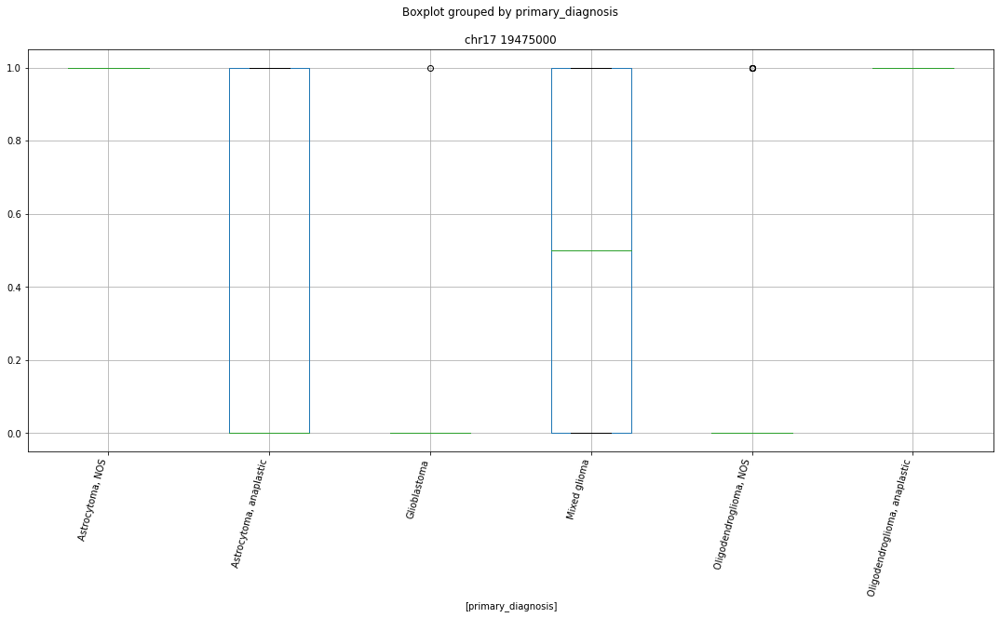

Clustermapping
['chr1 10427000' 'chr1 106413000' 'chr1 108159000' ... 'chrY 12879000'
 'primary_diagnosis' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


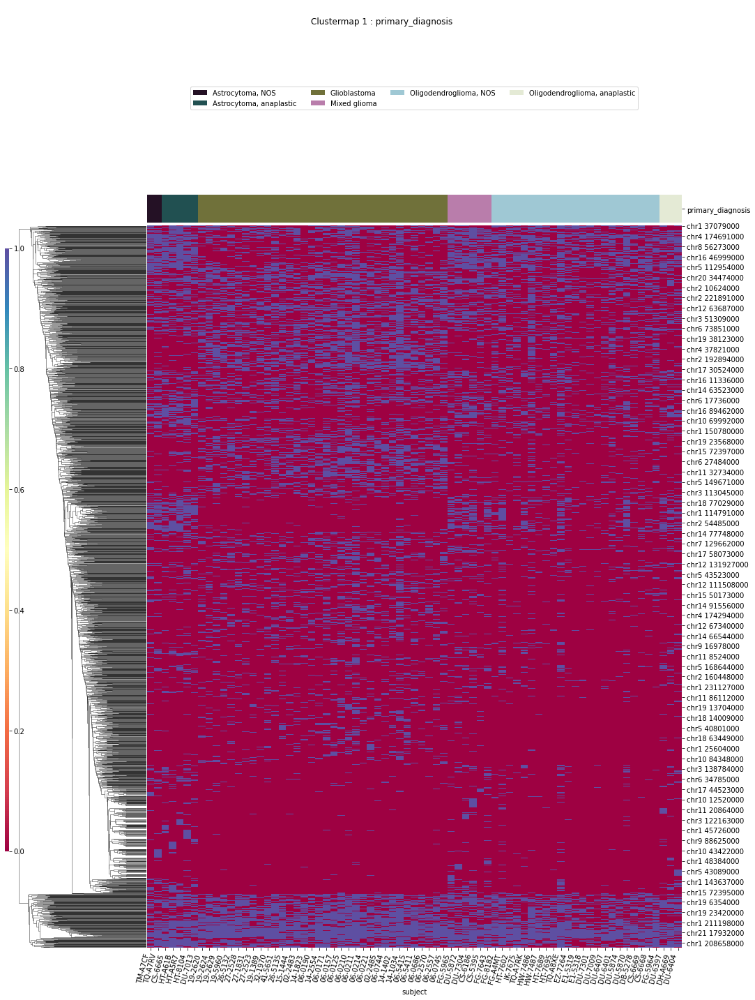

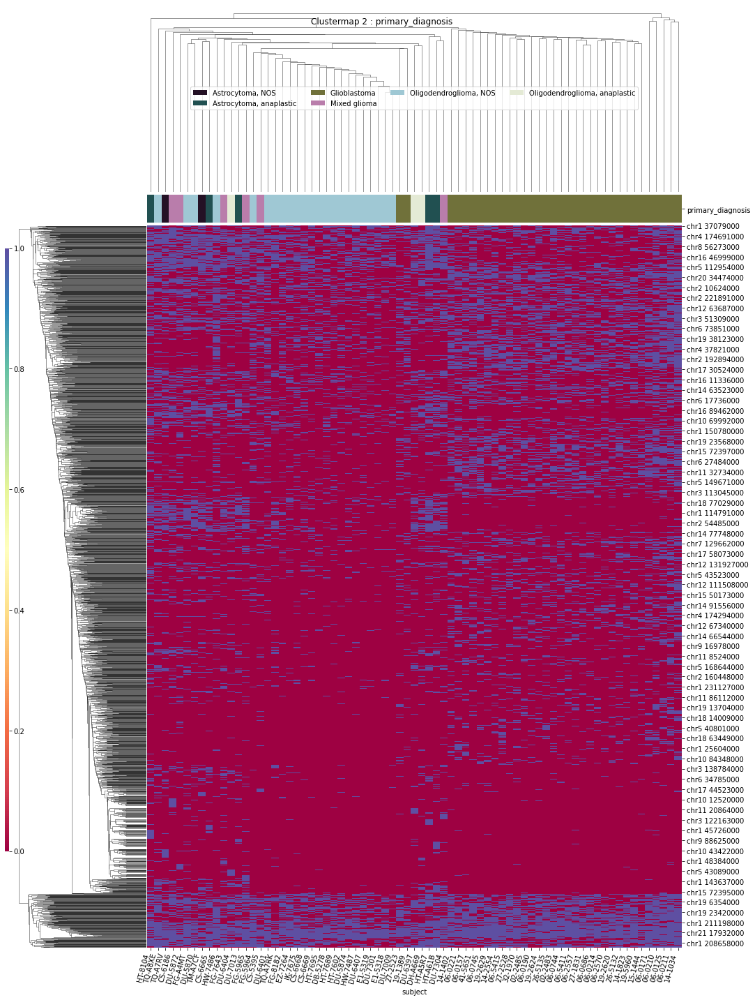

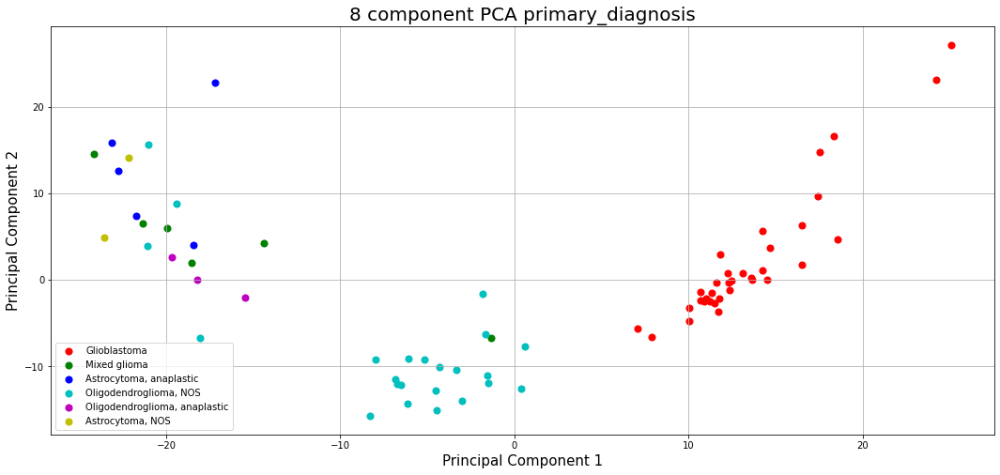

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 108159000' 'chr1 108676000' 'chr1 109176000' 'chr1 111234000'
 'chr1 111529000' 'chr1 111800000' 'chr1 11249000' 'chr1 112641000'
 'chr1 112729000' 'chr1 113062000' 'chr1 114480000' 'chr1 114791000'
 'chr1 114805000' 'chr1 117300000' 'chr1 13394000' 'chr1 13659000'
 'chr1 145763000' 'chr1 145765000' 'chr1 145768000' 'chr1 147062000'
 'chr1 147948000' 'chr1 150850000' 'chr1 150851000' 'chr1 152144000'
 'chr1 152472000' 'chr1 153575000' 'chr1 153583000' 'chr1 155701000'
 'chr1 160533000' 'chr1 160936000' 'chr1 161615000' 'chr1 161617000'
 'chr1 163545000' 'chr1 167030000' 'chr1 173614000' 'chr1 176058000'
 'chr1 179039000' 'chr1 179041000' 'chr1 179419000' 'chr1 192858000'
 'chr1 197405000' 'chr1 202190000' 'chr1 202739000' 'chr1 203918000'
 'chr1 209128000' 'chr1 212725000' 'chr1 212780000' 'chr1 219544000'
 'chr1 22159000' 'chr1 222486000' 'chr1 226114000' 'chr1 226115000'
 'chr1 23503000' 'chr1 23504000' 'chr1 237128000' 'chr1 2376

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


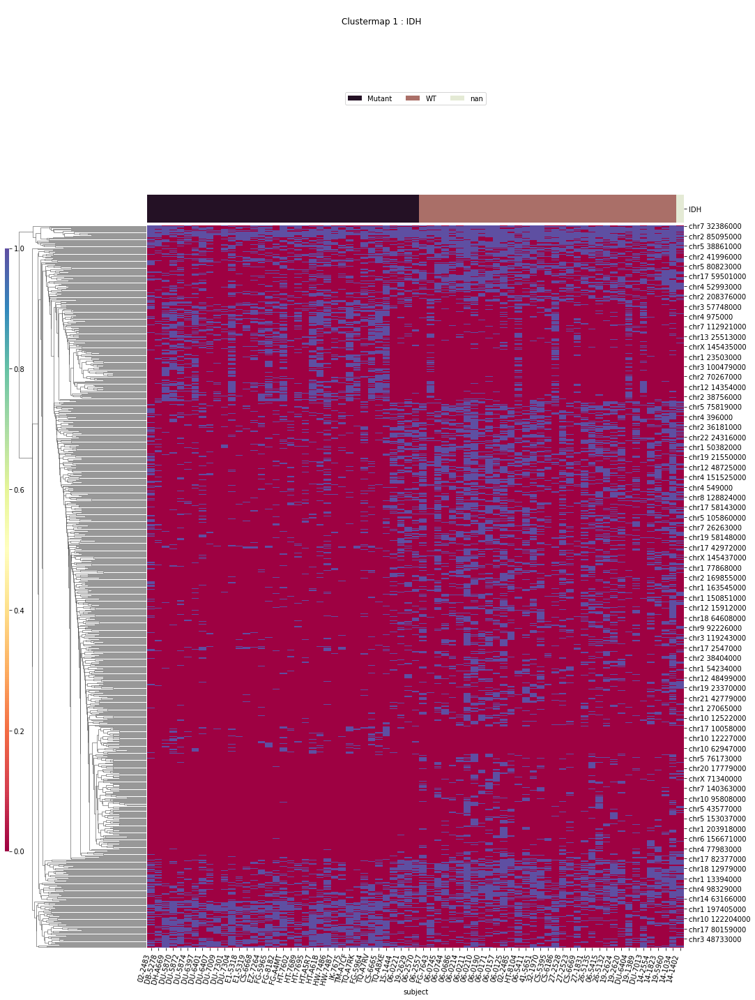

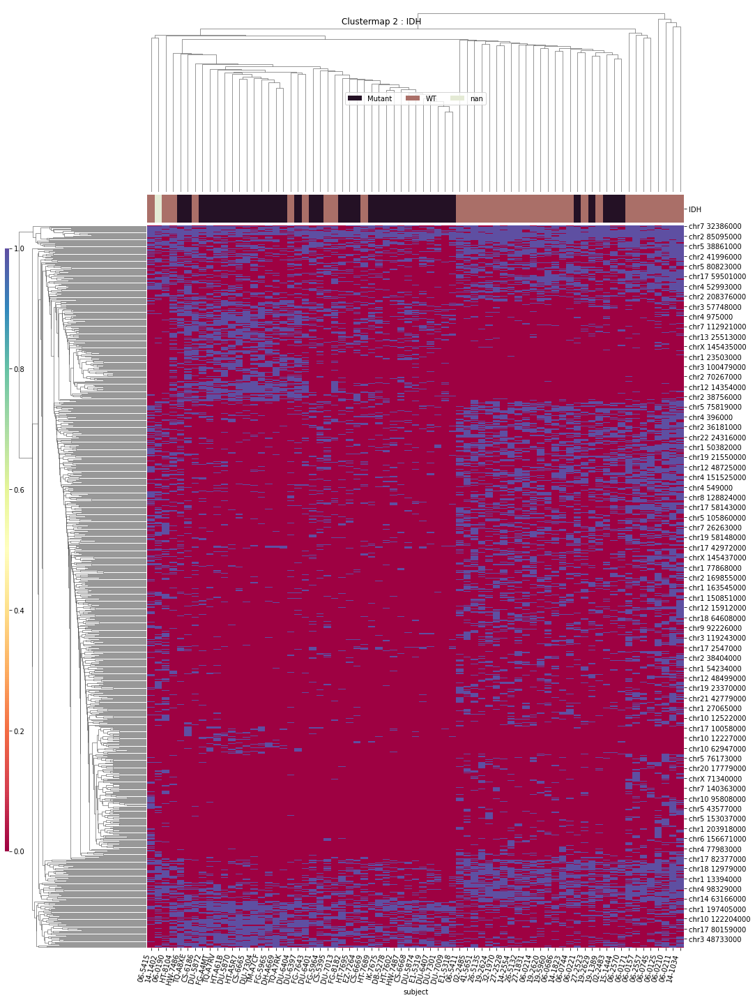

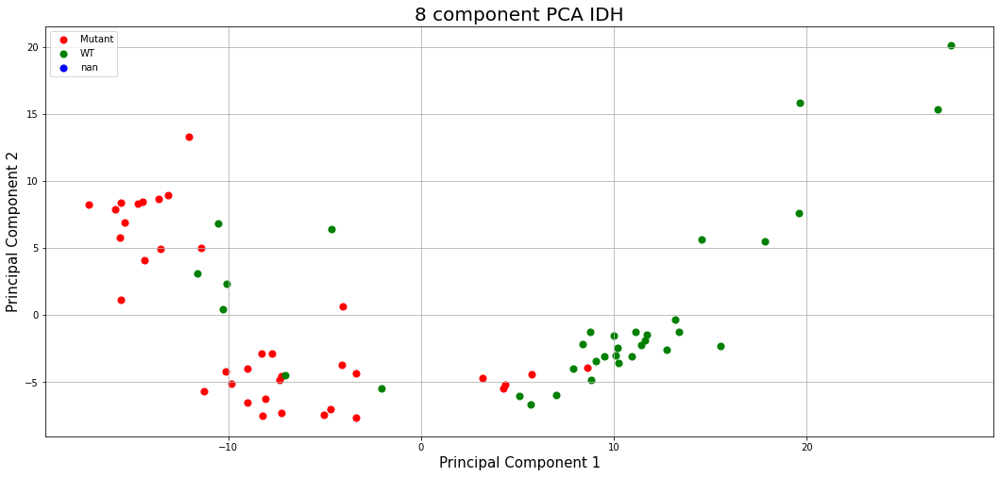

x1p19q
T-Testing
Boxplotting
Clustermapping
['chr1 108518000' 'chr1 112729000' 'chr1 11305000' 'chr1 114803000'
 'chr1 12009000' 'chr1 145763000' 'chr1 145765000' 'chr1 151768000'
 'chr1 151770000' 'chr1 152472000' 'chr1 153575000' 'chr1 160934000'
 'chr1 160936000' 'chr1 161280000' 'chr1 161615000' 'chr1 163545000'
 'chr1 167030000' 'chr1 176058000' 'chr1 179039000' 'chr1 189226000'
 'chr1 202190000' 'chr1 202739000' 'chr1 208658000' 'chr1 219546000'
 'chr1 235310000' 'chr1 246363000' 'chr1 247521000' 'chr1 24801000'
 'chr1 248677000' 'chr1 26802000' 'chr1 34081000' 'chr1 48191000'
 'chr1 48480000' 'chr1 50382000' 'chr1 52869000' 'chr1 52870000'
 'chr1 54561000' 'chr1 77868000' 'chr1 92025000' 'chr10 110768000'
 'chr10 118264000' 'chr10 120214000' 'chr10 122204000' 'chr10 133413000'
 'chr10 43423000' 'chr10 43466000' 'chr10 43544000' 'chr10 45513000'
 'chr10 69992000' 'chr10 86251000' 'chr10 92673000' 'chr10 92976000'
 'chr10 93971000' 'chr10 99892000' 'chr11 18122000' 'chr11 33244000

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


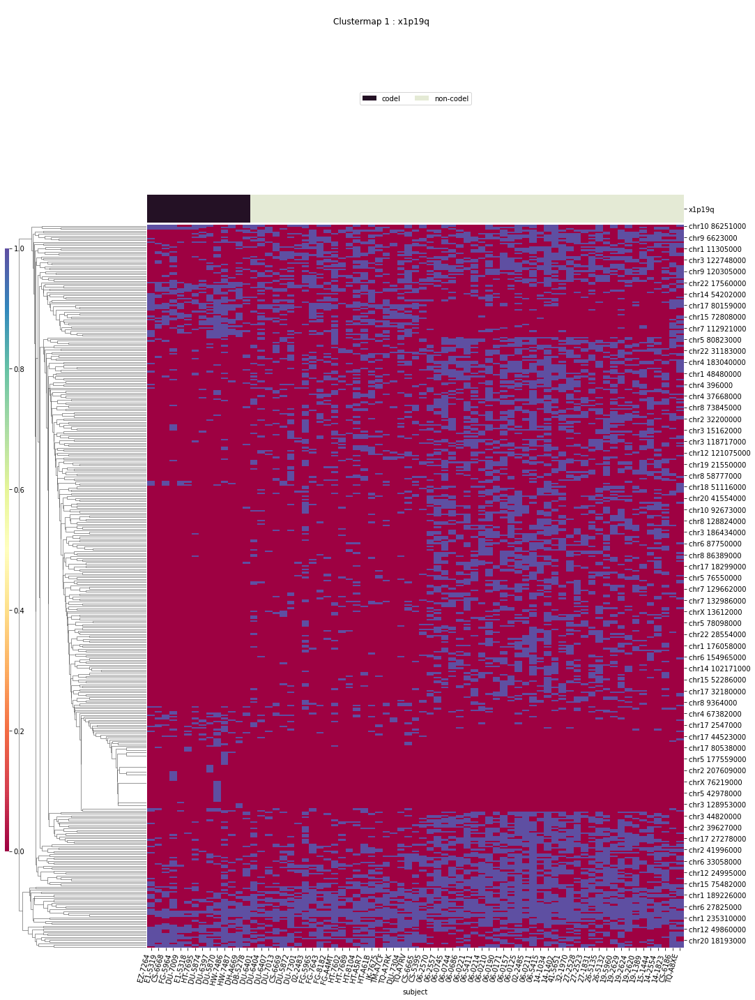

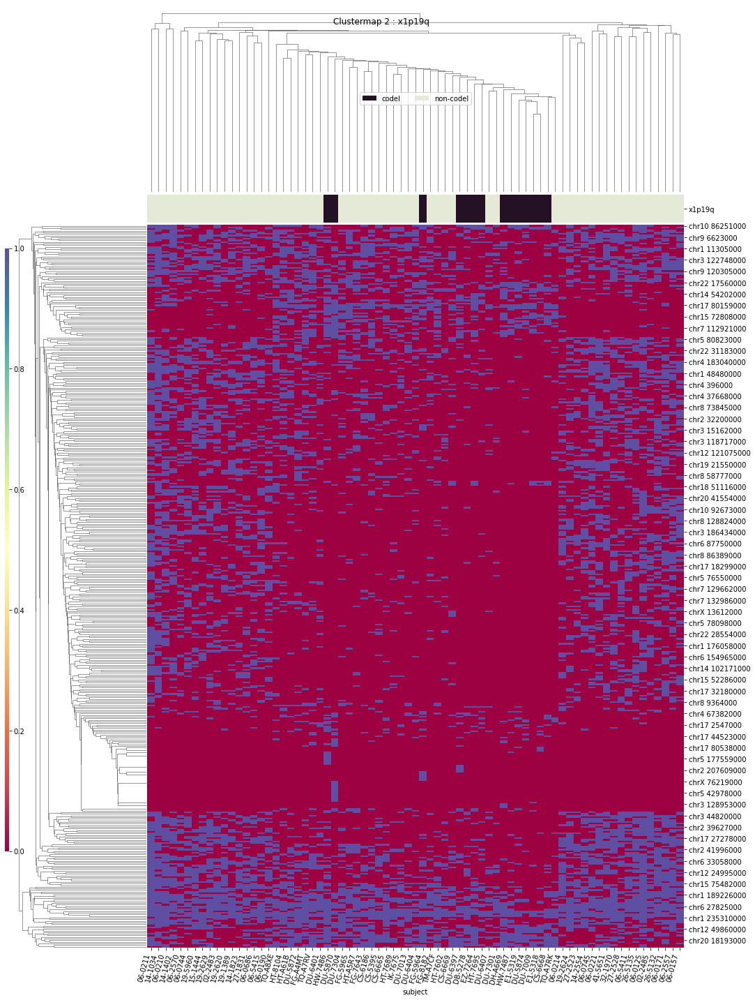

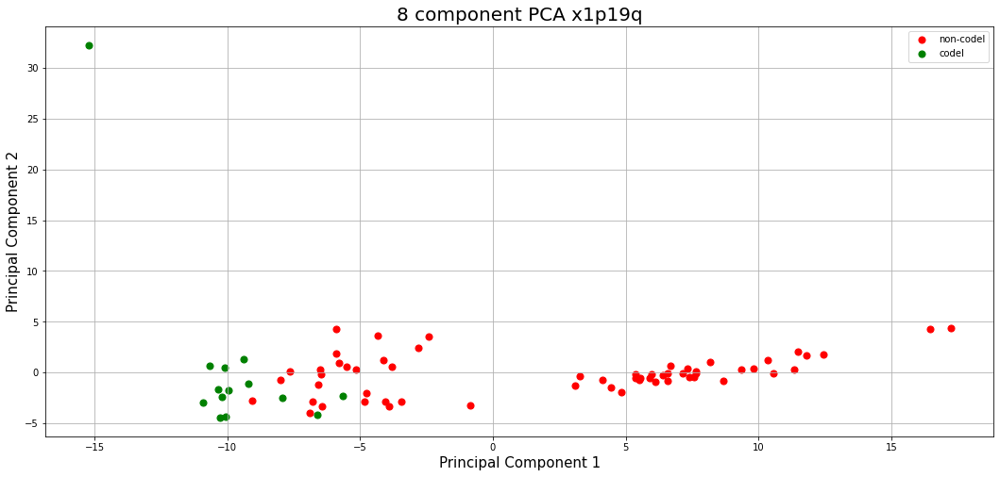

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 108159000' 'chr1 108518000' 'chr1 109176000'
 'chr1 111234000' 'chr1 112641000' 'chr1 112729000' 'chr1 113062000'
 'chr1 114791000' 'chr1 114805000' 'chr1 145768000' 'chr1 147734000'
 'chr1 147948000' 'chr1 147950000' 'chr1 150850000' 'chr1 151650000'
 'chr1 151652000' 'chr1 152144000' 'chr1 152145000' 'chr1 153583000'
 'chr1 154288000' 'chr1 161282000' 'chr1 161617000' 'chr1 162465000'
 'chr1 167030000' 'chr1 179041000' 'chr1 192858000' 'chr1 197405000'
 'chr1 206065000' 'chr1 209128000' 'chr1 212780000' 'chr1 213153000'
 'chr1 219544000' 'chr1 22159000' 'chr1 226114000' 'chr1 226115000'
 'chr1 231453000' 'chr1 23258000' 'chr1 23503000' 'chr1 237128000'
 'chr1 237670000' 'chr1 23852000' 'chr1 23854000' 'chr1 248676000'
 'chr1 248677000' 'chr1 26595000' 'chr1 26802000' 'chr1 27855000'
 'chr1 33510000' 'chr1 37079000' 'chr1 39869000' 'chr1 39914000'
 'chr1 43501000' 'chr1 43502000' 'chr1 45082000' 'chr1 54234000'
 'chr1 6306000' 'c

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


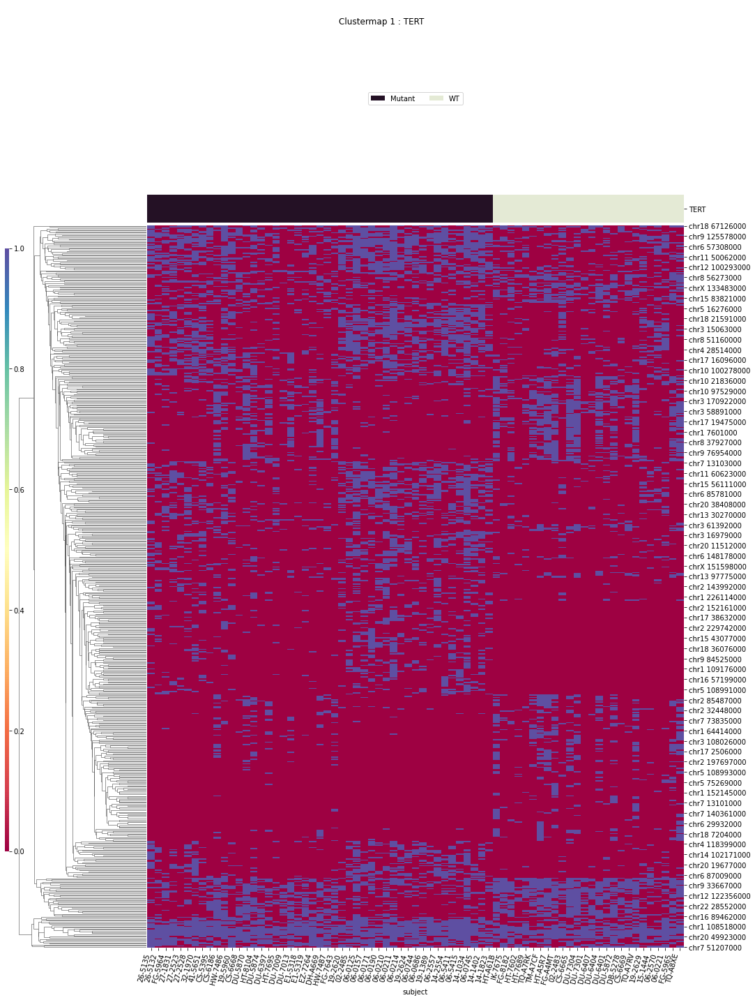

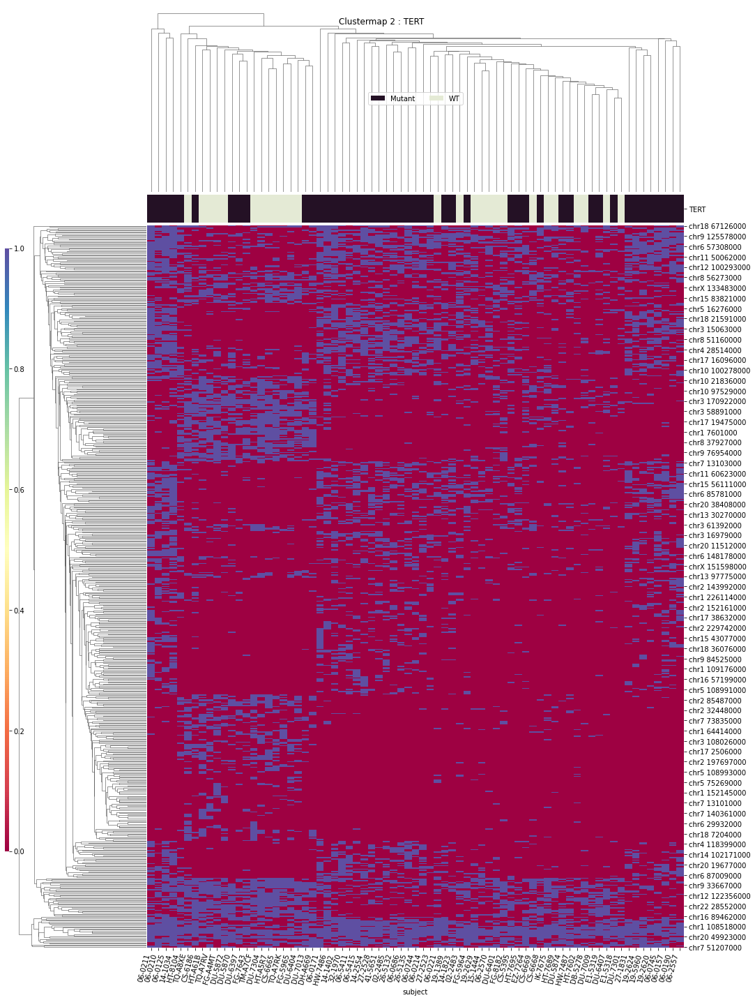

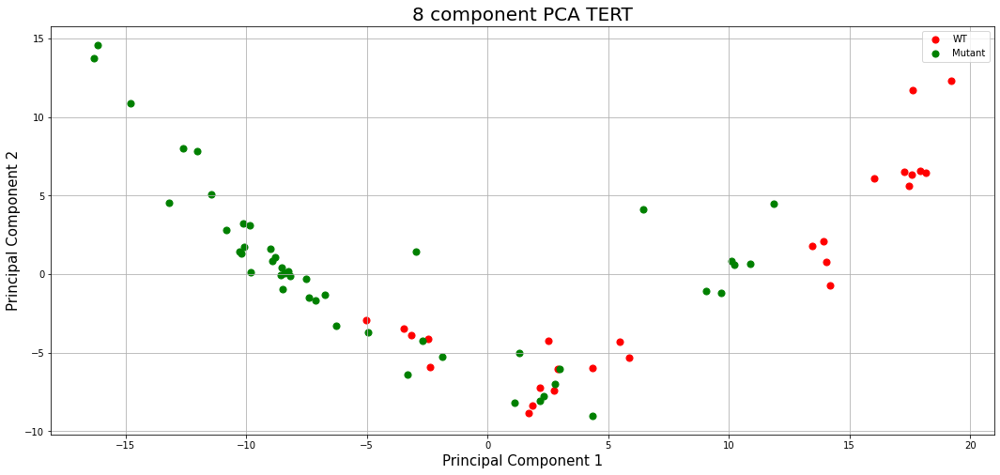

disease_type
T-Testing
Boxplotting
 p : 3.5552361378046195e-17  ( t : 11.103035497568849 ) :  chr9 129662000


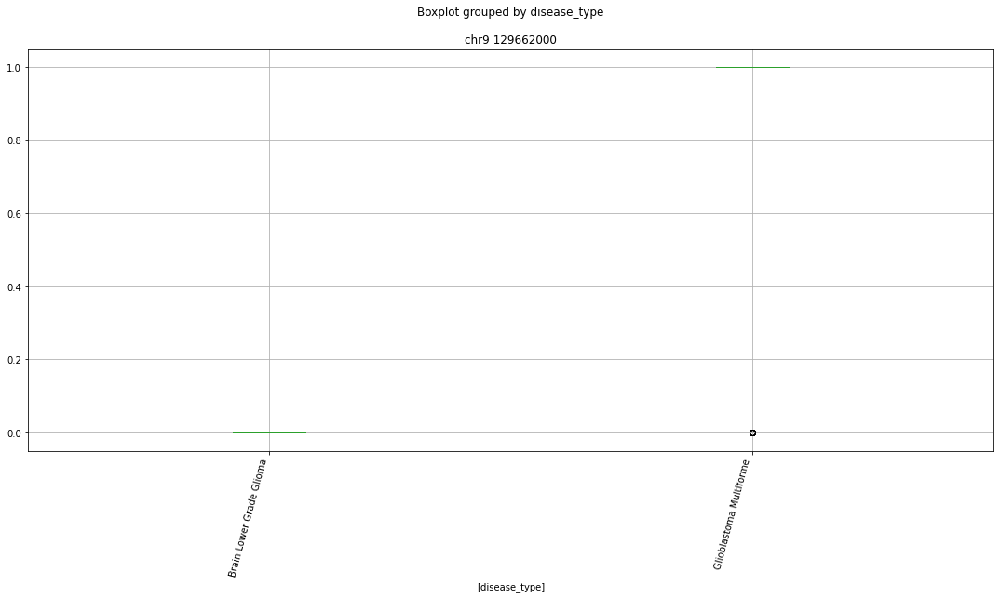

 p : 8.192163219079277e-15  ( t : 9.792784595659516 ) :  chr11 61167000


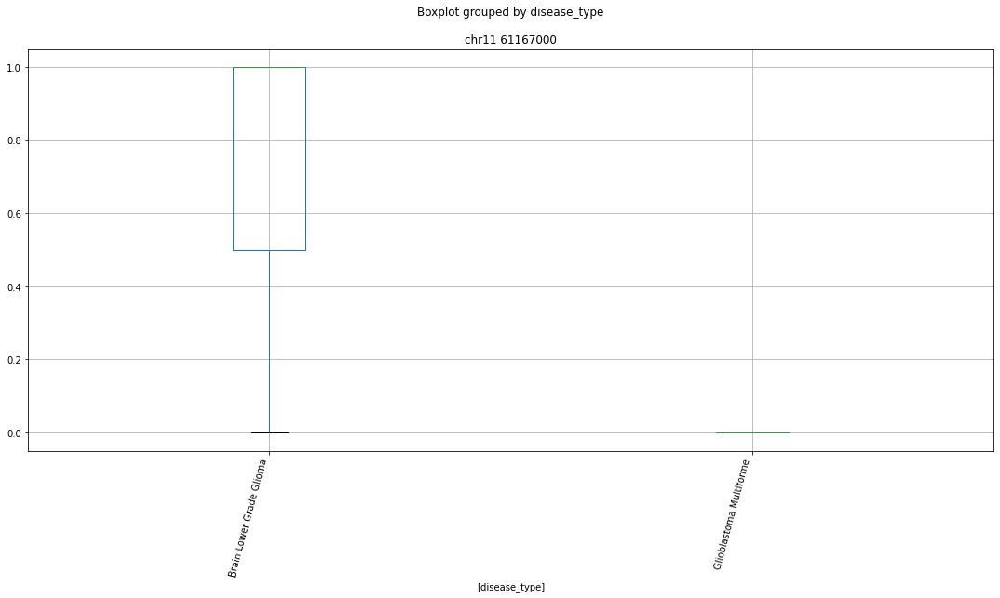

 p : 1.1897616583758173e-12  ( t : 8.619036164338976 ) :  chr14 102410000


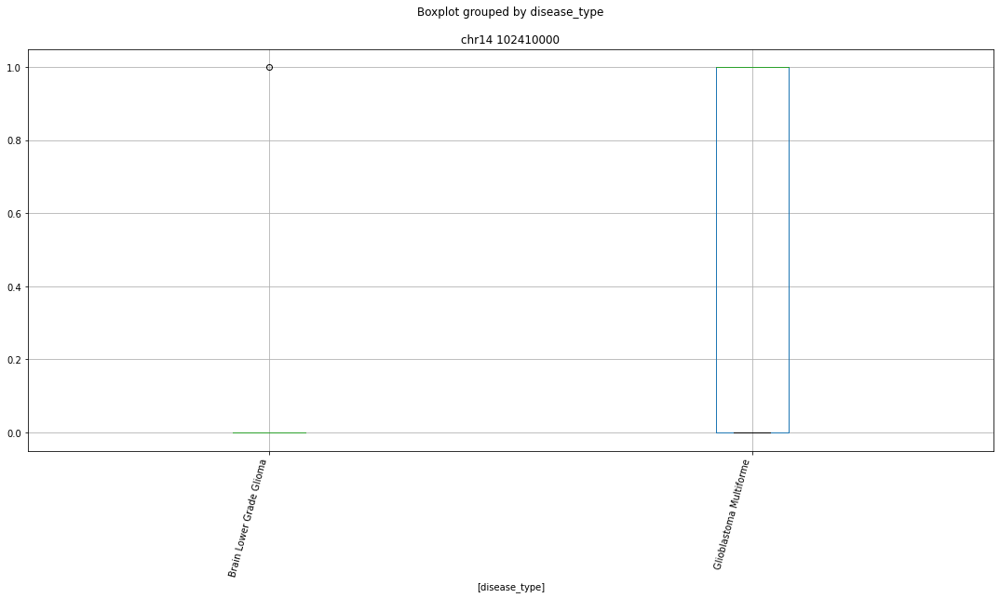

 p : 6.795720937170999e-12  ( t : 8.210862484069242 ) :  chr4 40787000


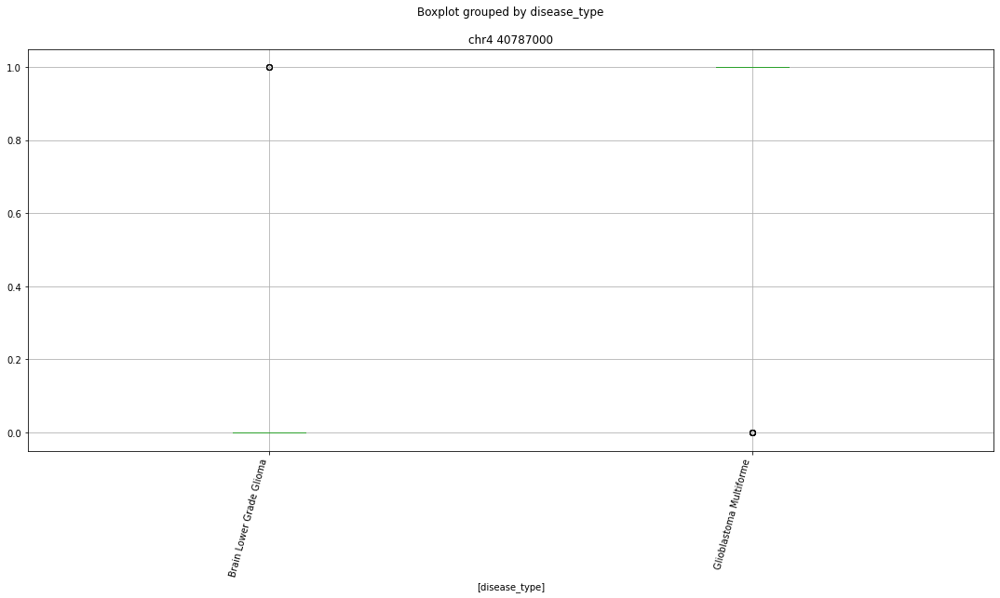

 p : 7.609277290064471e-11  ( t : 7.644822012889148 ) :  chr17 80159000


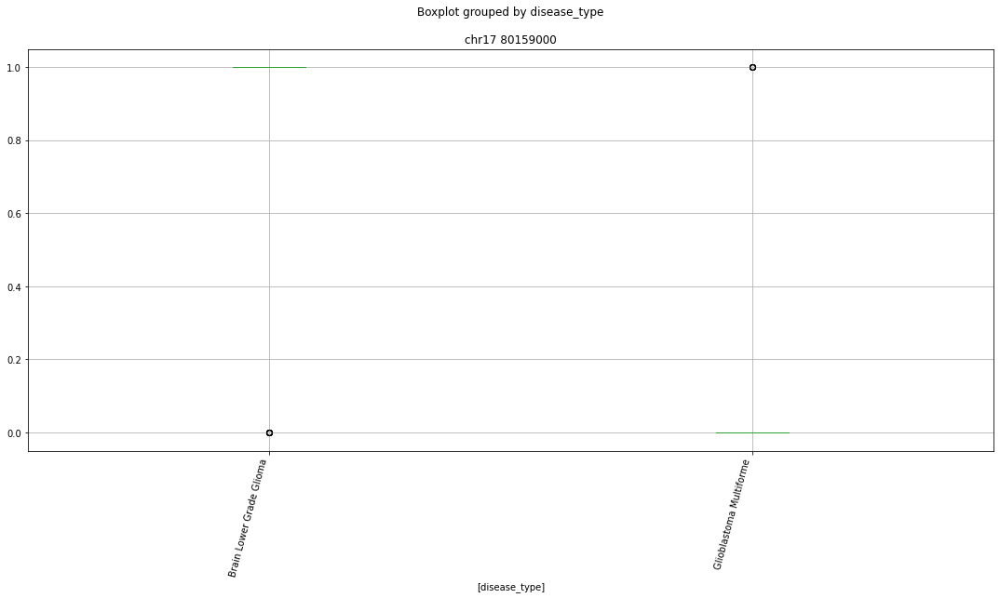

Clustermapping
['chr1 108159000' 'chr1 108518000' 'chr1 108676000' ... 'chrY 7180000'
 'disease_type' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


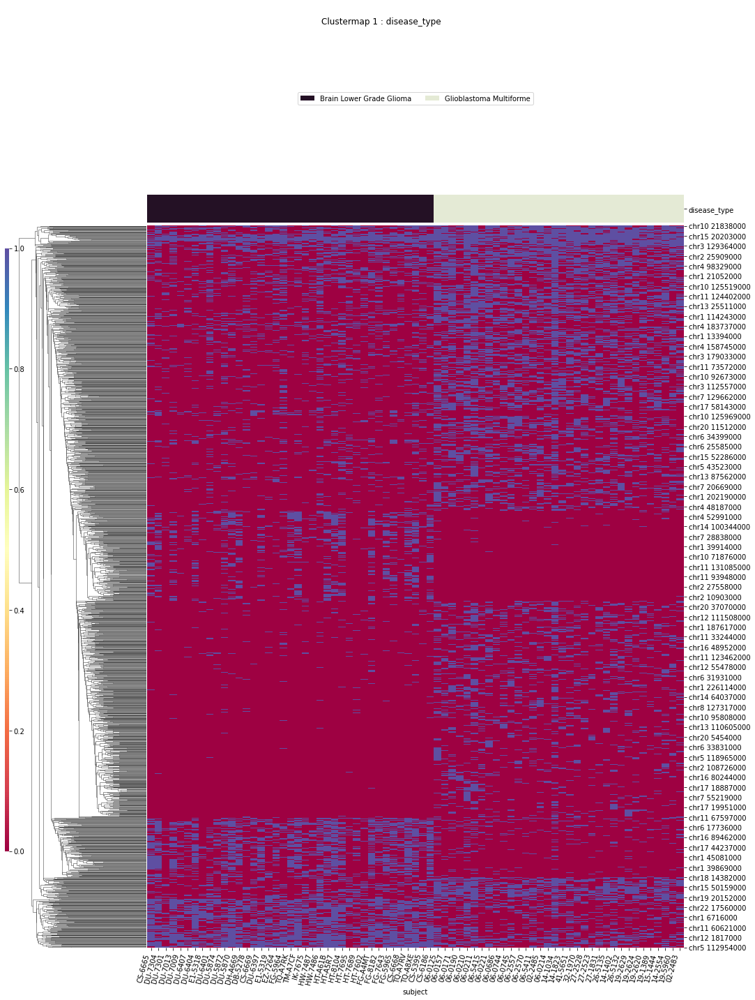

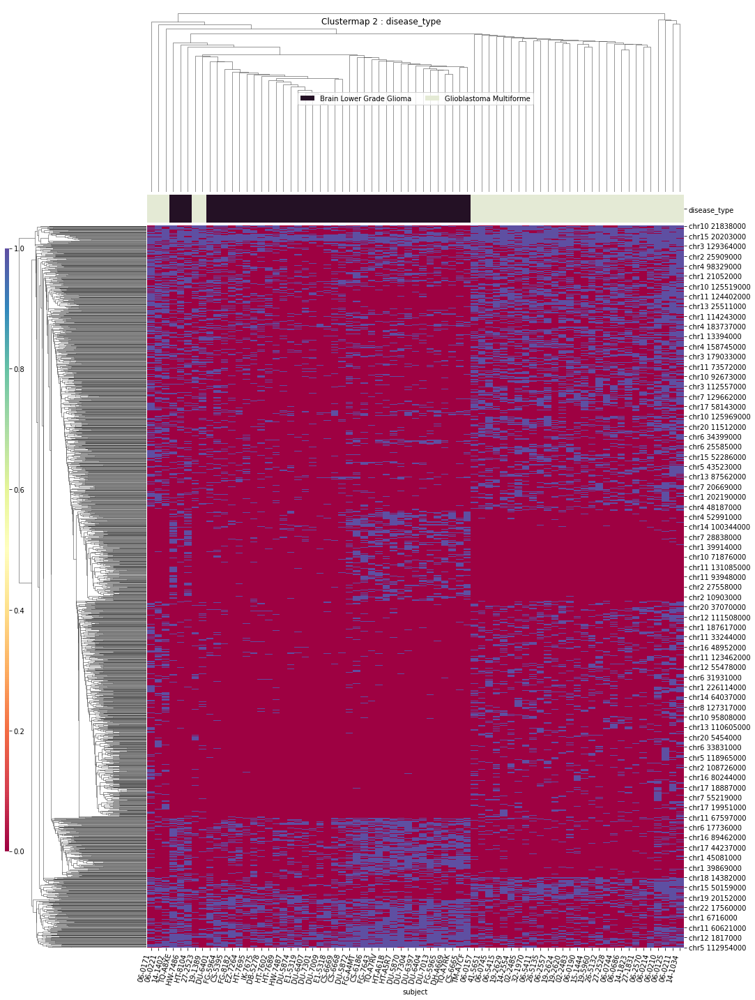

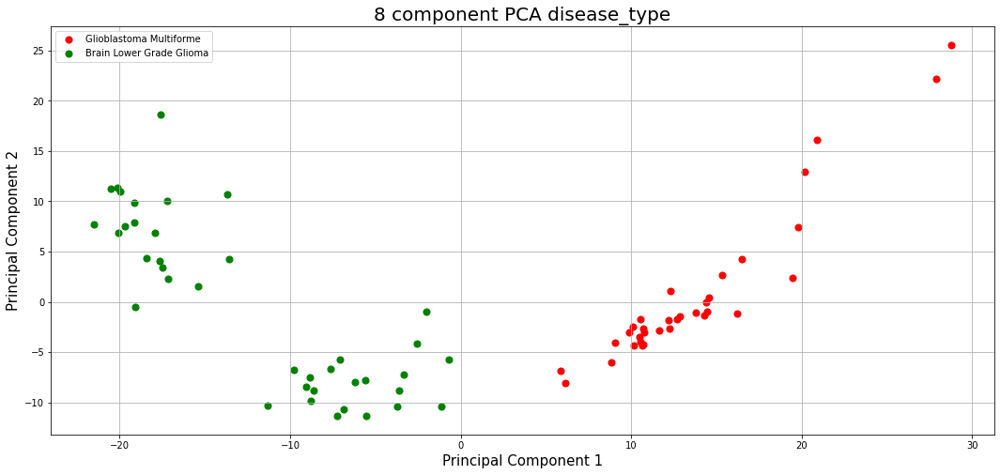

IDH_1p19q_status
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 108159000' 'chr1 108518000' ... 'chrX 80590000'
 'chrX 87466000' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


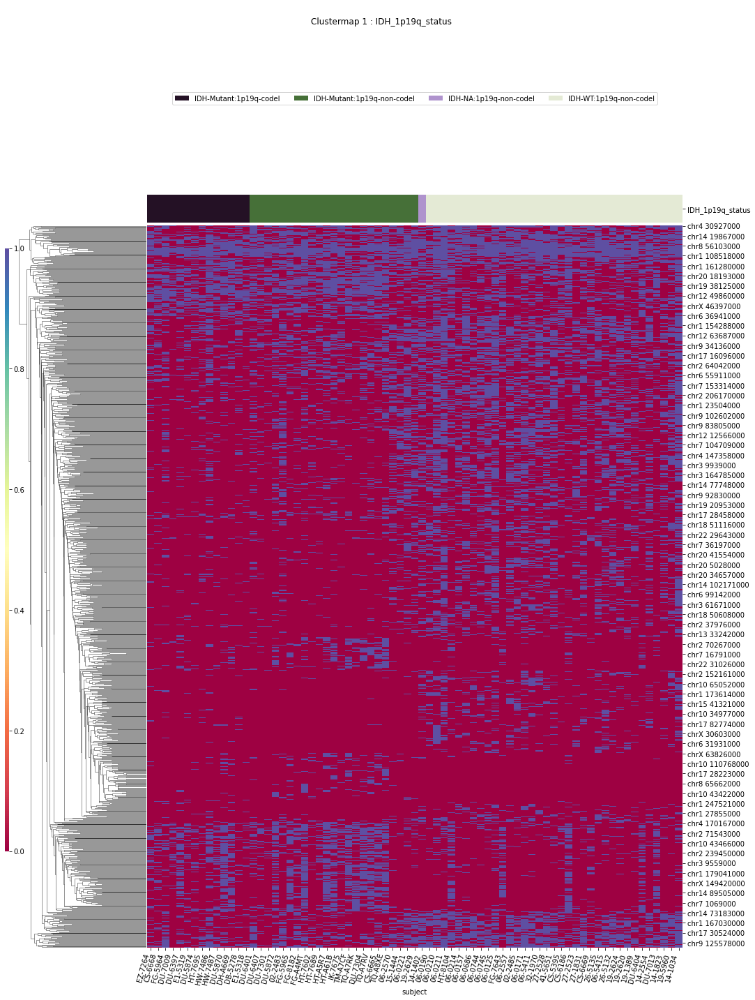

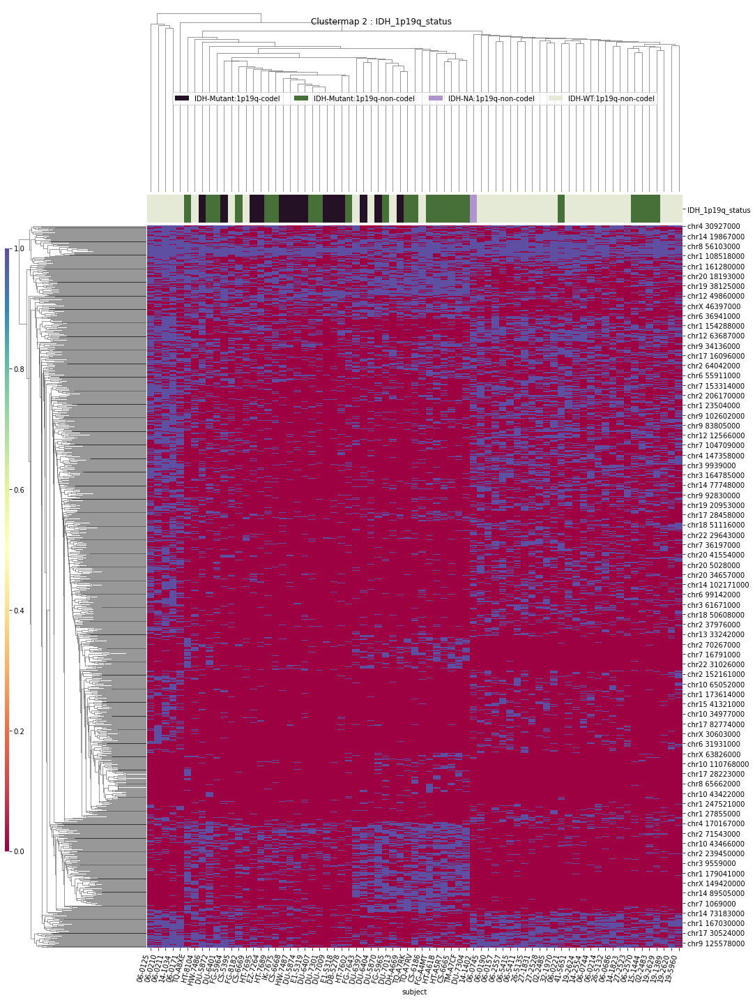

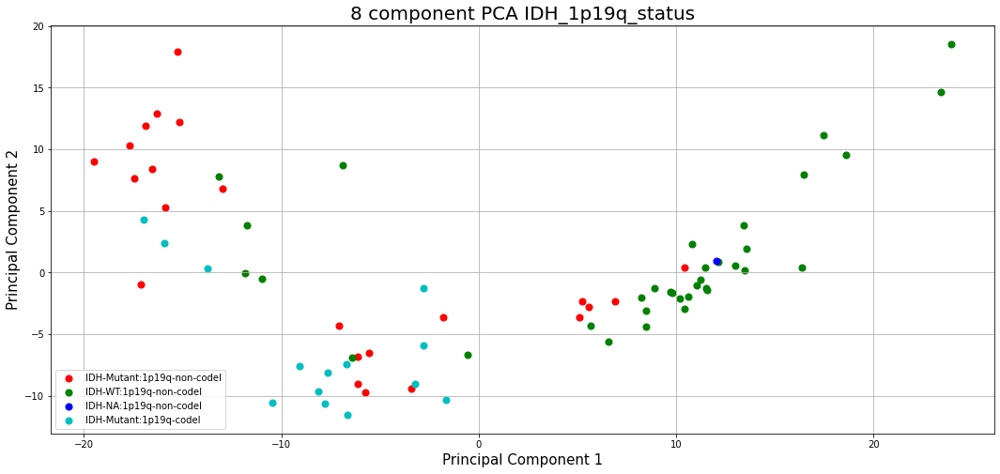

WHO_groups
T-Testing
Boxplotting
Clustermapping
['WHO_groups' 'chr1 10029000' 'chr1 10427000' ... 'chrY 12879000'
 'chrY 7180000' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


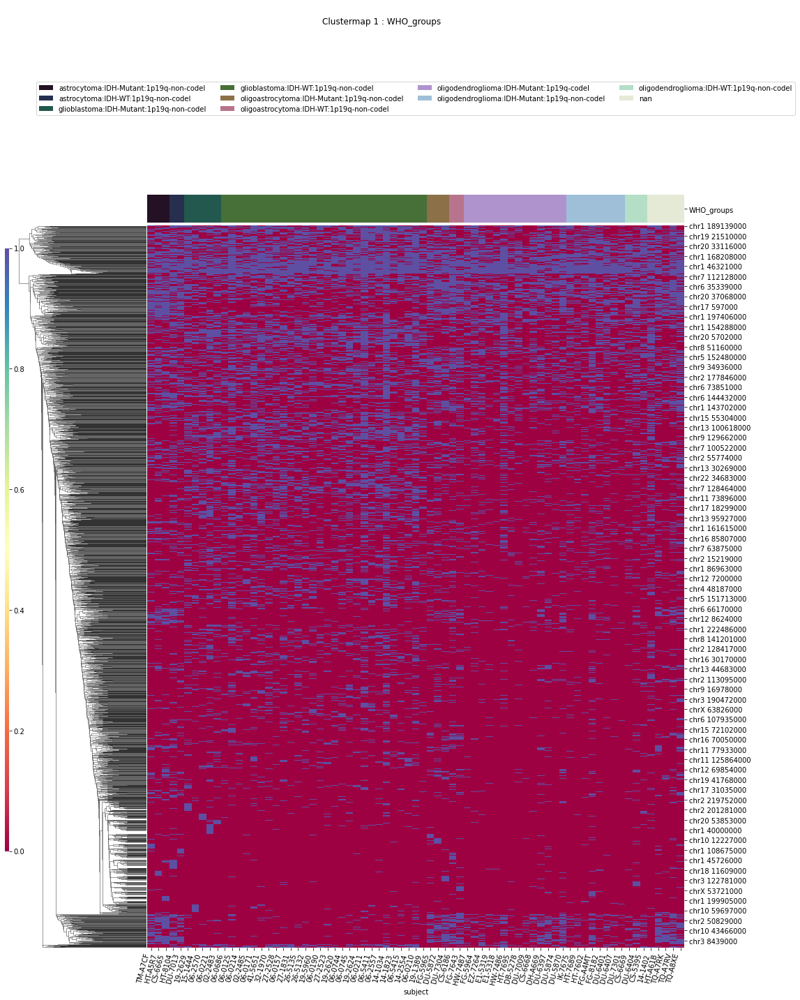

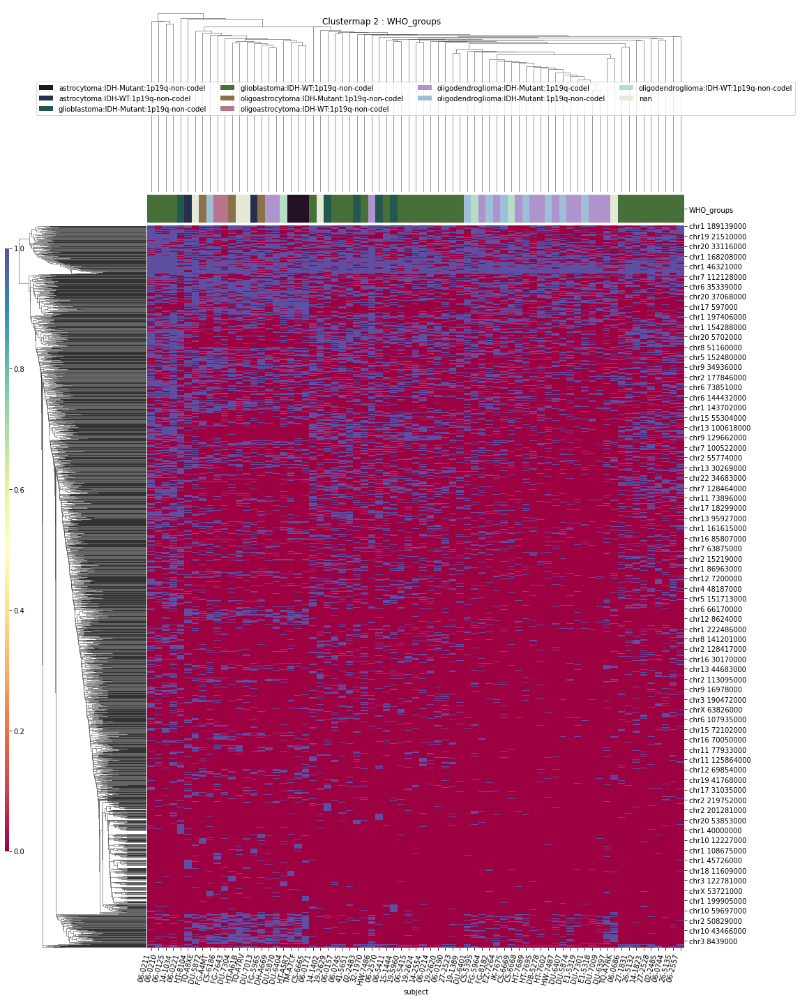

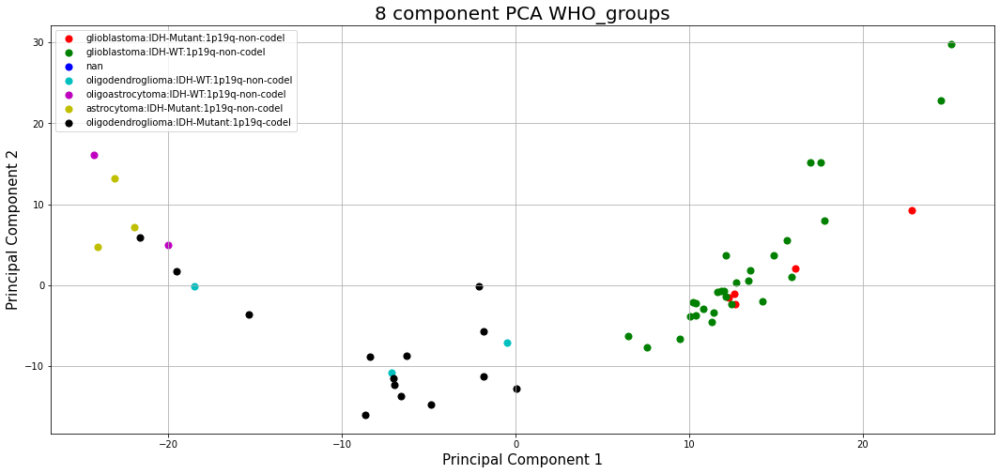

Triple_group
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['Triple_group' 'chr1 108159000' 'chr1 108518000' ... 'chrX 80590000'
 'chrX 87466000' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


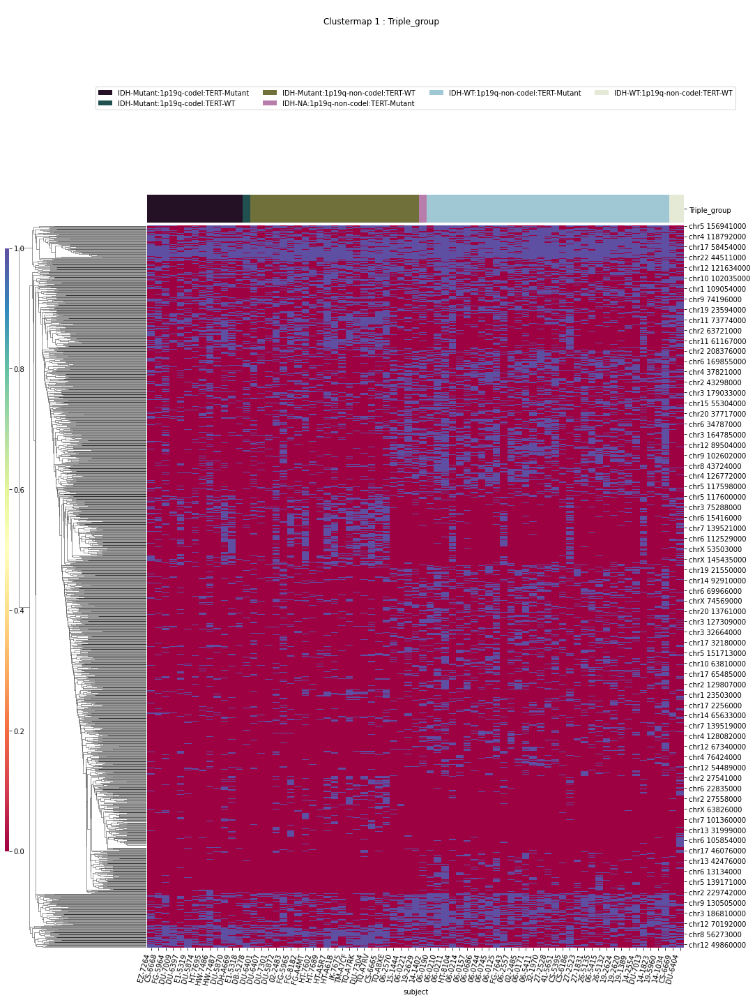

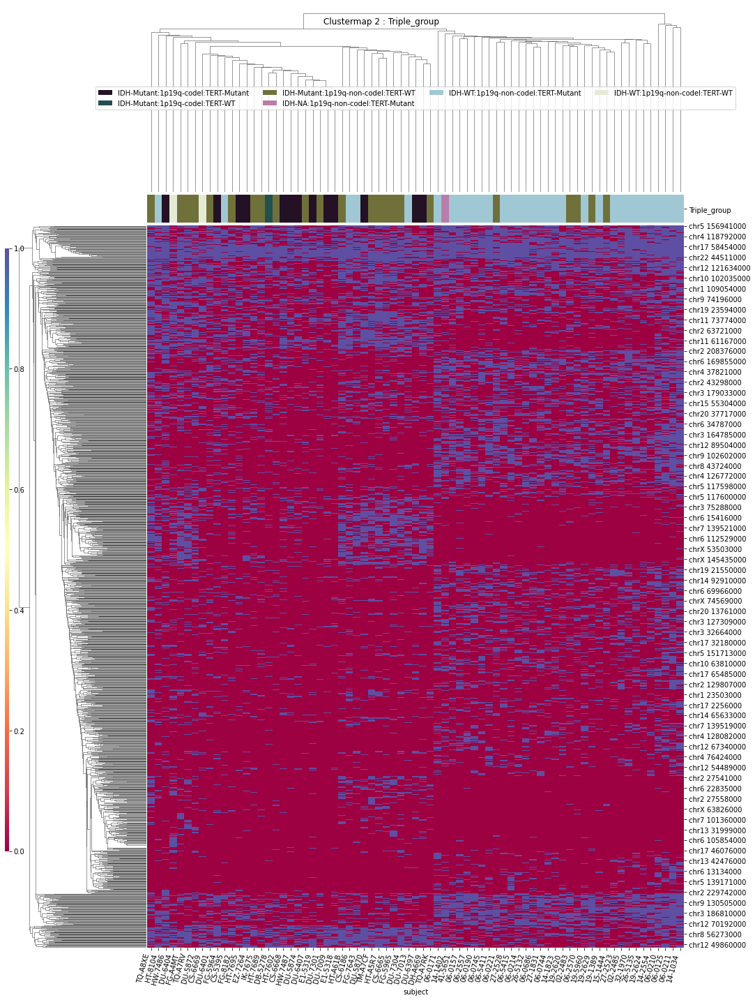

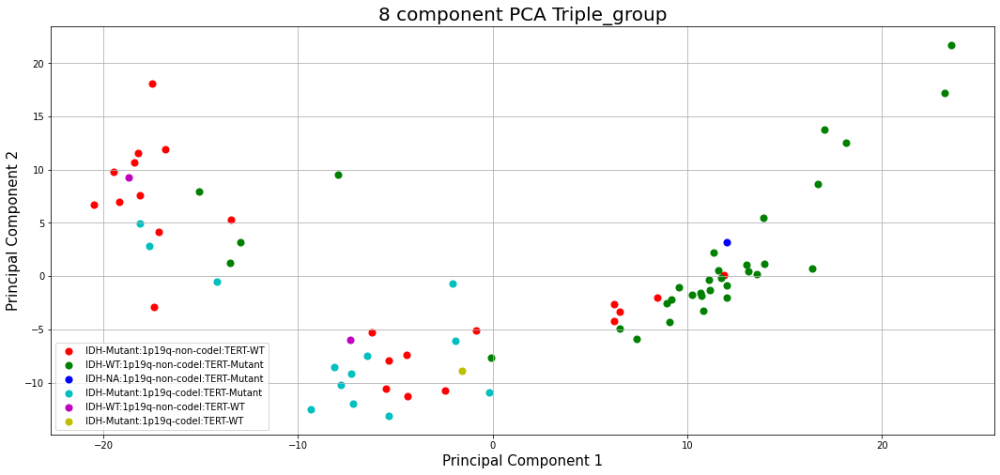

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr1 114058000' 'chr1 114480000' 'chr1 13659000' 'chr1 145763000'
 'chr1 145765000' 'chr1 147734000' 'chr1 152144000' 'chr1 161280000'
 'chr1 173614000' 'chr1 179039000' 'chr1 206065000' 'chr1 212319000'
 'chr1 212725000' 'chr1 23852000' 'chr1 246363000' 'chr1 247221000'
 'chr1 24801000' 'chr1 27855000' 'chr1 39914000' 'chr1 40572000'
 'chr1 43502000' 'chr1 45107000' 'chr1 45726000' 'chr1 48381000'
 'chr1 50382000' 'chr1 6716000' 'chr1 76111000' 'chr1 86963000'
 'chr1 8912000' 'chr1 96469000' 'chr1 99077000' 'chr1 99822000'
 'chr10 100094000' 'chr10 119261000' 'chr10 12518000' 'chr10 2805000'
 'chr10 31978000' 'chr10 42901000' 'chr10 43445000' 'chr10 45260000'
 'chr10 45330000' 'chr10 65052000' 'chr10 69992000' 'chr10 97840000'
 'chr11 118332000' 'chr11 118991000' 'chr11 19740000' 'chr11 49911000'
 'chr11 56144000' 'chr11 56498000' 'chr11 60072000' 'chr11 60623000'
 'chr11 60816000' 'chr11 61167000' 'chr11 65452000' 'chr11 65762000'
 '

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


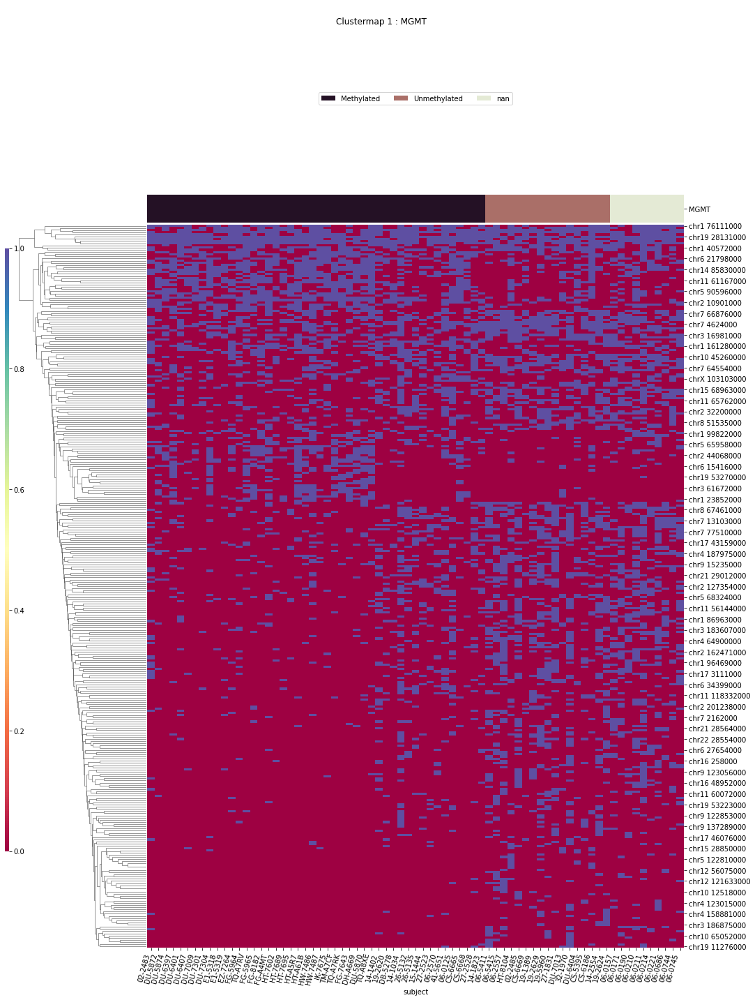

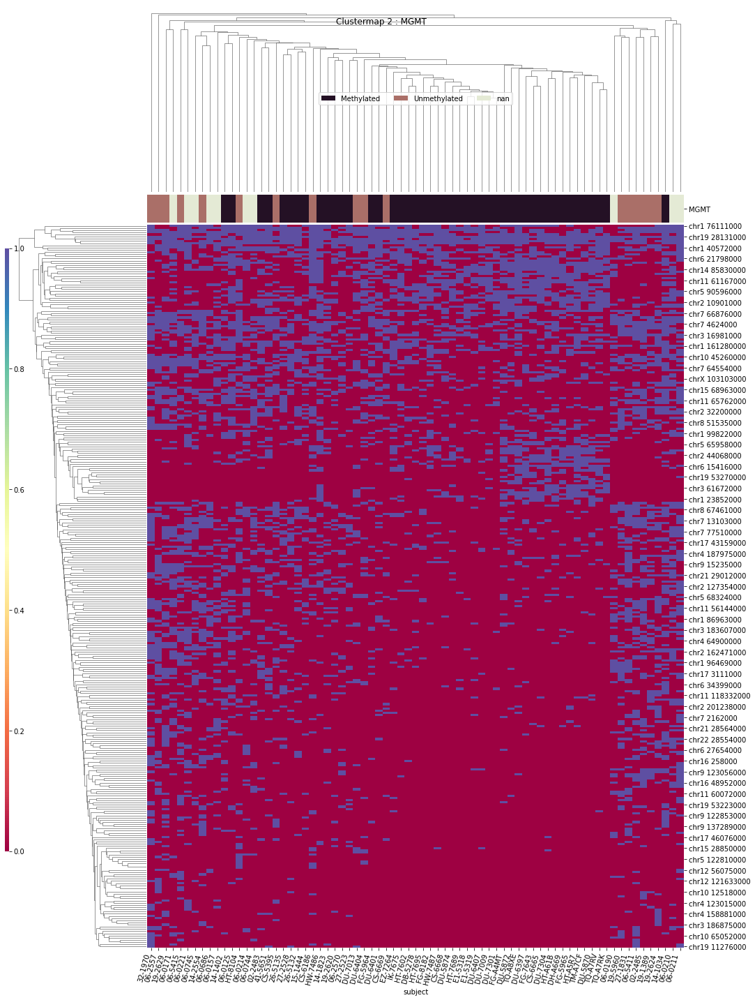

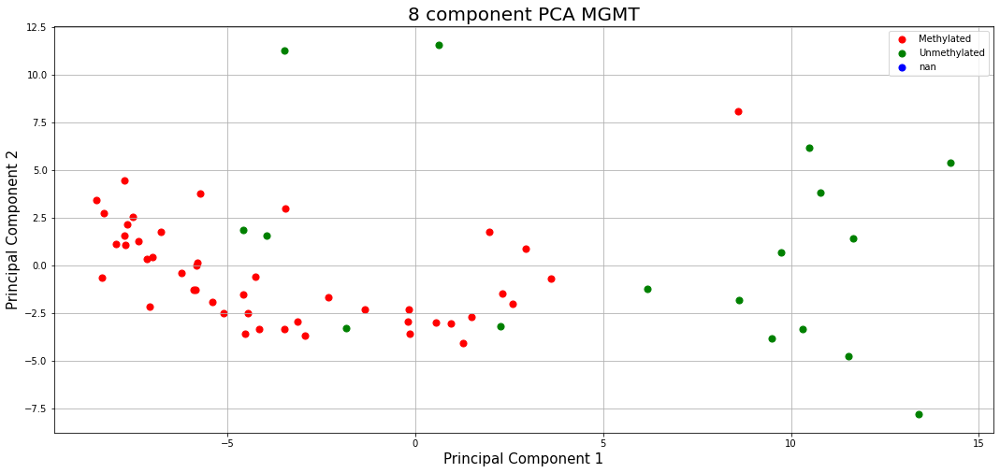

In [110]:
for column in ['primary_diagnosis','IDH','x1p19q','TERT','disease_type',
               'IDH_1p19q_status','WHO_groups','Triple_group','MGMT']:
    print(column)
    ttests_boxplots_and_heatmaps(compdf[compdf['hkle']==hkle],
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-10,heat_p=0.1)
    

In [111]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210601 20:02:37'

primary_diagnosis
T-Testing
Boxplotting
 p : 2.698715257411419e-16  ( t : 13.714955340794955 ) :  chr10 99891000


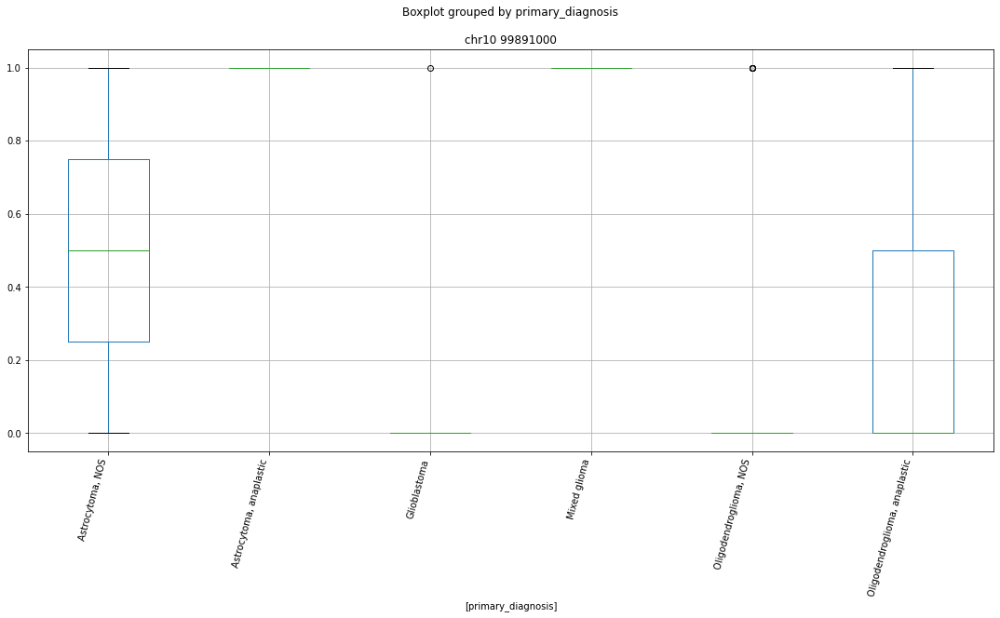

Clustermapping
['chr1 10427000' 'chr1 108490000' 'chr1 108675000' ... 'chrY 12879000'
 'primary_diagnosis' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


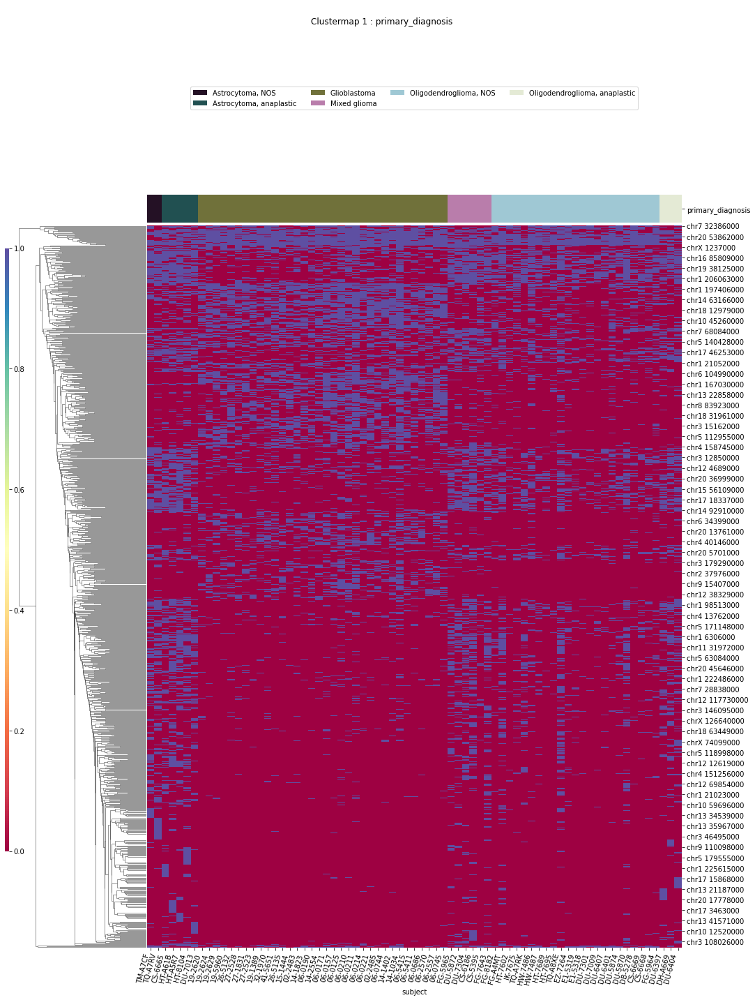

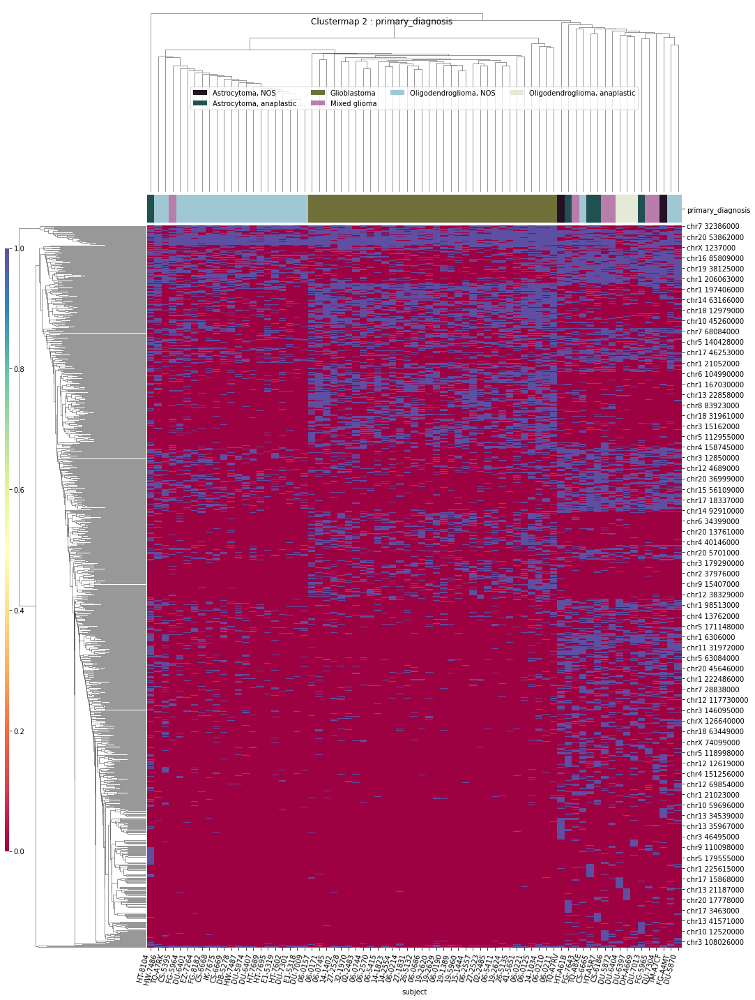

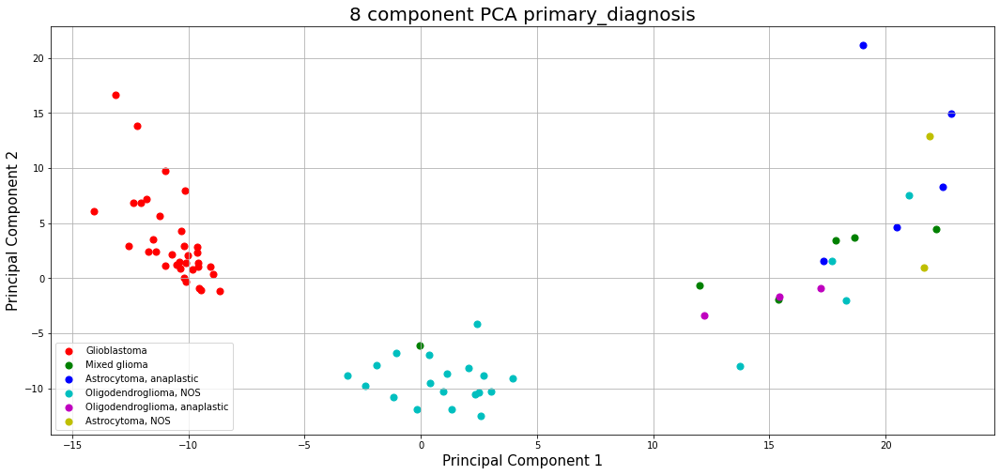

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 112641000' 'chr1 112729000' 'chr1 113062000' 'chr1 114791000'
 'chr1 114805000' 'chr1 145763000' 'chr1 145765000' 'chr1 150851000'
 'chr1 152144000' 'chr1 153575000' 'chr1 167030000' 'chr1 179039000'
 'chr1 202739000' 'chr1 226114000' 'chr1 226115000' 'chr1 23852000'
 'chr1 248677000' 'chr1 26802000' 'chr1 27065000' 'chr1 43502000'
 'chr1 44877000' 'chr1 50382000' 'chr1 54234000' 'chr1 6716000'
 'chr1 7600000' 'chr1 92025000' 'chr1 98513000' 'chr10 118264000'
 'chr10 118795000' 'chr10 120799000' 'chr10 133413000' 'chr10 42139000'
 'chr10 43445000' 'chr10 43466000' 'chr10 45260000' 'chr10 6992000'
 'chr10 92976000' 'chr10 95808000' 'chr10 97840000' 'chr11 18122000'
 'chr11 56144000' 'chr11 60200000' 'chr11 60452000' 'chr11 60623000'
 'chr11 60816000' 'chr11 61167000' 'chr11 65240000' 'chr11 65452000'
 'chr11 65762000' 'chr11 70294000' 'chr11 70296000' 'chr11 72501000'
 'chr11 73774000' 'chr11 73896000' 'chr11 77491000' 'chr11 8331700

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


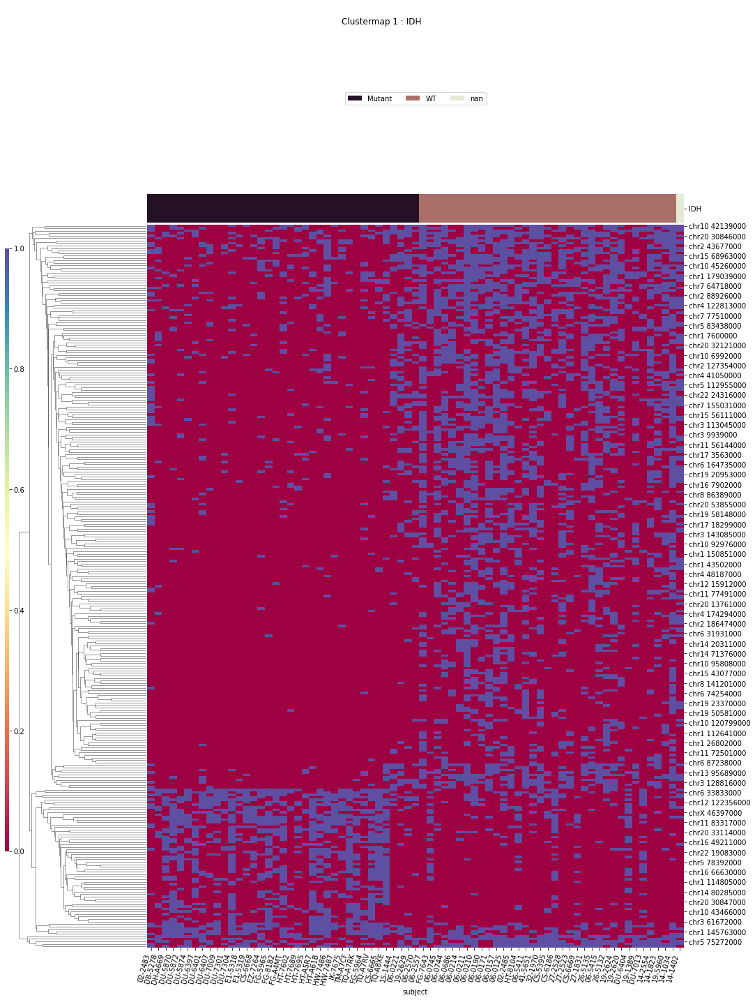

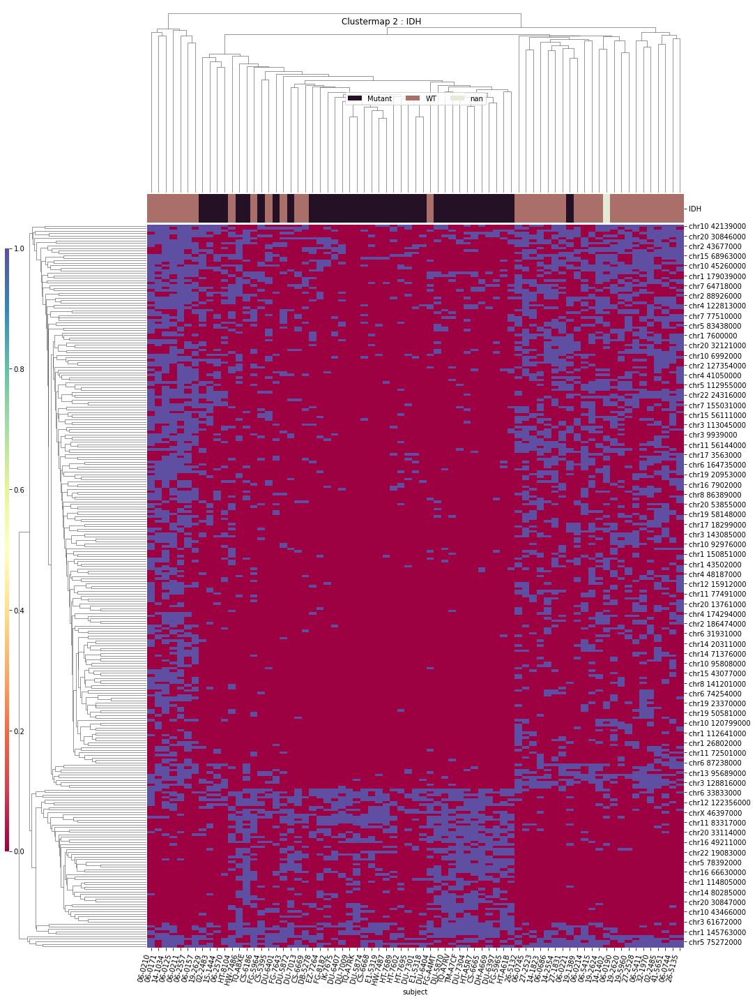

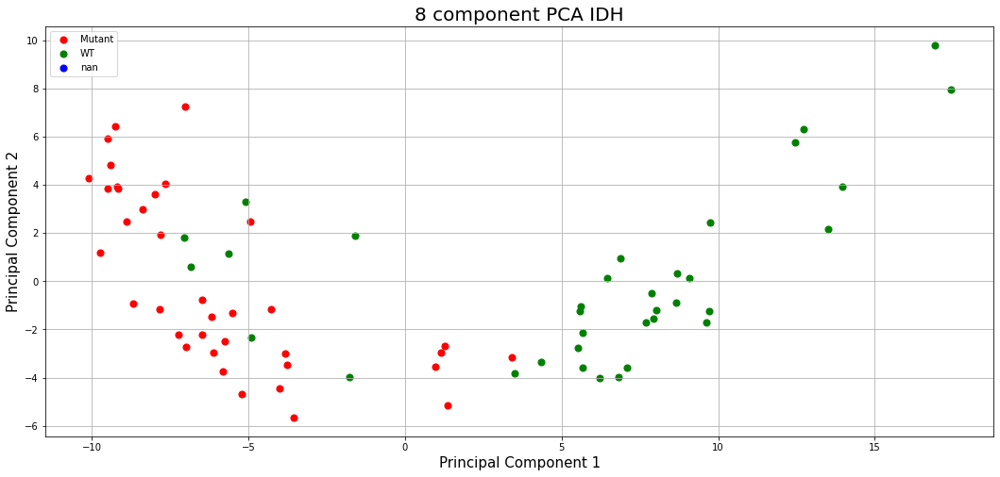

x1p19q
T-Testing
Boxplotting
Clustermapping
['chr1 108518000' 'chr1 153575000' 'chr1 189226000' 'chr1 219546000'
 'chr1 247521000' 'chr10 99892000' 'chr11 61167000' 'chr11 70296000'
 'chr12 63687000' 'chr12 7589000' 'chr14 102410000' 'chr14 31438000'
 'chr14 34476000' 'chr14 80285000' 'chr15 68963000' 'chr15 98492000'
 'chr16 49211000' 'chr16 68164000' 'chr17 80538000' 'chr18 14382000'
 'chr18 70569000' 'chr19 23534000' 'chr19 50390000' 'chr2 111963000'
 'chr2 15610000' 'chr2 206170000' 'chr2 215162000' 'chr2 41996000'
 'chr20 53853000' 'chr20 5701000' 'chr20 5702000' 'chr22 24316000'
 'chr3 128816000' 'chr3 44820000' 'chr3 47255000' 'chr3 47257000'
 'chr4 183040000' 'chr5 76813000' 'chr6 129087000' 'chr6 144432000'
 'chr6 159661000' 'chr6 57308000' 'chr7 112921000' 'chr9 129662000'
 'chrX 46397000' 'subject' 'x1p19q']


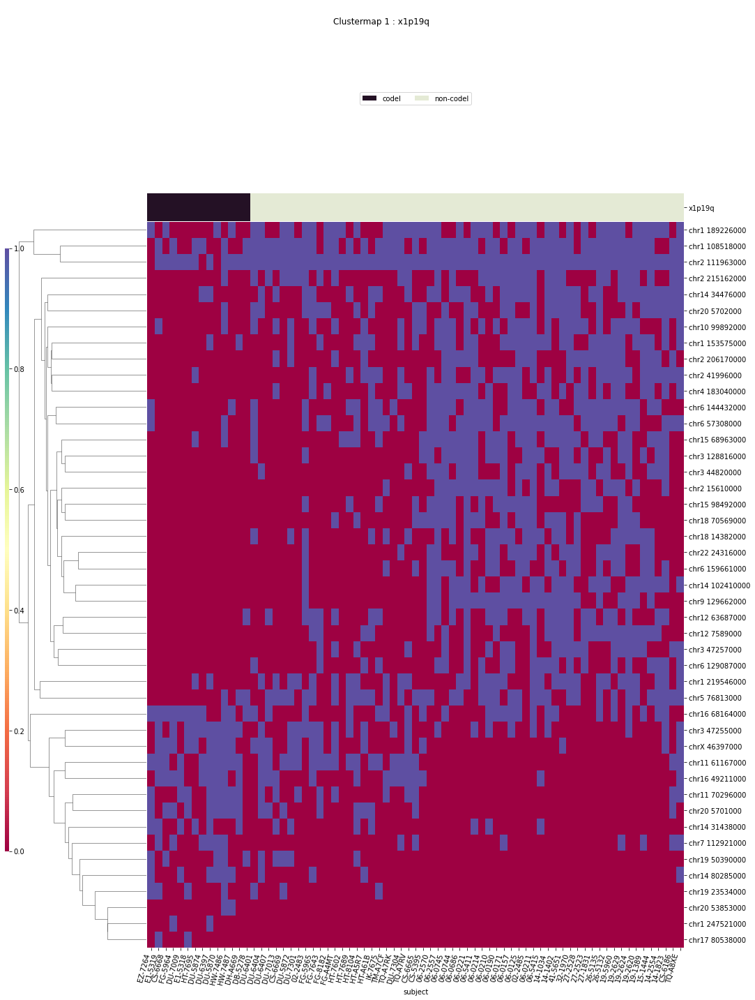

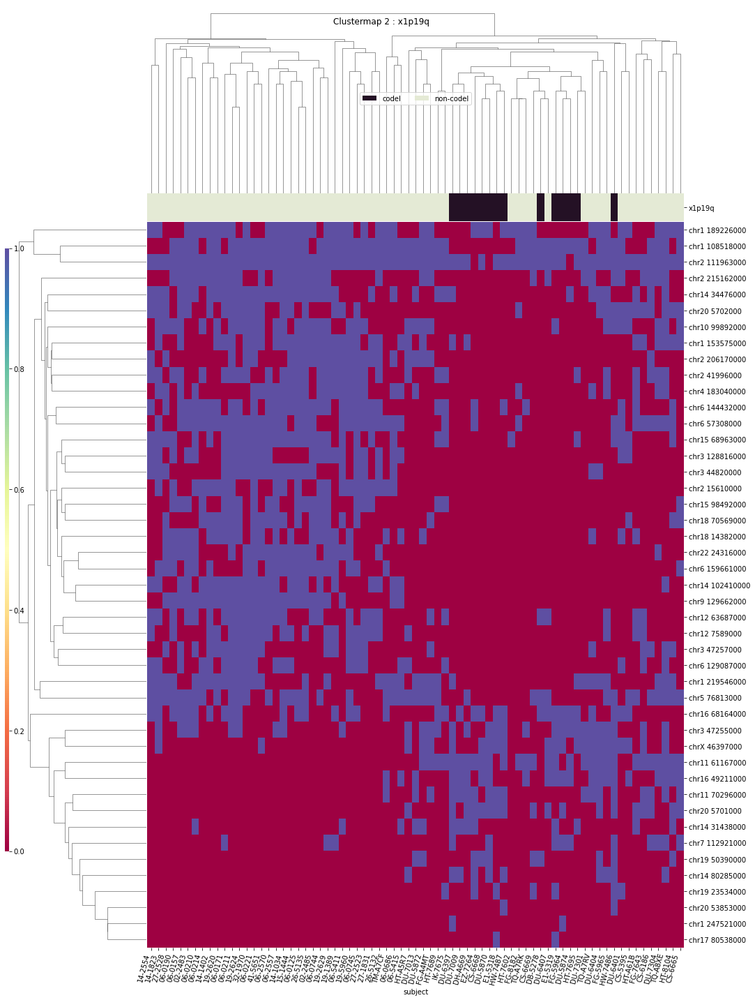

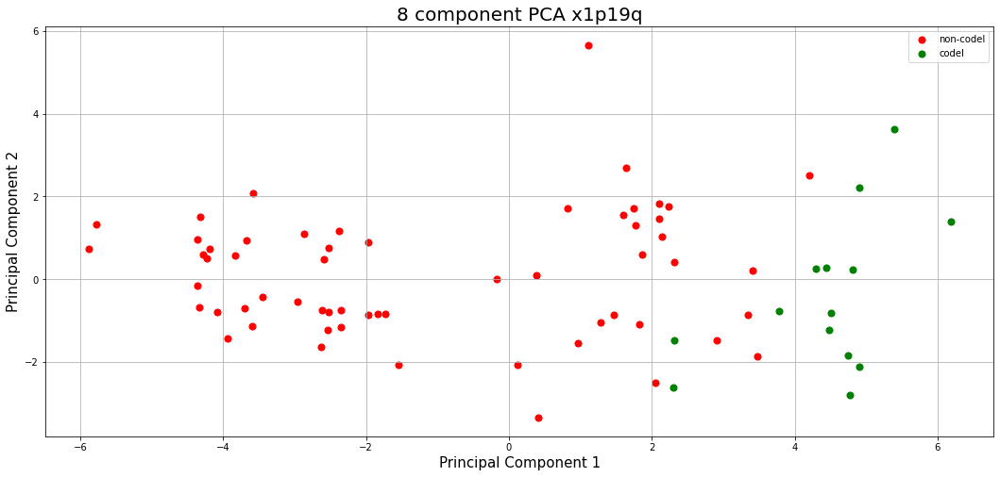

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 114791000' 'chr1 114805000' 'chr1 219544000'
 'chr1 226115000' 'chr1 23258000' 'chr1 23503000' 'chr1 6306000'
 'chr1 7600000' 'chr10 119261000' 'chr10 130628000' 'chr10 45260000'
 'chr10 62947000' 'chr10 78076000' 'chr10 92976000' 'chr11 131085000'
 'chr11 18122000' 'chr11 56144000' 'chr11 60621000' 'chr11 61167000'
 'chr11 65452000' 'chr11 65762000' 'chr12 111508000' 'chr12 130998000'
 'chr12 14354000' 'chr12 89503000' 'chr12 96158000' 'chr13 25513000'
 'chr13 45484000' 'chr15 45292000' 'chr15 60365000' 'chr16 4774000'
 'chr16 66630000' 'chr17 10058000' 'chr17 17441000' 'chr17 2256000'
 'chr17 27278000' 'chr17 597000' 'chr18 12979000' 'chr18 31961000'
 'chr18 77029000' 'chr19 18006000' 'chr19 21775000' 'chr2 134063000'
 'chr2 138872000' 'chr2 15610000' 'chr2 156367000' 'chr2 162471000'
 'chr2 171900000' 'chr2 239450000' 'chr2 32448000' 'chr2 3570000'
 'chr2 36179000' 'chr2 70267000' 'chr2 71543000' 'chr2 85095000'
 'chr2 88926000

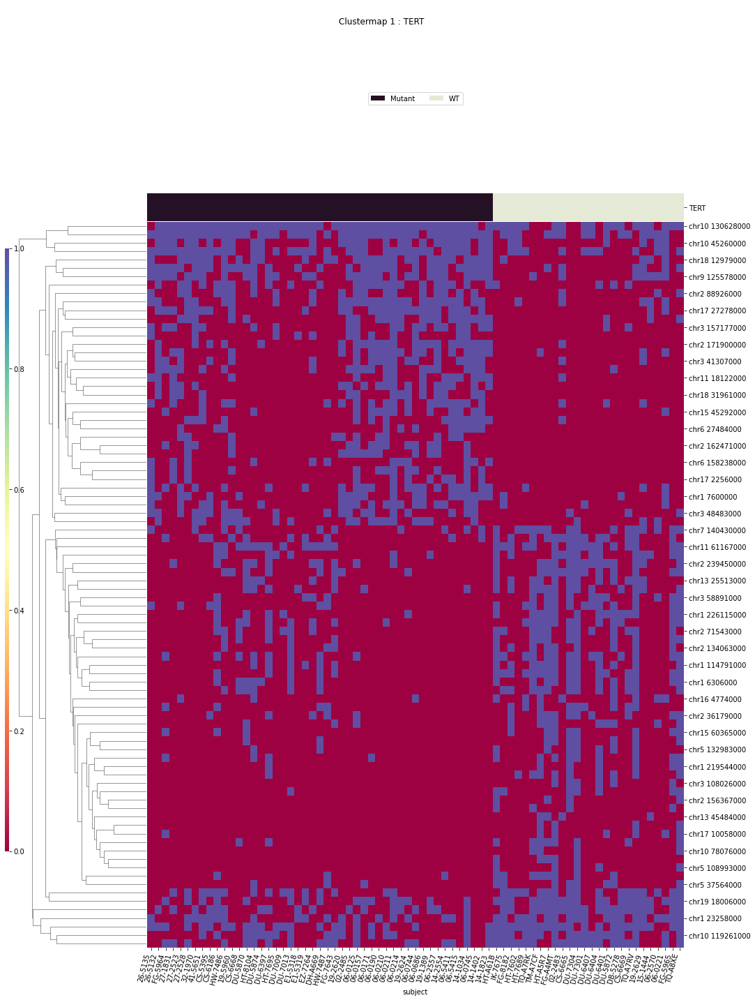

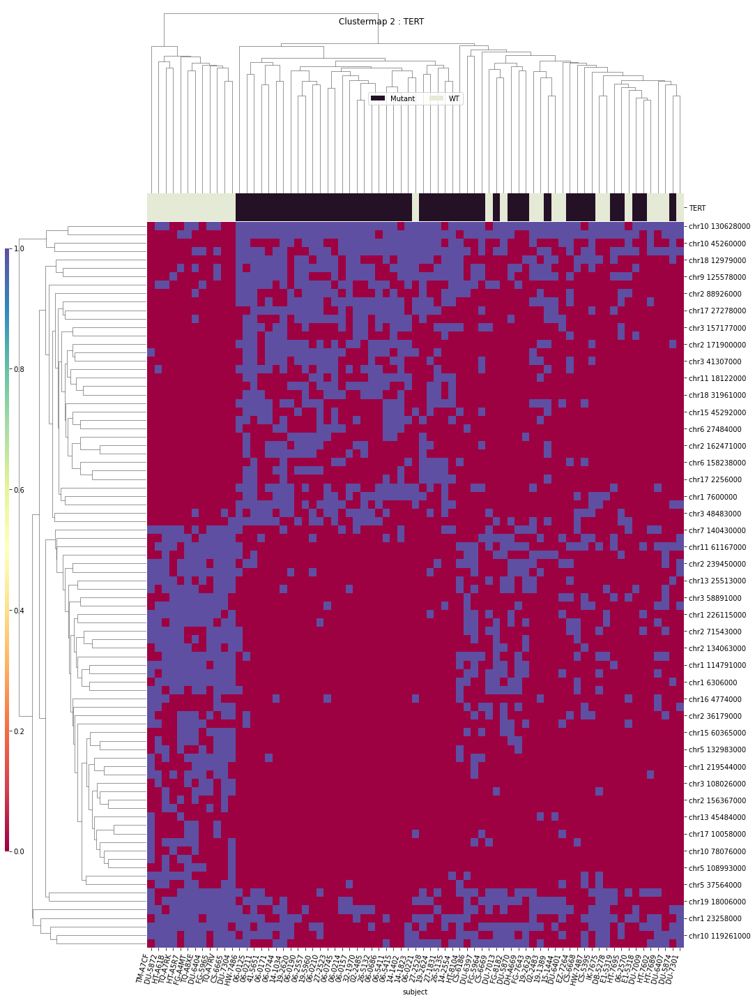

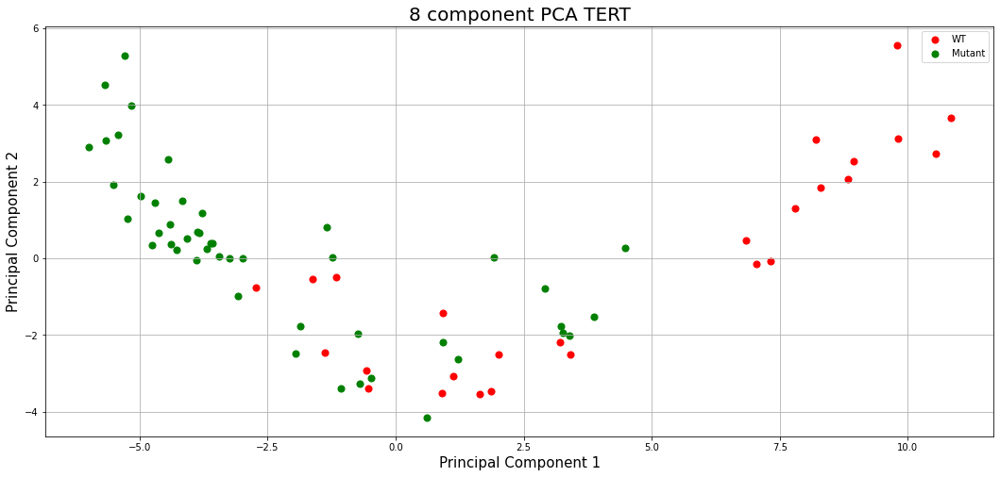

disease_type
T-Testing
Boxplotting
 p : 3.5552361378046195e-17  ( t : 11.103035497568849 ) :  chr9 129662000


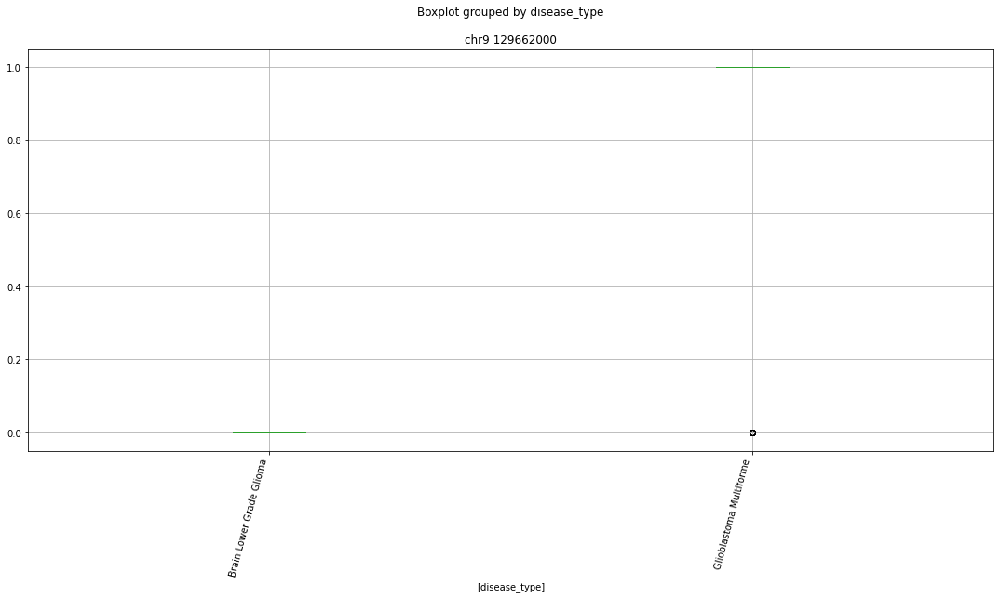

Clustermapping
['chr1 111529000' 'chr1 111800000' 'chr1 11249000' 'chr1 112641000'
 'chr1 112729000' 'chr1 113062000' 'chr1 114791000' 'chr1 114805000'
 'chr1 13659000' 'chr1 145763000' 'chr1 145765000' 'chr1 145768000'
 'chr1 147062000' 'chr1 150850000' 'chr1 152144000' 'chr1 152195000'
 'chr1 152472000' 'chr1 153575000' 'chr1 160936000' 'chr1 161617000'
 'chr1 167030000' 'chr1 173614000' 'chr1 176058000' 'chr1 179041000'
 'chr1 187617000' 'chr1 192858000' 'chr1 197405000' 'chr1 197406000'
 'chr1 202190000' 'chr1 202739000' 'chr1 206063000' 'chr1 209128000'
 'chr1 21054000' 'chr1 219544000' 'chr1 22159000' 'chr1 226115000'
 'chr1 227132000' 'chr1 229931000' 'chr1 234266000' 'chr1 23503000'
 'chr1 23504000' 'chr1 237670000' 'chr1 23852000' 'chr1 23854000'
 'chr1 246363000' 'chr1 24801000' 'chr1 248677000' 'chr1 25604000'
 'chr1 26802000' 'chr1 27063000' 'chr1 27065000' 'chr1 36243000'
 'chr1 38648000' 'chr1 39869000' 'chr1 39912000' 'chr1 39914000'
 'chr1 45081000' 'chr1 45082000' 'chr

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


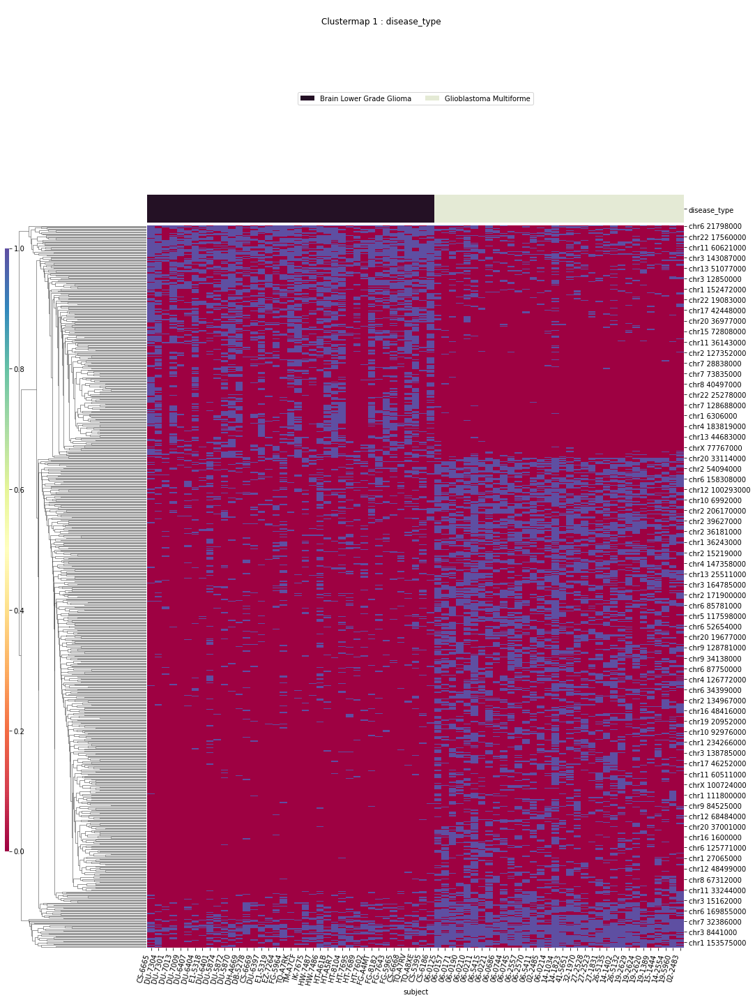

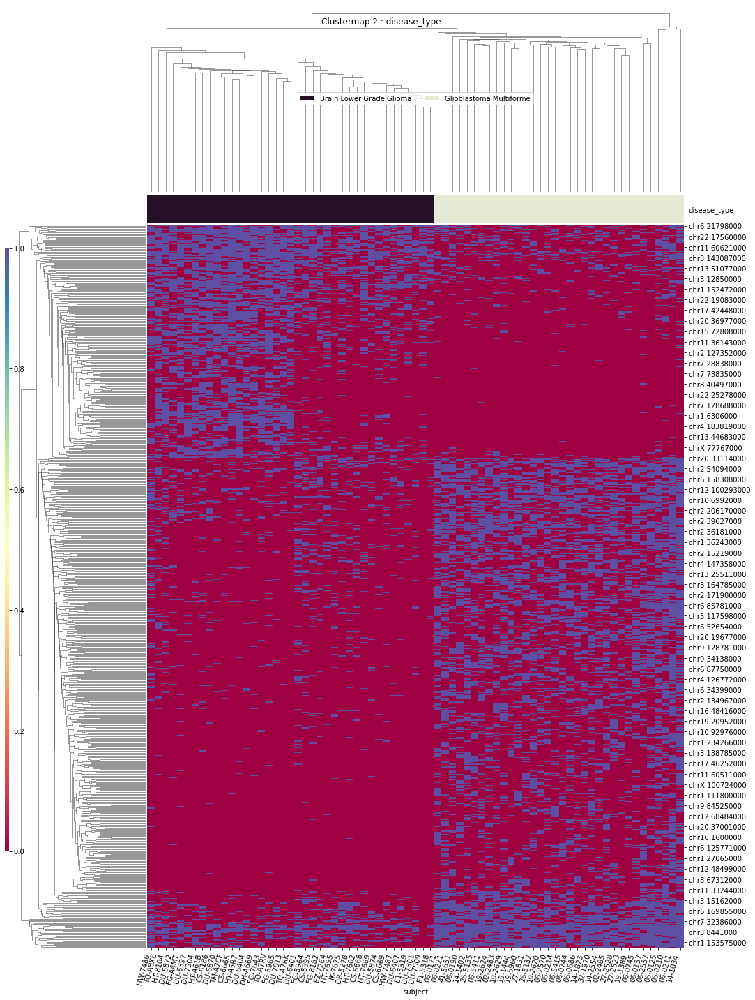

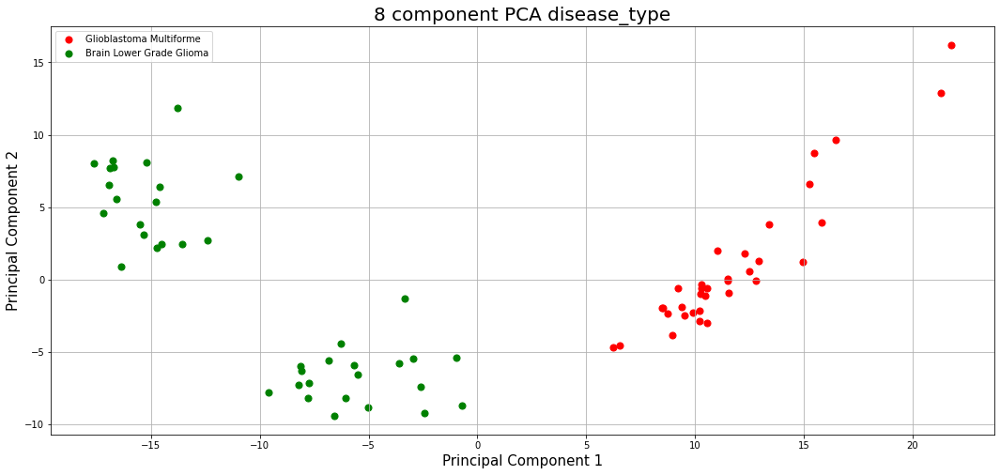

IDH_1p19q_status
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 108518000' 'chr1 114791000' 'chr1 114805000'
 'chr1 145765000' 'chr1 152144000' 'chr1 153575000' 'chr1 219546000'
 'chr1 226115000' 'chr1 23258000' 'chr1 23503000' 'chr1 23852000'
 'chr1 48191000' 'chr1 6716000' 'chr1 7600000' 'chr1 92025000'
 'chr1 98513000' 'chr10 43423000' 'chr10 43445000' 'chr10 43466000'
 'chr10 62947000' 'chr10 6992000' 'chr10 78076000' 'chr10 92976000'
 'chr10 97840000' 'chr10 99892000' 'chr11 18122000' 'chr11 56144000'
 'chr11 60452000' 'chr11 60623000' 'chr11 61167000' 'chr11 65452000'
 'chr11 65762000' 'chr11 70296000' 'chr11 73774000' 'chr11 73896000'
 'chr11 83317000' 'chr11 86733000' 'chr12 100293000' 'chr12 111508000'
 'chr12 121994000' 'chr12 122356000' 'chr12 122708000' 'chr12 14354000'
 'chr12 15912000' 'chr12 43686000' 'chr12 56790000' 'chr12 63687000'
 'chr12 69374000' 'chr12 70192000' 'chr12 7589000' 'chr12 89503000'
 'chr13 100618000' 'chr13 107782000' 'chr13 109310000' 'chr13 22858000'
 'chr13 2

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


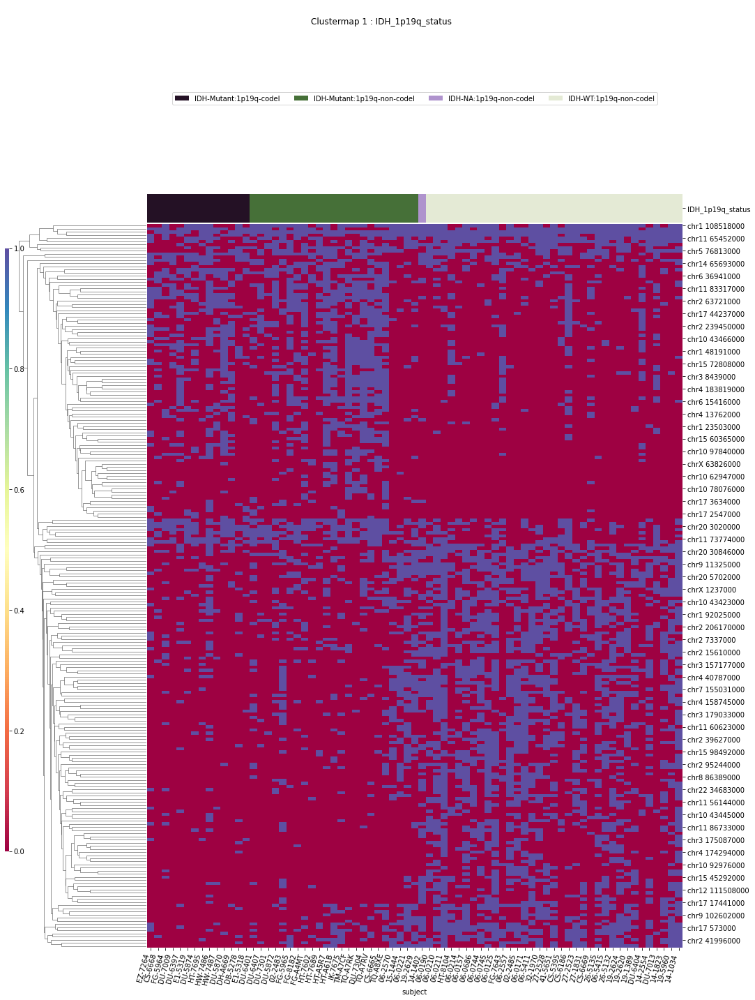

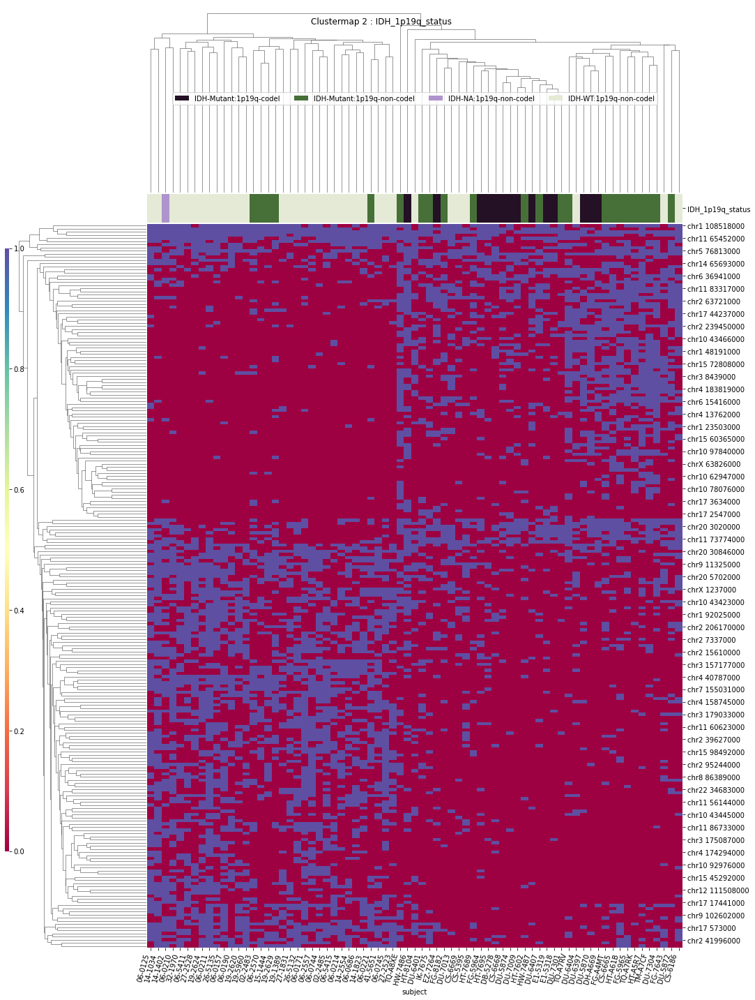

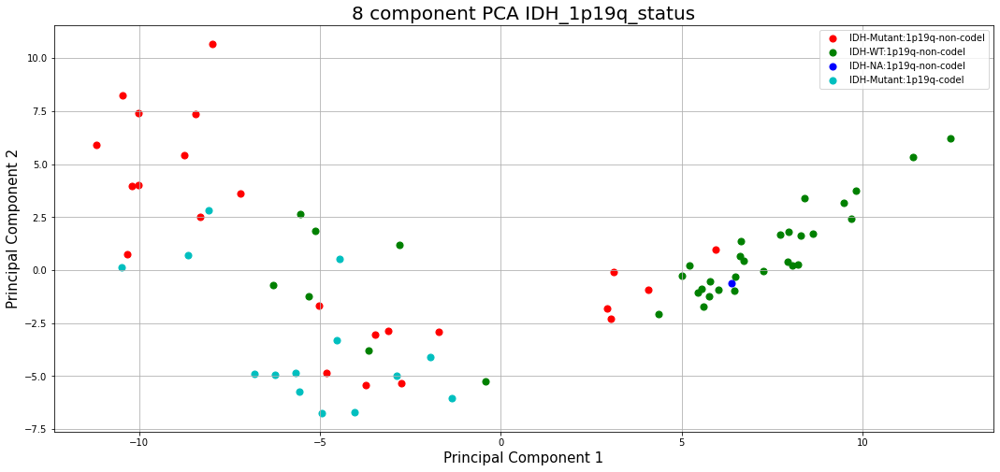

WHO_groups
T-Testing
Boxplotting
Clustermapping
['WHO_groups' 'chr1 106413000' 'chr1 108490000' ... 'chrX 97276000'
 'chrY 12879000' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


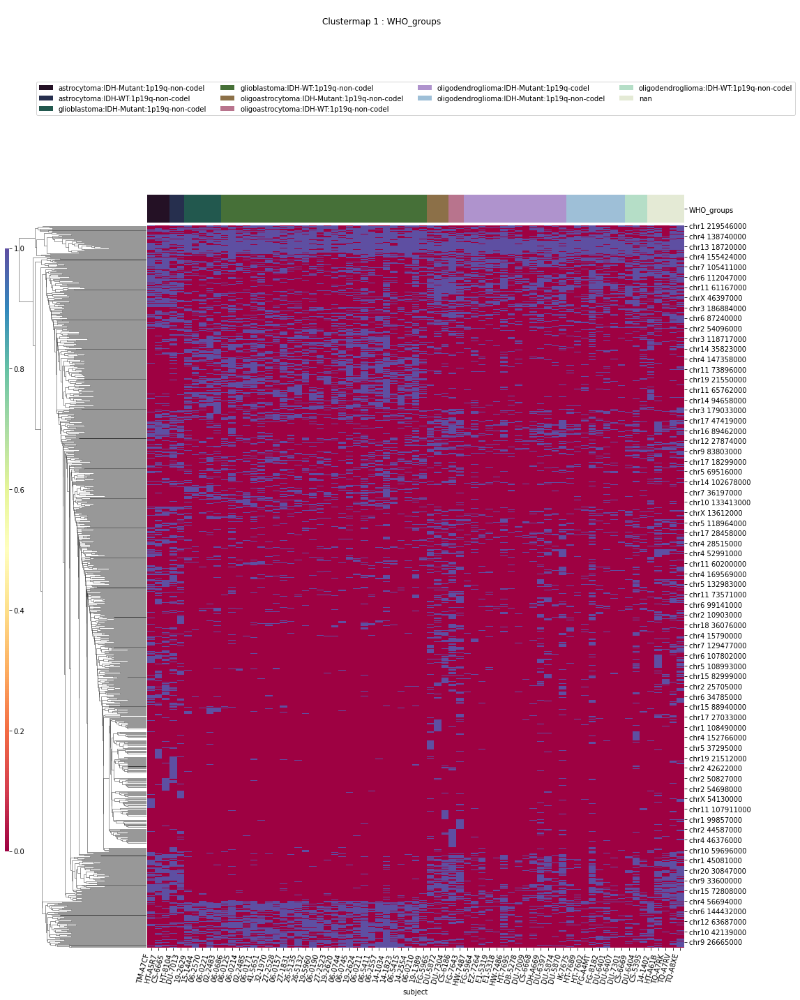

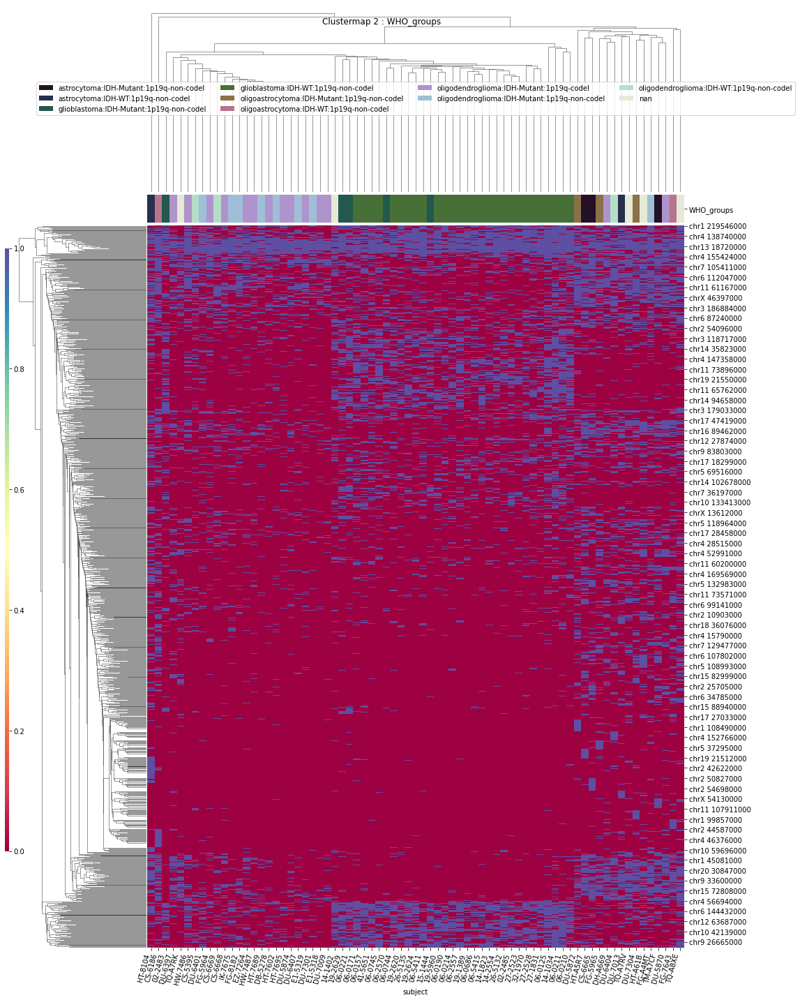

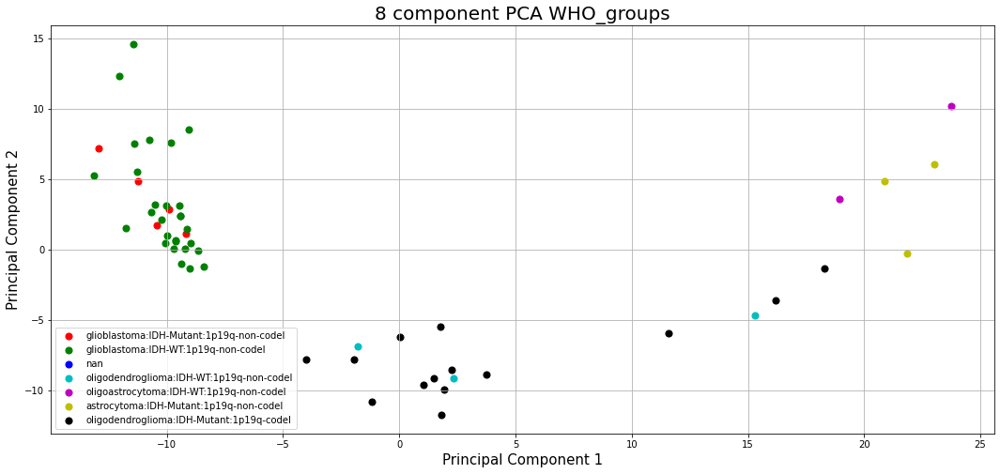

Triple_group
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['Triple_group' 'chr1 108518000' 'chr1 114791000' 'chr1 114805000'
 'chr1 143637000' 'chr1 145763000' 'chr1 145765000' 'chr1 152144000'
 'chr1 152472000' 'chr1 153575000' 'chr1 161615000' 'chr1 161617000'
 'chr1 162465000' 'chr1 167030000' 'chr1 176397000' 'chr1 179041000'
 'chr1 202739000' 'chr1 219544000' 'chr1 226115000' 'chr1 23258000'
 'chr1 23503000' 'chr1 23852000' 'chr1 246363000' 'chr1 24801000'
 'chr1 32805000' 'chr1 33510000' 'chr1 34081000' 'chr1 43501000'
 'chr1 44877000' 'chr1 48191000' 'chr1 50382000' 'chr1 6306000'
 'chr1 6716000' 'chr1 7600000' 'chr1 92025000' 'chr1 96470000'
 'chr1 98513000' 'chr10 122204000' 'chr10 130628000' 'chr10 42139000'
 'chr10 43423000' 'chr10 43445000' 'chr10 43466000' 'chr10 45260000'
 'chr10 62947000' 'chr10 6992000' 'chr10 69992000' 'chr10 69993000'
 'chr10 79370000' 'chr10 92976000' 'chr10 93970000' 'chr10 97840000'
 'chr10 99892000' 'chr11 131085000' 'chr11 17051000' 'chr11 18122000'
 'chr11 19861000' 'chr11 45

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


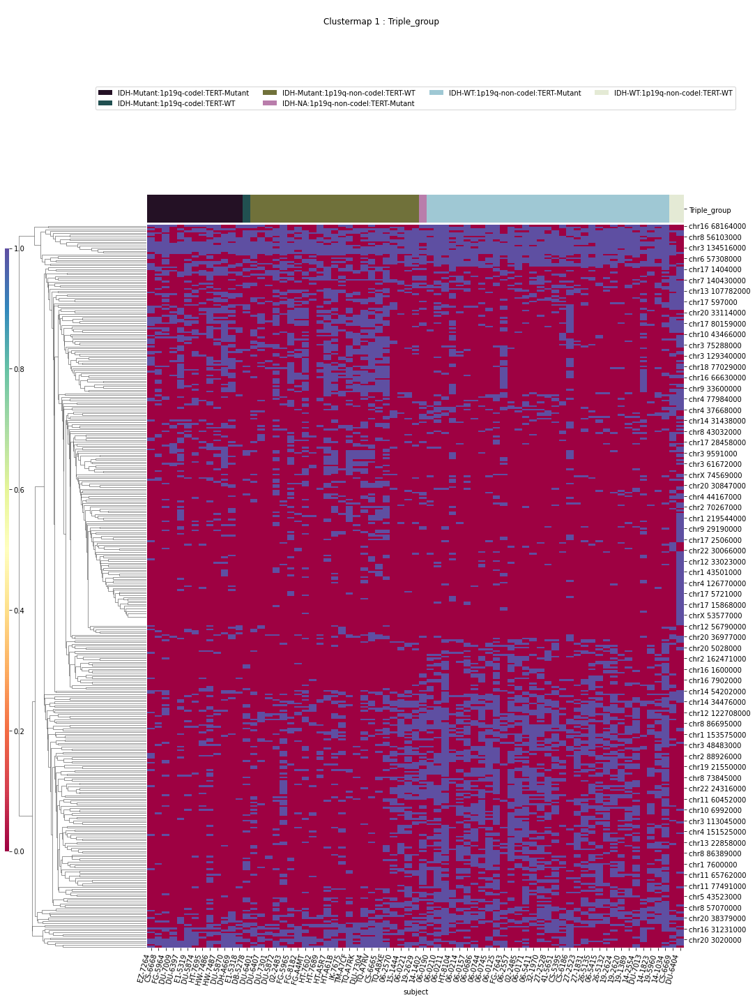

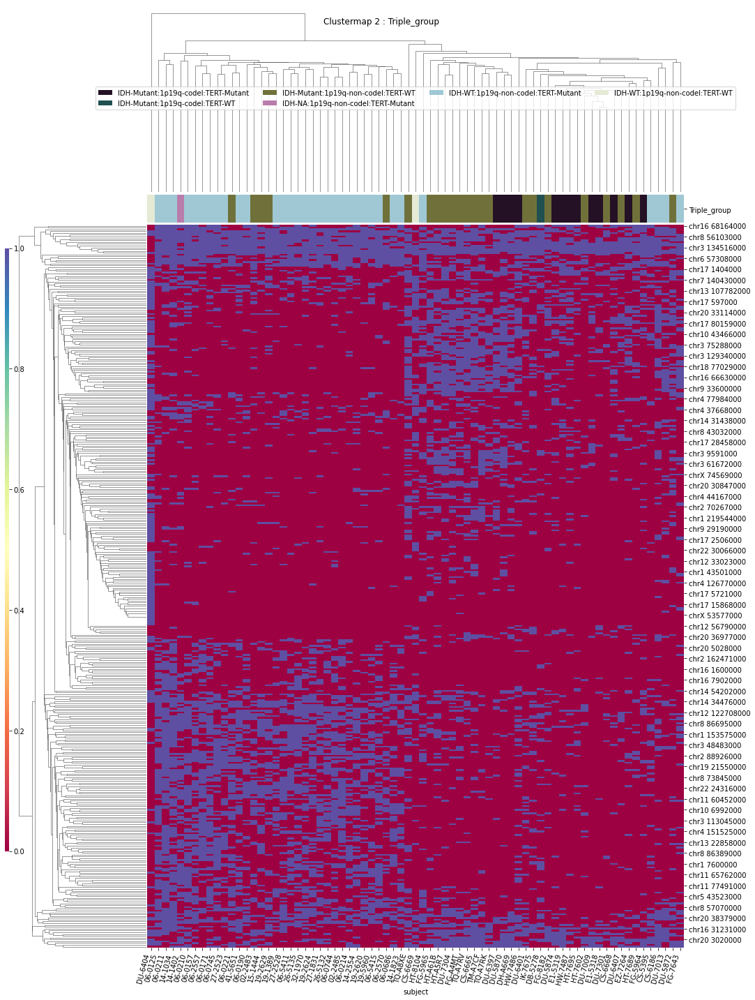

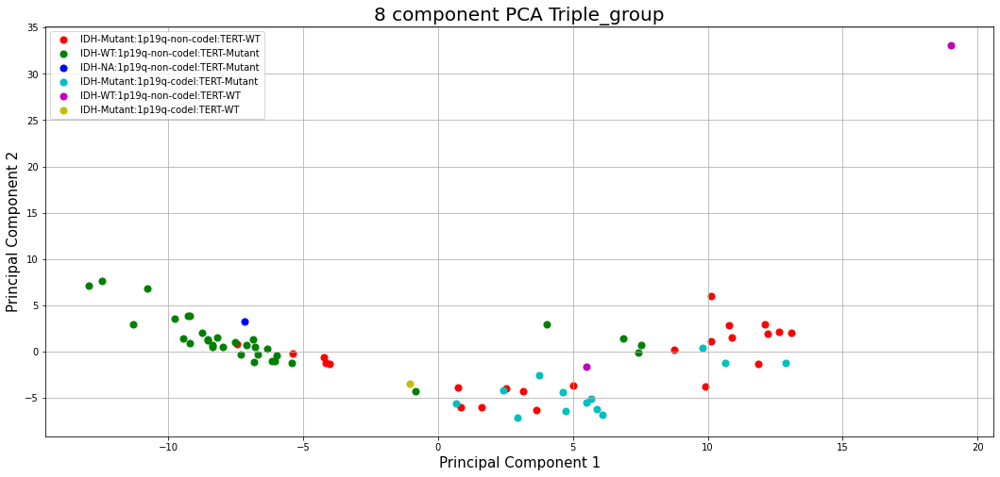

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr1 152144000' 'chr1 173614000' 'chr10 45260000'
 'chr10 45330000' 'chr10 65052000' 'chr11 118332000' 'chr11 19740000'
 'chr11 56144000' 'chr11 6690000' 'chr11 68474000' 'chr12 119359000'
 'chr12 12566000' 'chr12 80308000' 'chr13 87562000' 'chr14 75924000'
 'chr16 30170000' 'chr17 16096000' 'chr17 16146000' 'chr17 18299000'
 'chr17 27278000' 'chr17 46076000' 'chr18 50608000' 'chr19 50581000'
 'chr2 162471000' 'chr2 206170000' 'chr2 37976000' 'chr2 98988000'
 'chr20 32121000' 'chr20 33114000' 'chr21 29012000' 'chr21 42779000'
 'chr22 28554000' 'chr3 128816000' 'chr3 186875000' 'chr4 48187000'
 'chr4 64900000' 'chr5 112955000' 'chr5 176306000' 'chr5 45891000'
 'chr5 68324000' 'chr6 125771000' 'chr6 154688000' 'chr6 158308000'
 'chr6 164735000' 'chr6 27652000' 'chr6 74254000' 'chr6 87009000'
 'chr7 130592000' 'chr7 13103000' 'chr7 149555000' 'chr7 158658000'
 'chr8 127317000' 'chr8 63179000' 'chr8 9364000' 'chr9 92226000'
 'chr9 96715000

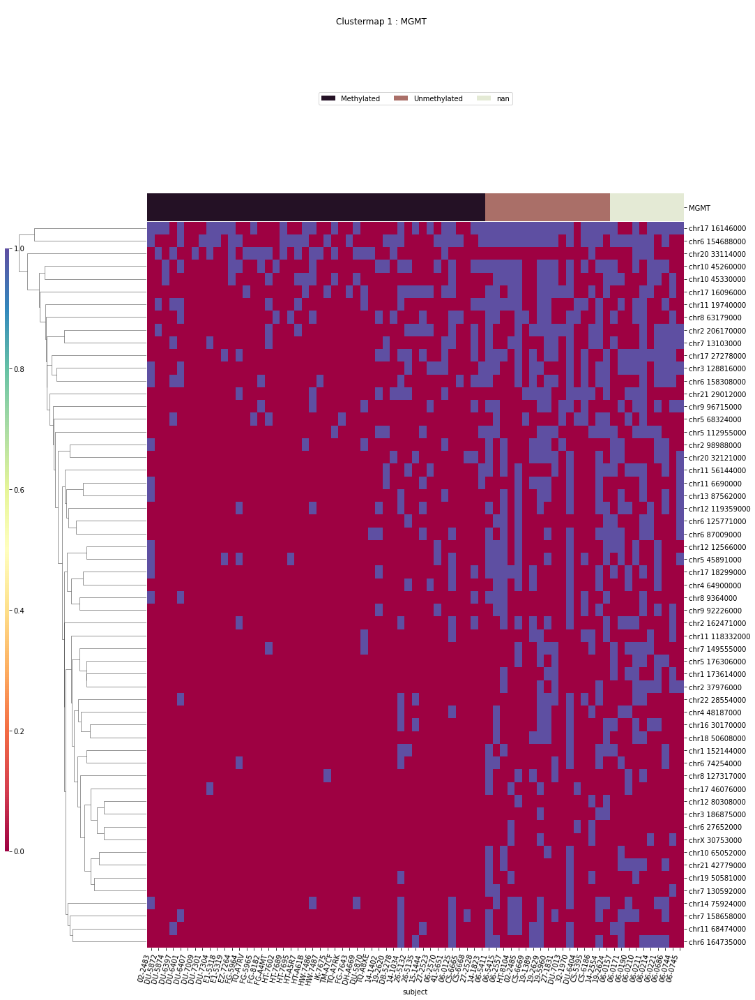

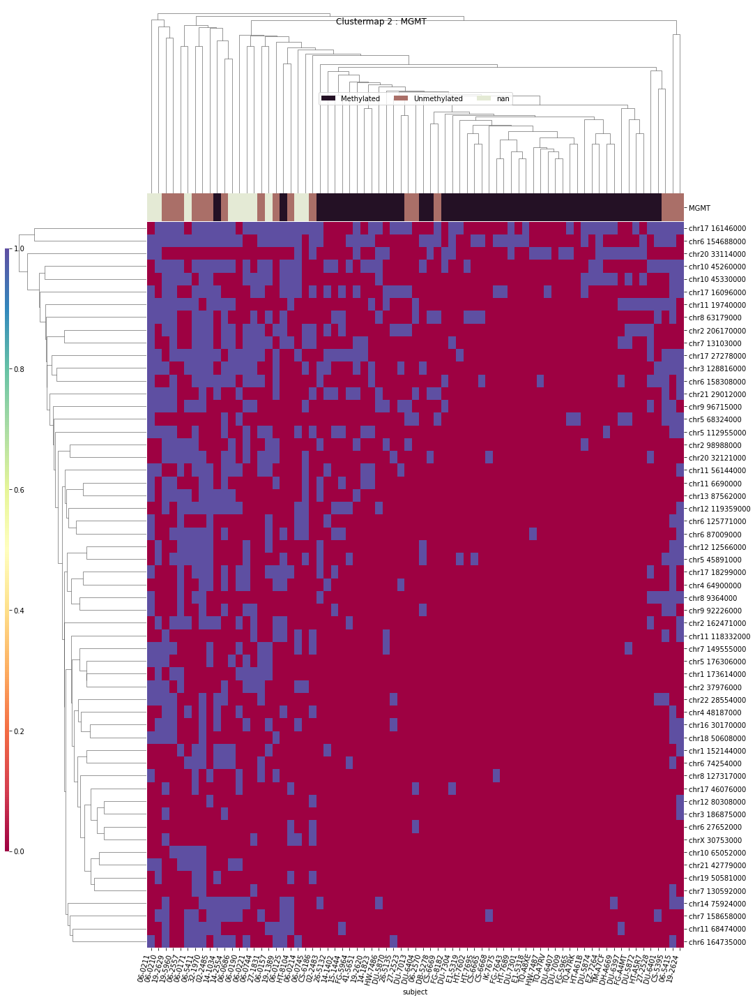

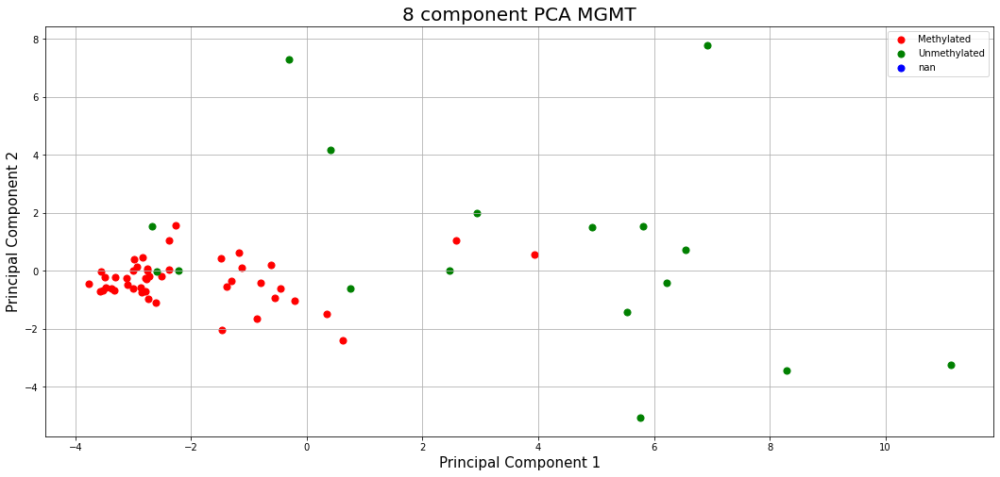

In [112]:
for column in ['primary_diagnosis','IDH','x1p19q','TERT','disease_type',
               'IDH_1p19q_status','WHO_groups','Triple_group','MGMT']:
    print(column)
    ttests_boxplots_and_heatmaps(compdf[compdf['hkle']==hkle],
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-15,heat_p=0.01)

In [113]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210601 20:55:17'

primary_diagnosis
T-Testing
Boxplotting
 p : 2.698715257411419e-16  ( t : 13.714955340794955 ) :  chr10 99891000


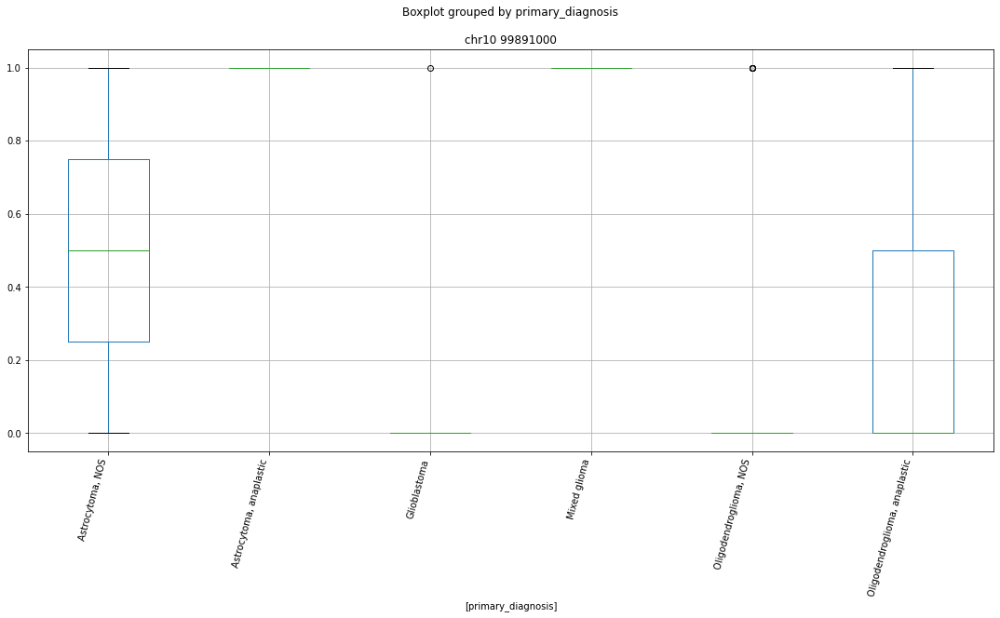

Clustermapping
['chr1 108490000' 'chr1 108675000' 'chr1 112729000' 'chr1 114791000'
 'chr1 114805000' 'chr1 12007000' 'chr1 143637000' 'chr1 145765000'
 'chr1 145768000' 'chr1 147734000' 'chr1 147950000' 'chr1 150780000'
 'chr1 150850000' 'chr1 150851000' 'chr1 151652000' 'chr1 152255000'
 'chr1 152472000' 'chr1 153575000' 'chr1 161617000' 'chr1 162466000'
 'chr1 167030000' 'chr1 179041000' 'chr1 179419000' 'chr1 197405000'
 'chr1 20814000' 'chr1 21023000' 'chr1 219544000' 'chr1 226115000'
 'chr1 231127000' 'chr1 231453000' 'chr1 23256000' 'chr1 23503000'
 'chr1 237128000' 'chr1 237670000' 'chr1 23852000' 'chr1 23934000'
 'chr1 247521000' 'chr1 248676000' 'chr1 26595000' 'chr1 27063000'
 'chr1 27852000' 'chr1 31175000' 'chr1 32805000' 'chr1 32975000'
 'chr1 33510000' 'chr1 39914000' 'chr1 43501000' 'chr1 45081000'
 'chr1 48191000' 'chr1 48384000' 'chr1 50380000' 'chr1 50381000'
 'chr1 6306000' 'chr1 64200000' 'chr1 64414000' 'chr1 7601000'
 'chr1 7952000' 'chr1 96470000' 'chr1 98513000

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


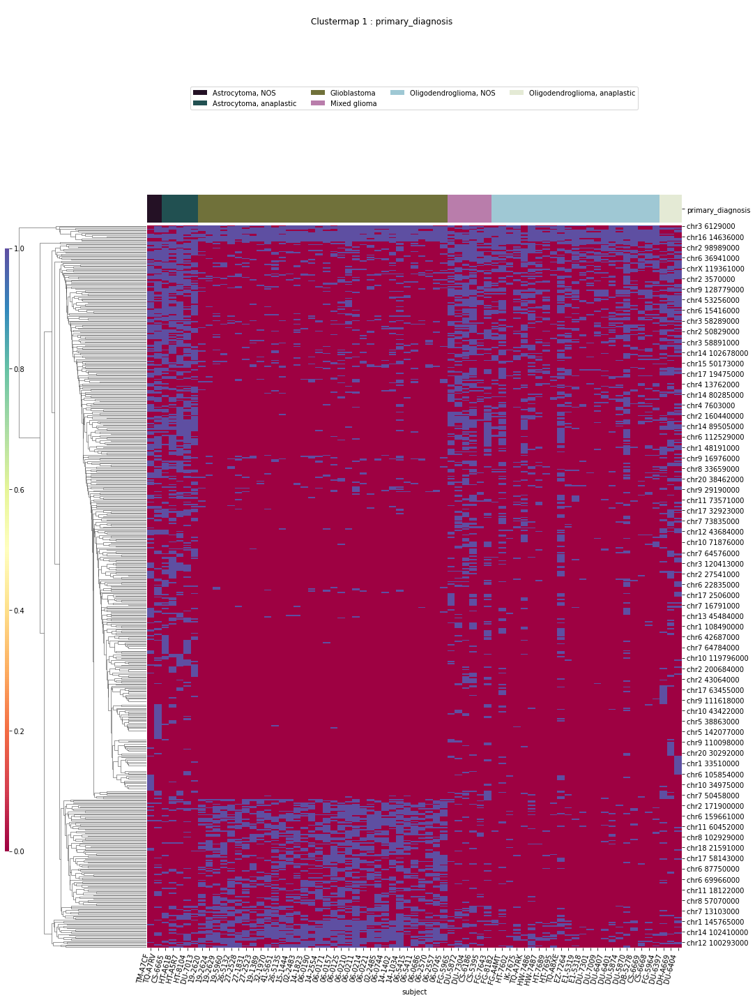

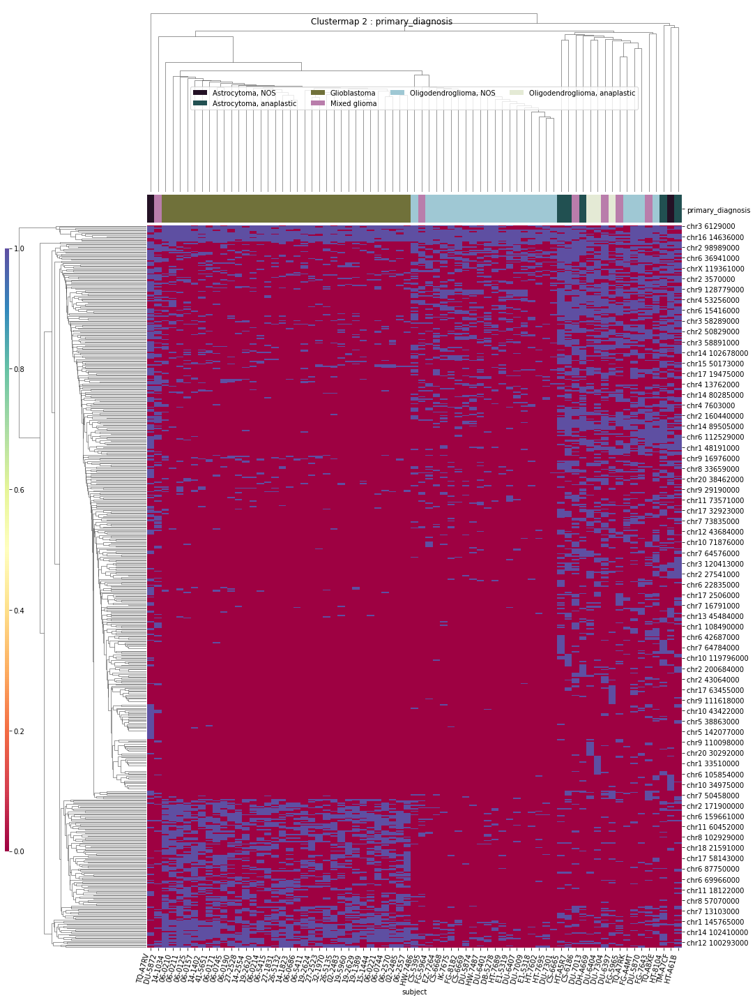

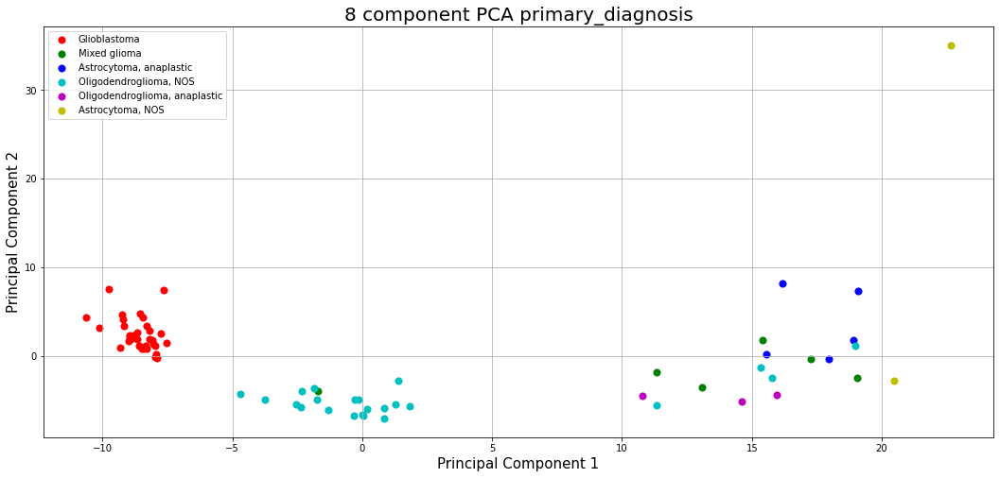

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 152144000' 'chr1 6716000' 'chr1 7600000' 'chr10 92976000'
 'chr10 97840000' 'chr11 18122000' 'chr11 56144000' 'chr11 61167000'
 'chr11 73896000' 'chr11 77491000' 'chr11 83317000' 'chr12 111508000'
 'chr12 122708000' 'chr12 15912000' 'chr13 95689000' 'chr14 102171000'
 'chr14 102410000' 'chr14 63166000' 'chr15 41321000' 'chr15 74728000'
 'chr16 1600000' 'chr16 19004000' 'chr16 7902000' 'chr17 16096000'
 'chr17 18299000' 'chr17 2256000' 'chr17 27278000' 'chr17 573000'
 'chr18 12979000' 'chr18 21591000' 'chr18 31961000' 'chr2 138872000'
 'chr2 15610000' 'chr2 162471000' 'chr2 171900000' 'chr2 210951000'
 'chr2 39627000' 'chr2 71543000' 'chr2 74060000' 'chr2 95244000'
 'chr20 3020000' 'chr22 19083000' 'chr22 42980000' 'chr3 128816000'
 'chr3 157177000' 'chr3 44820000' 'chr4 118399000' 'chr4 122813000'
 'chr4 147358000' 'chr4 174294000' 'chr4 40787000' 'chr4 41050000'
 'chr6 125771000' 'chr6 169855000' 'chr6 57308000' 'chr6 69966000'
 'c

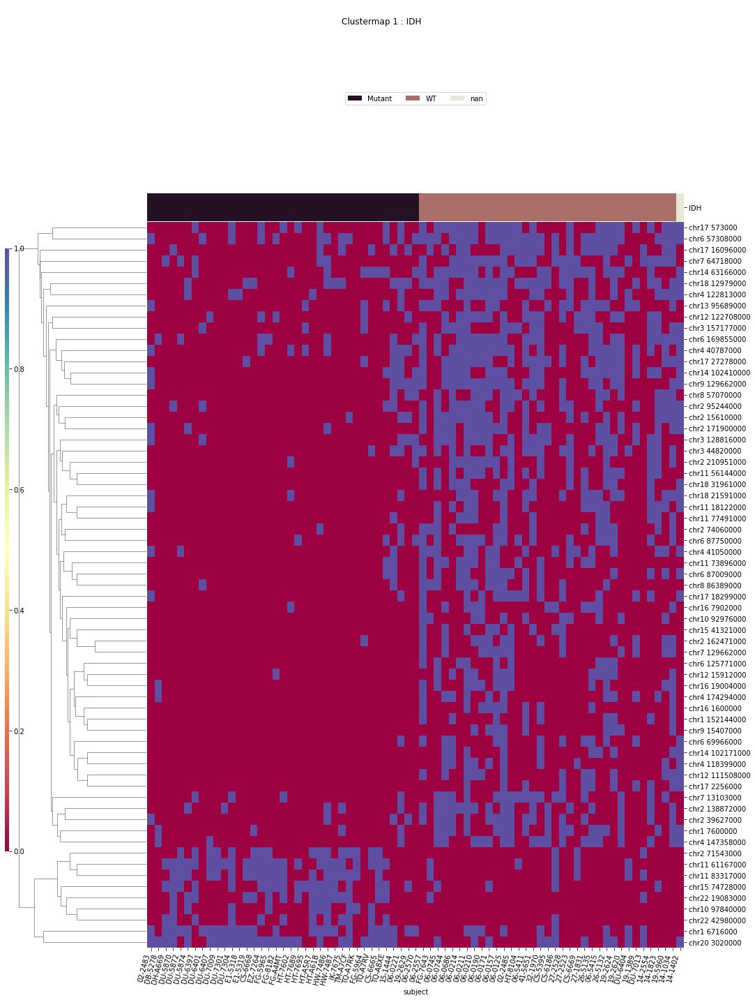

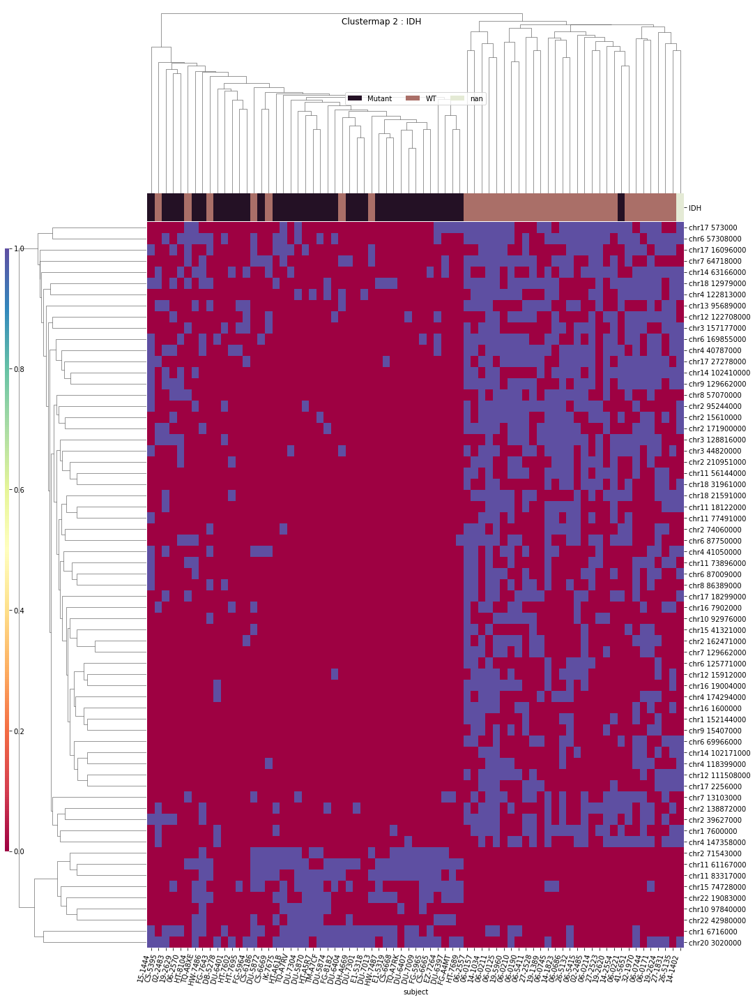

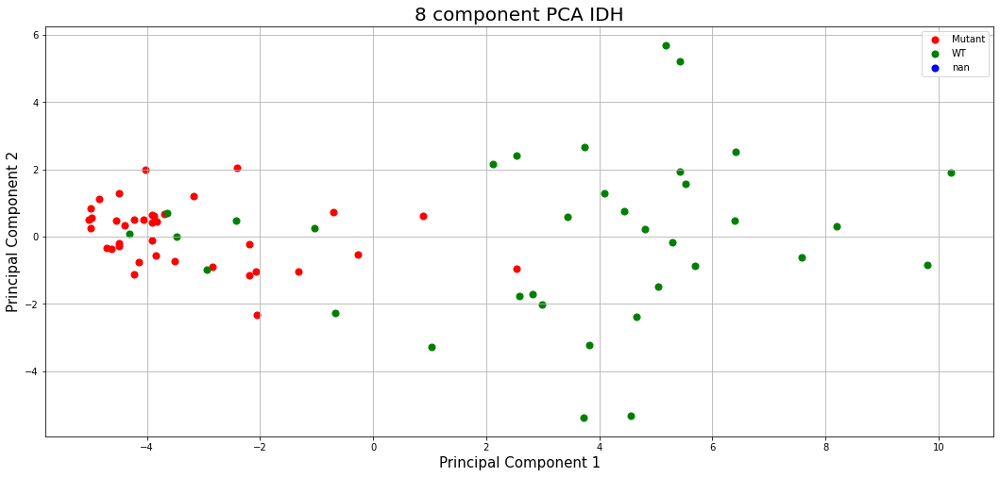

x1p19q
T-Testing
Boxplotting
Clustermapping
['chr14 80285000' 'chr2 111963000' 'chr20 5701000' 'chr4 183040000'
 'chr6 57308000' 'subject' 'x1p19q']


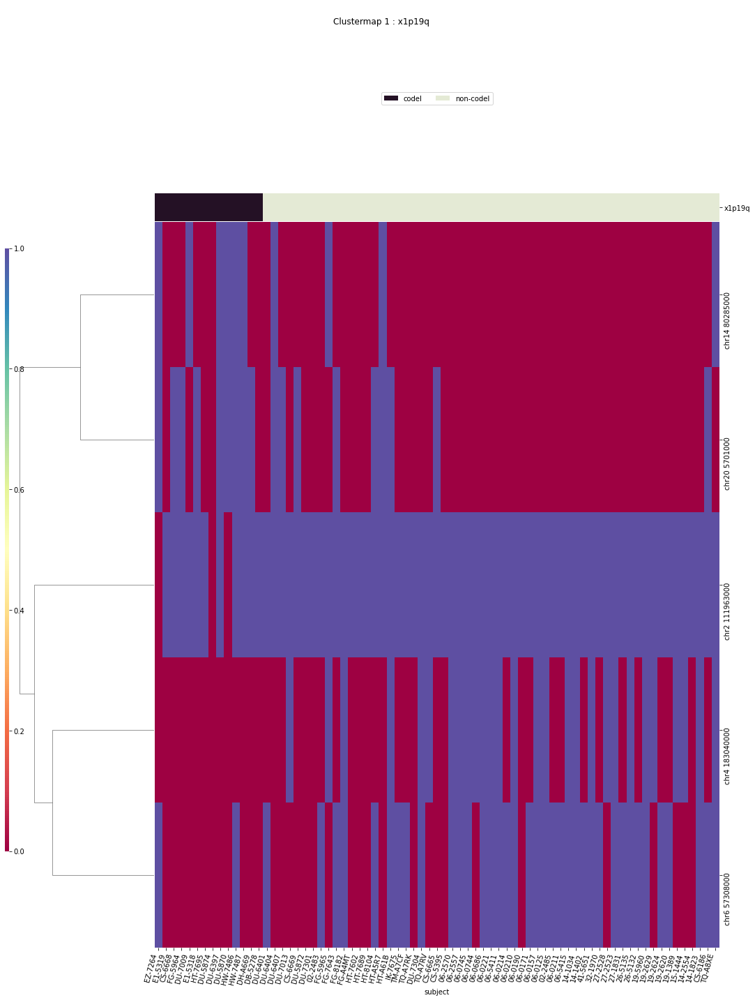

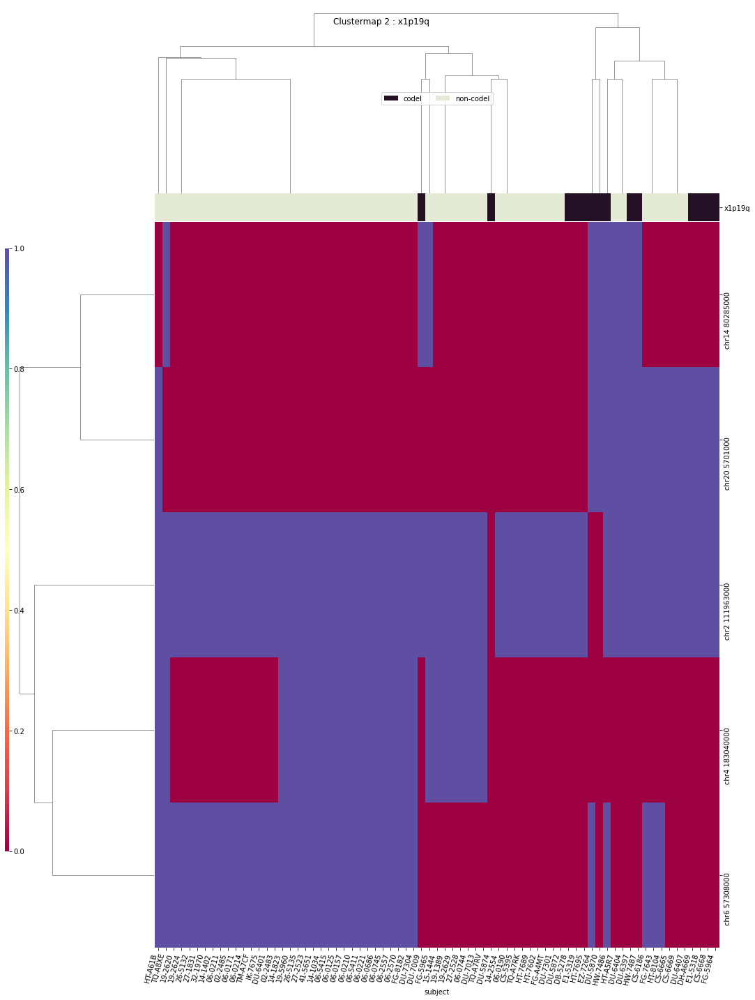

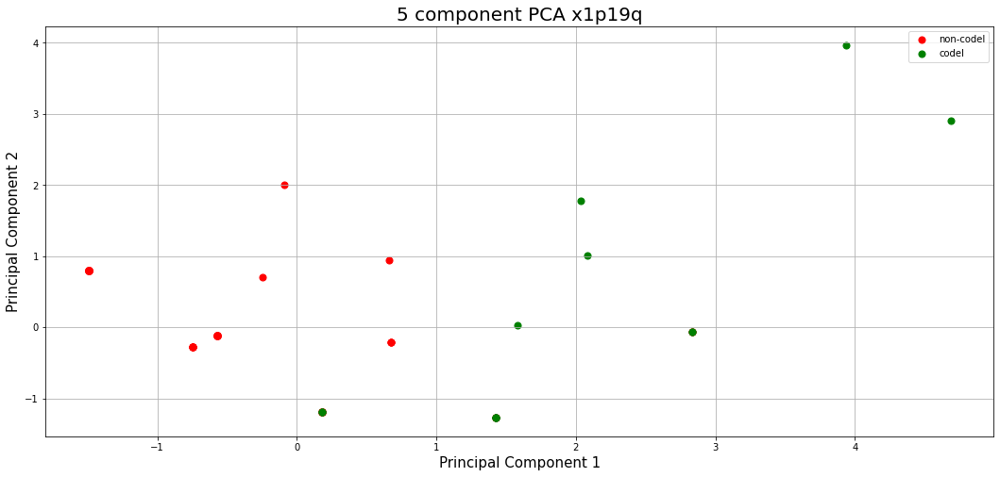

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 226115000' 'chr11 131085000' 'chr11 56144000'
 'chr13 25513000' 'chr16 66630000' 'chr17 27278000' 'chr18 12979000'
 'chr18 77029000' 'chr19 18006000' 'chr2 171900000' 'chr2 32448000'
 'chr20 30846000' 'chr22 34683000' 'chr3 108026000' 'chr3 58891000'
 'chr3 75288000' 'subject']


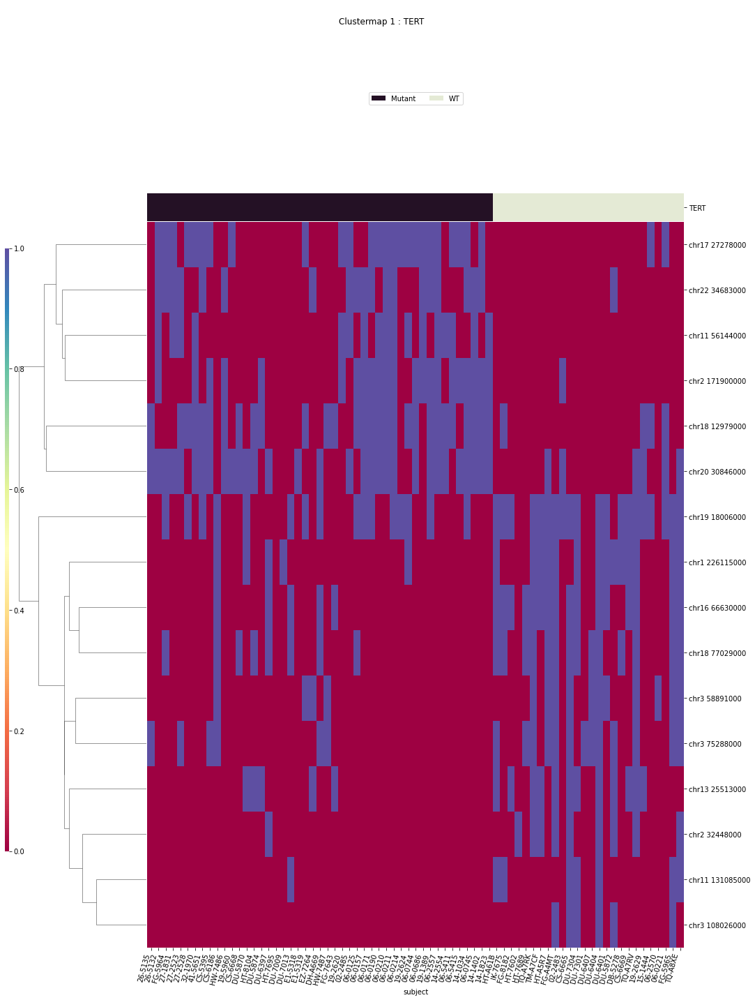

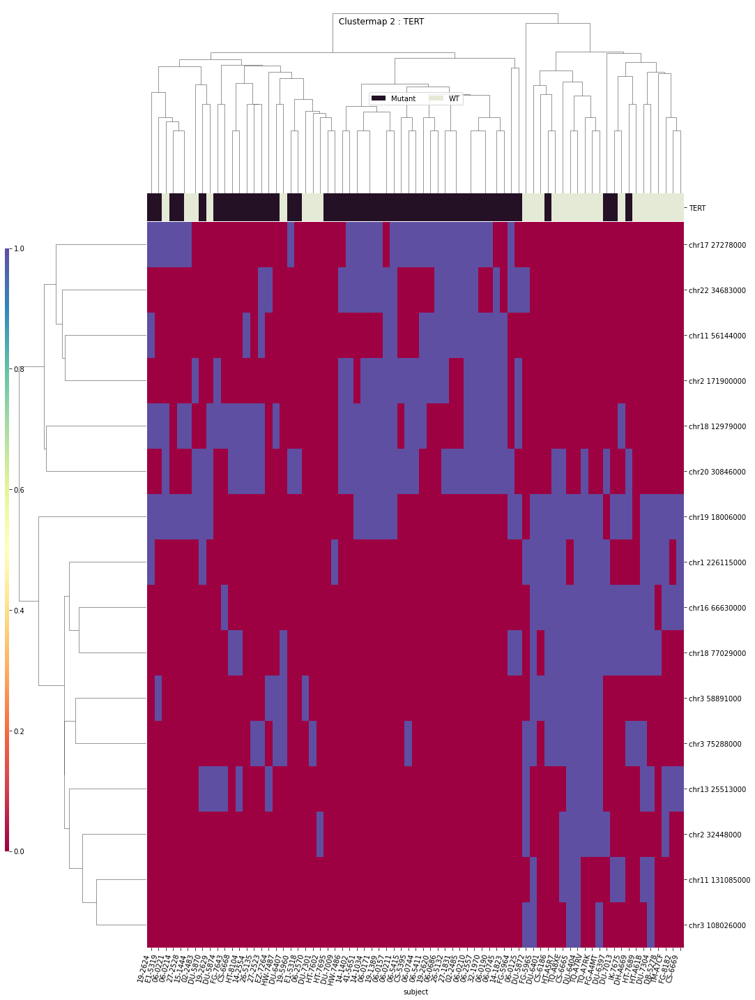

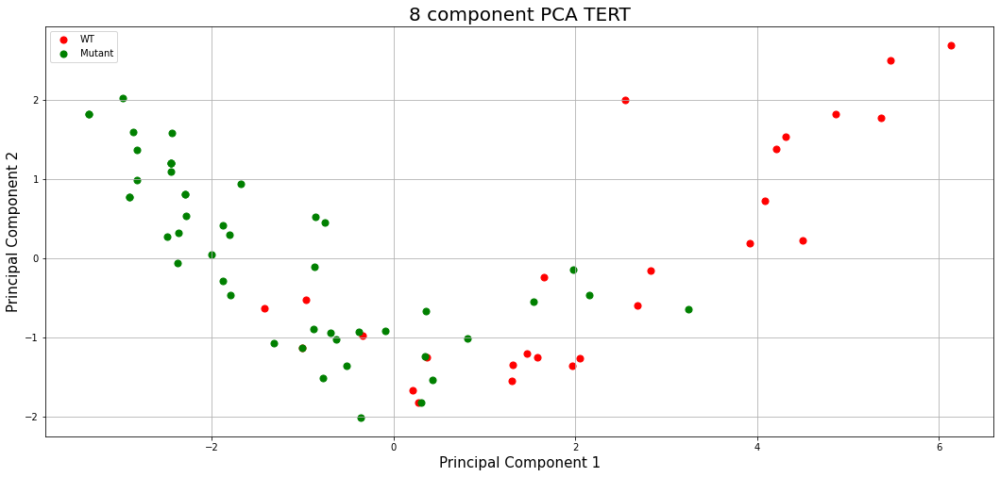

disease_type
T-Testing
Boxplotting
 p : 3.5552361378046195e-17  ( t : 11.103035497568849 ) :  chr9 129662000


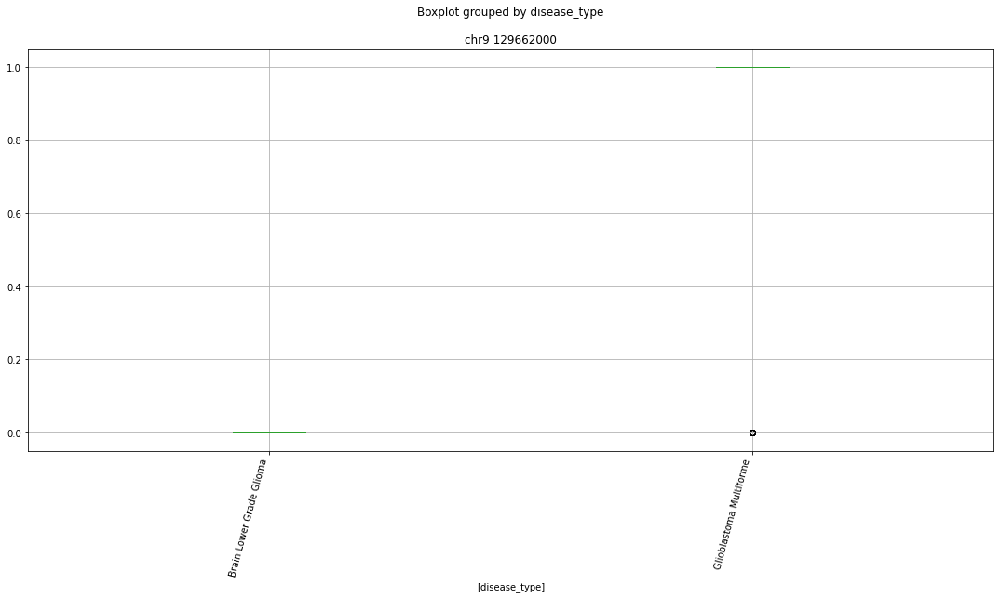

Clustermapping
['chr1 111529000' 'chr1 111800000' 'chr1 112729000' 'chr1 114791000'
 'chr1 145765000' 'chr1 150850000' 'chr1 152144000' 'chr1 152195000'
 'chr1 152472000' 'chr1 153575000' 'chr1 160936000' 'chr1 167030000'
 'chr1 176058000' 'chr1 179041000' 'chr1 197405000' 'chr1 21054000'
 'chr1 226115000' 'chr1 229931000' 'chr1 23504000' 'chr1 23852000'
 'chr1 246363000' 'chr1 24801000' 'chr1 26802000' 'chr1 27063000'
 'chr1 36243000' 'chr1 48191000' 'chr1 48480000' 'chr1 50382000'
 'chr1 52869000' 'chr1 6306000' 'chr1 65630000' 'chr1 7600000'
 'chr1 7601000' 'chr1 77868000' 'chr1 7952000' 'chr1 92025000'
 'chr1 98513000' 'chr10 118264000' 'chr10 118894000' 'chr10 119261000'
 'chr10 122204000' 'chr10 133413000' 'chr10 42139000' 'chr10 43466000'
 'chr10 45260000' 'chr10 68280000' 'chr10 6992000' 'chr10 78469000'
 'chr10 92673000' 'chr10 93970000' 'chr10 97529000' 'chr10 99891000'
 'chr11 124402000' 'chr11 18122000' 'chr11 31972000' 'chr11 33244000'
 'chr11 36143000' 'chr11 56144000' 'c

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


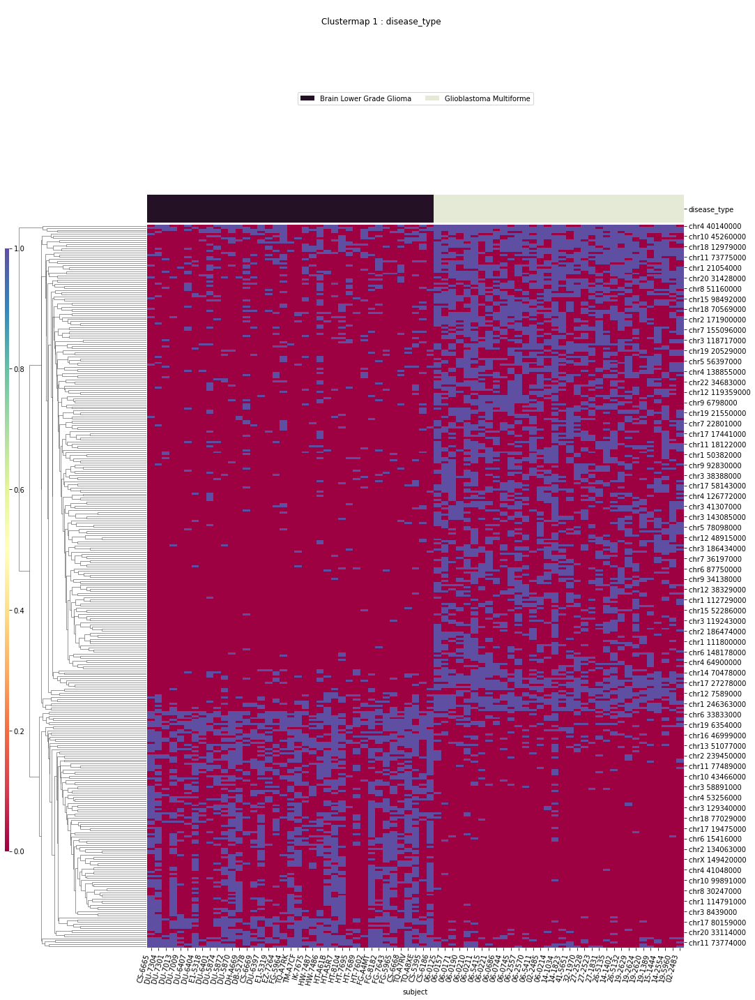

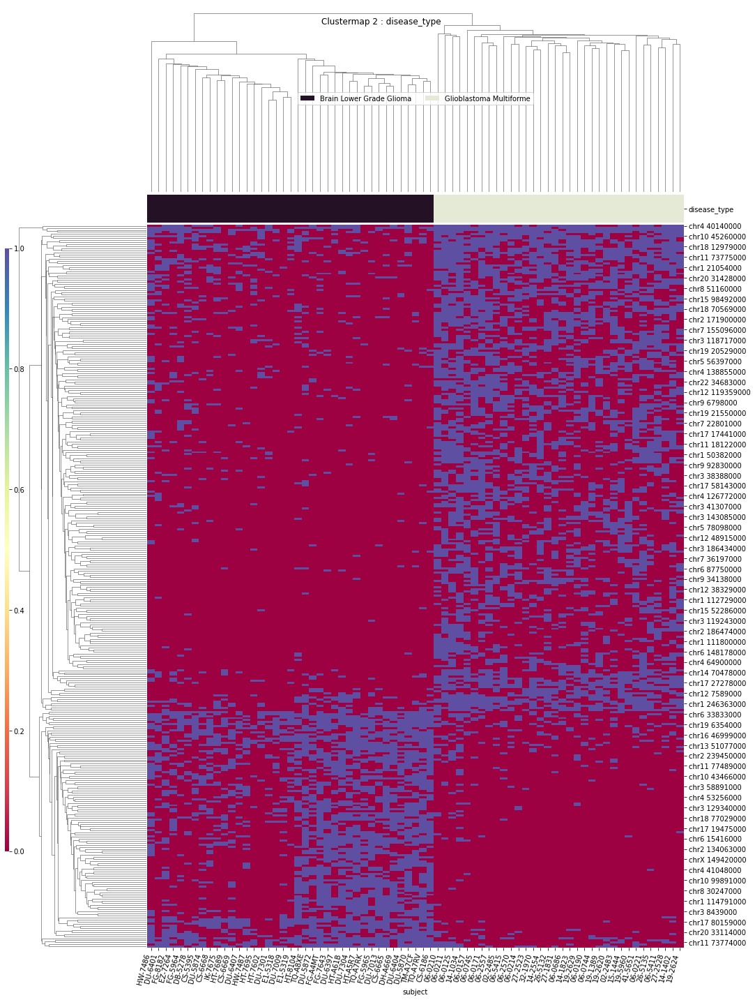

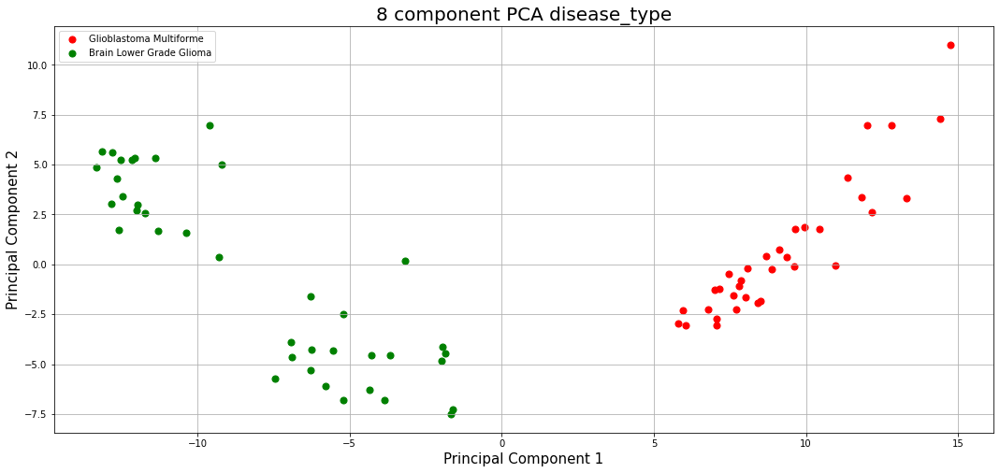

IDH_1p19q_status
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 6716000' 'chr10 97840000' 'chr11 56144000'
 'chr11 61167000' 'chr11 70296000' 'chr12 14354000' 'chr14 102410000'
 'chr14 34476000' 'chr14 80285000' 'chr15 60365000' 'chr15 74728000'
 'chr16 49211000' 'chr16 66630000' 'chr17 16096000' 'chr17 27278000'
 'chr18 12979000' 'chr18 31961000' 'chr19 21775000' 'chr2 15610000'
 'chr2 162471000' 'chr2 171900000' 'chr2 206170000' 'chr2 32448000'
 'chr2 41996000' 'chr2 71543000' 'chr20 30847000' 'chr20 5701000'
 'chr22 19083000' 'chr22 34683000' 'chr3 128816000' 'chr3 157177000'
 'chr3 44820000' 'chr3 58891000' 'chr4 183040000' 'chr6 57308000'
 'chr7 64718000' 'chr9 129662000' 'chrX 46397000' 'subject']


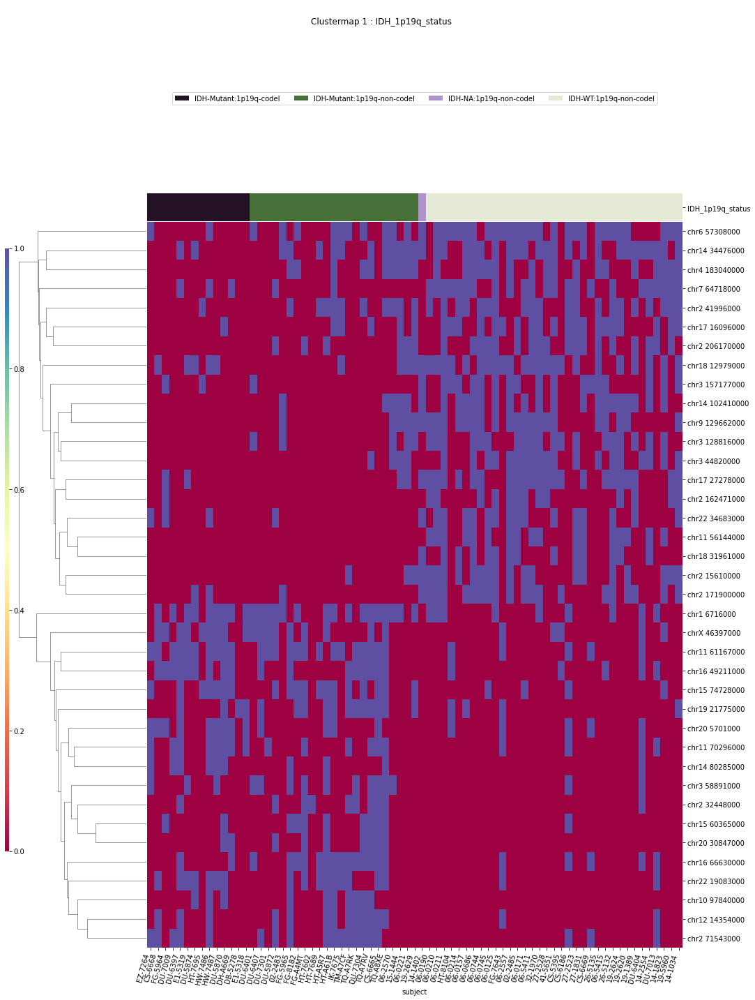

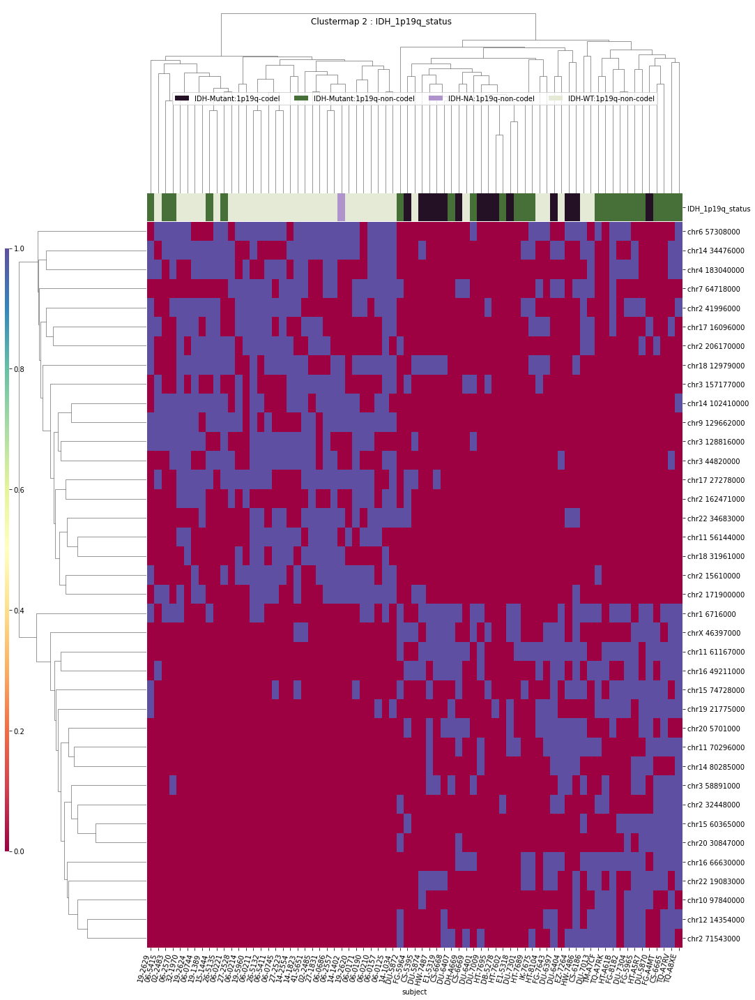

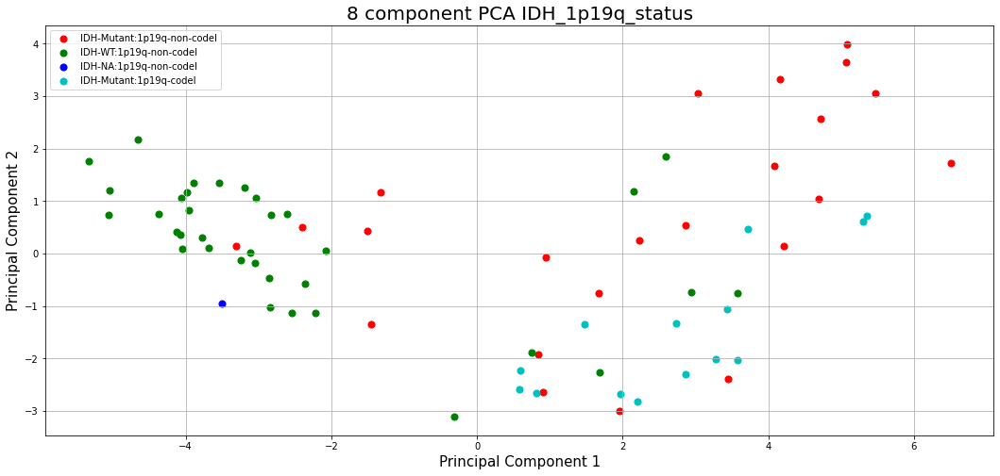

WHO_groups
T-Testing
Boxplotting
Clustermapping
['WHO_groups' 'chr1 108490000' 'chr1 108675000' 'chr1 114791000'
 'chr1 114803000' 'chr1 114805000' 'chr1 12007000' 'chr1 145768000'
 'chr1 151652000' 'chr1 152472000' 'chr1 153575000' 'chr1 160936000'
 'chr1 161030000' 'chr1 161617000' 'chr1 162457000' 'chr1 162466000'
 'chr1 168208000' 'chr1 176058000' 'chr1 179041000' 'chr1 20814000'
 'chr1 21023000' 'chr1 212322000' 'chr1 212724000' 'chr1 219544000'
 'chr1 225615000' 'chr1 226115000' 'chr1 231127000' 'chr1 23256000'
 'chr1 23503000' 'chr1 236385000' 'chr1 237128000' 'chr1 237670000'
 'chr1 23852000' 'chr1 23934000' 'chr1 246363000' 'chr1 248676000'
 'chr1 248830000' 'chr1 26595000' 'chr1 27063000' 'chr1 27852000'
 'chr1 32805000' 'chr1 32975000' 'chr1 34948000' 'chr1 39869000'
 'chr1 39914000' 'chr1 39999000' 'chr1 44877000' 'chr1 45081000'
 'chr1 48191000' 'chr1 48384000' 'chr1 48478000' 'chr1 50381000'
 'chr1 52181000' 'chr1 6306000' 'chr1 64200000' 'chr1 64414000'
 'chr1 7601000' '

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


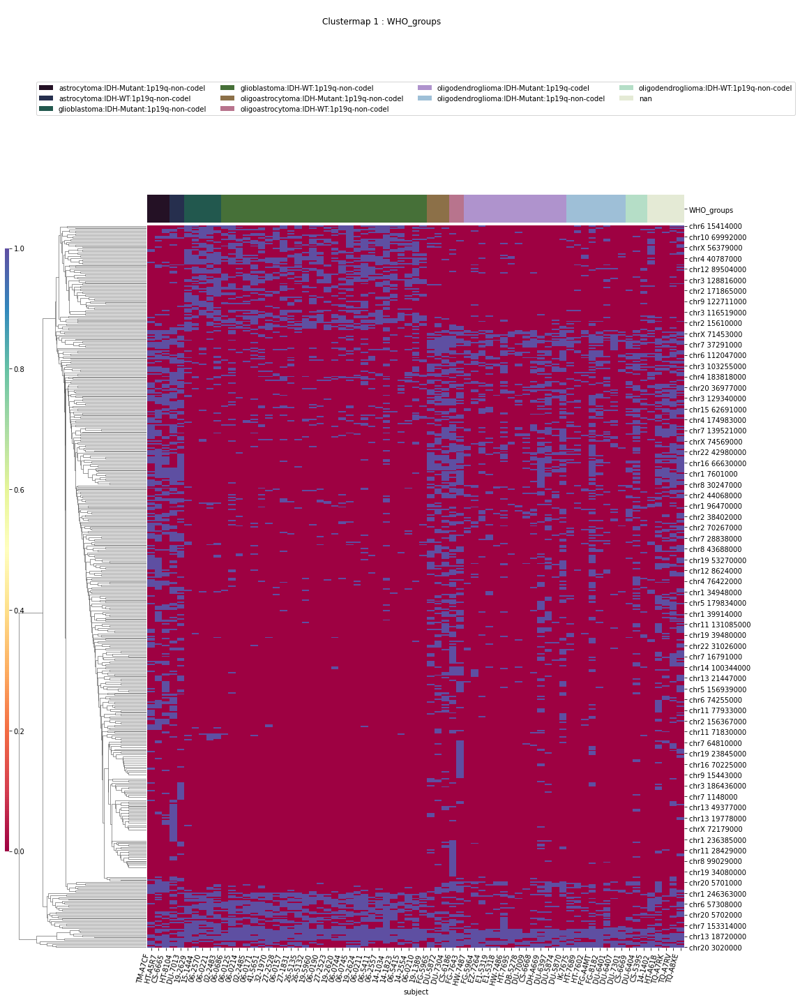

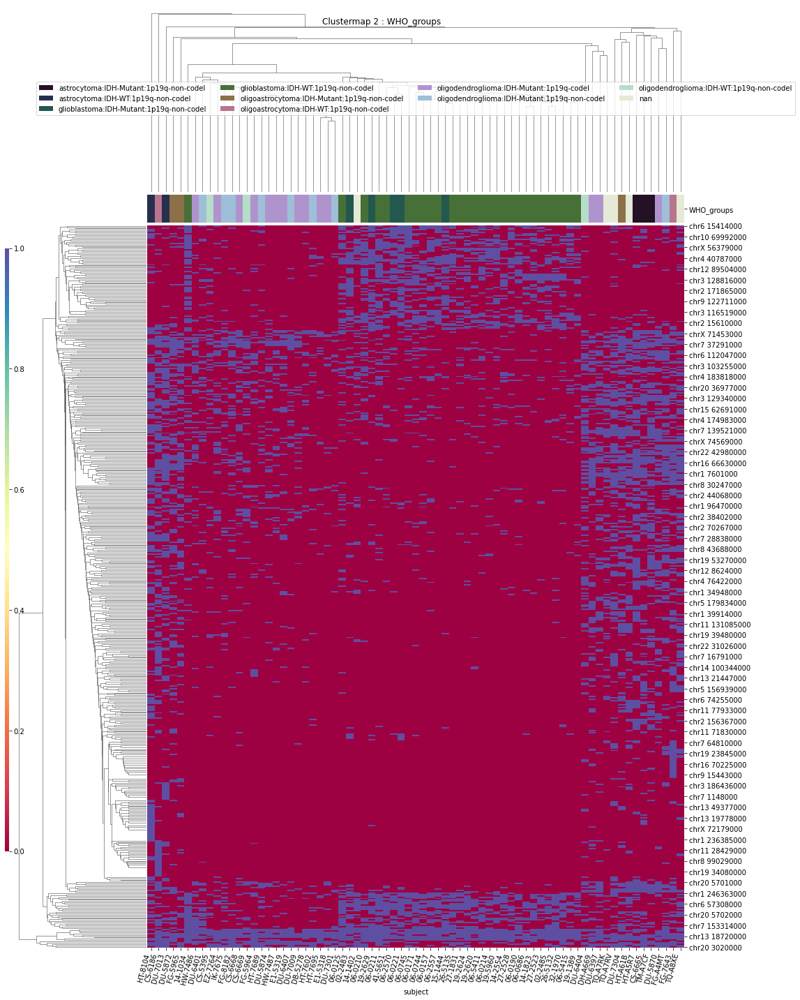

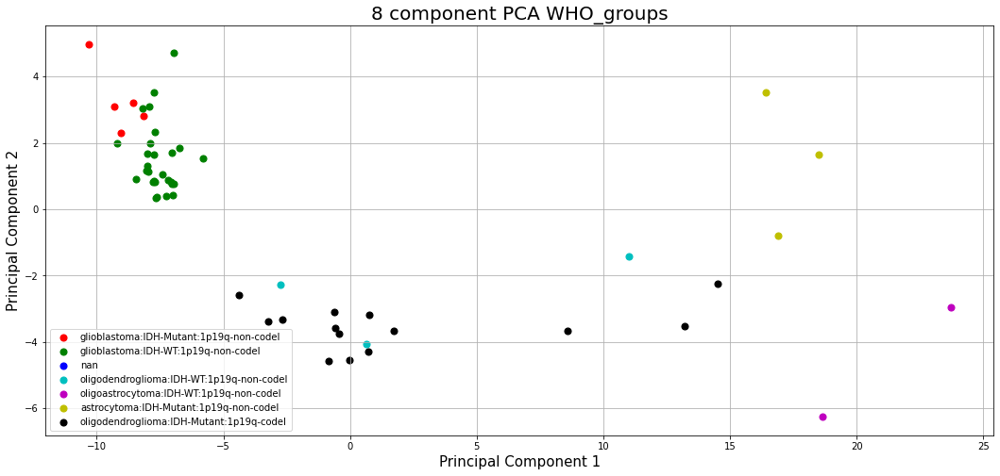

Triple_group
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['Triple_group' 'chr1 114791000' 'chr1 114805000' 'chr1 162465000'
 'chr1 219544000' 'chr1 226115000' 'chr1 32805000' 'chr1 33510000'
 'chr1 34081000' 'chr1 43501000' 'chr1 44877000' 'chr1 6306000'
 'chr1 6716000' 'chr1 7600000' 'chr10 130628000' 'chr10 43466000'
 'chr10 79370000' 'chr10 93970000' 'chr10 97840000' 'chr11 17051000'
 'chr11 19861000' 'chr11 45737000' 'chr11 56144000' 'chr11 61167000'
 'chr11 70296000' 'chr11 77489000' 'chr11 83317000' 'chr12 111508000'
 'chr12 14354000' 'chr12 27873000' 'chr12 43684000' 'chr12 63687000'
 'chr12 7200000' 'chr13 107782000' 'chr13 25513000' 'chr14 102410000'
 'chr14 80285000' 'chr15 50157000' 'chr15 62691000' 'chr15 70870000'
 'chr15 72397000' 'chr15 72808000' 'chr15 74728000' 'chr15 83821000'
 'chr16 14636000' 'chr16 19004000' 'chr16 3270000' 'chr16 49211000'
 'chr16 66630000' 'chr16 84767000' 'chr17 15868000' 'chr17 16096000'
 'chr17 27278000' 'chr17 44237000' 'chr17 5721000' 'chr17 82377000'
 'chr18 12979000' '

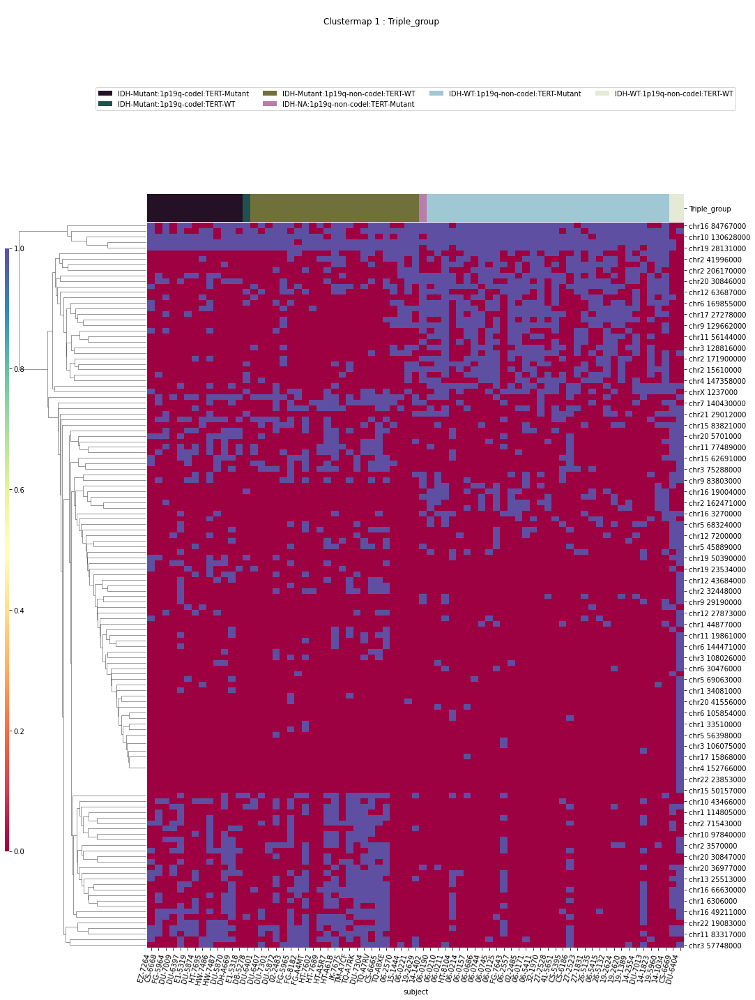

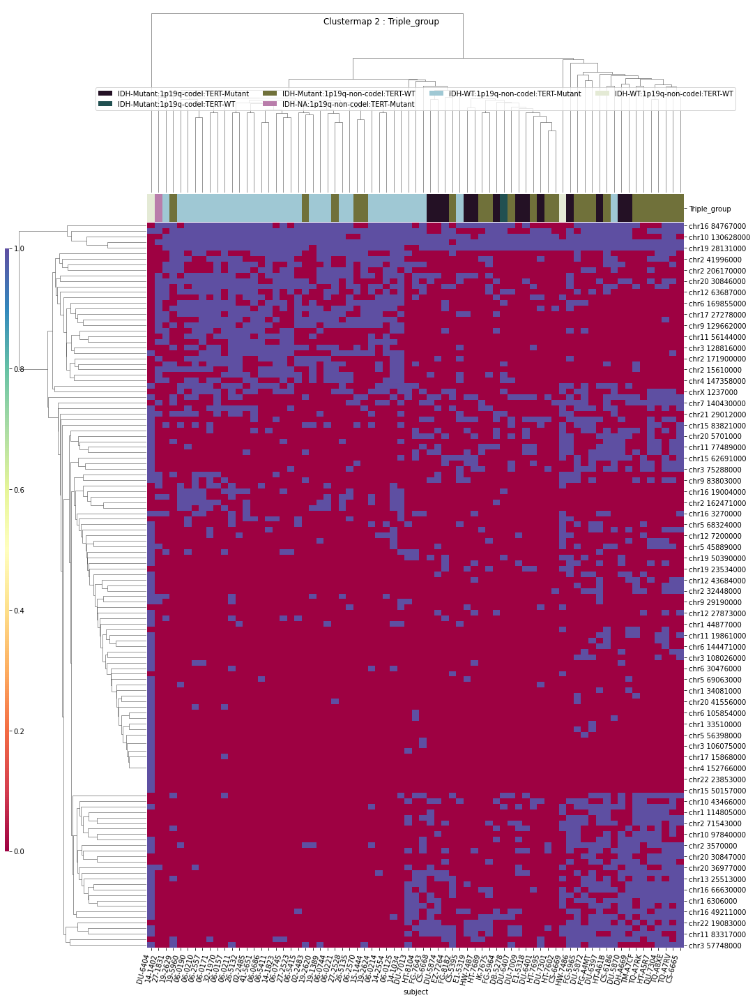

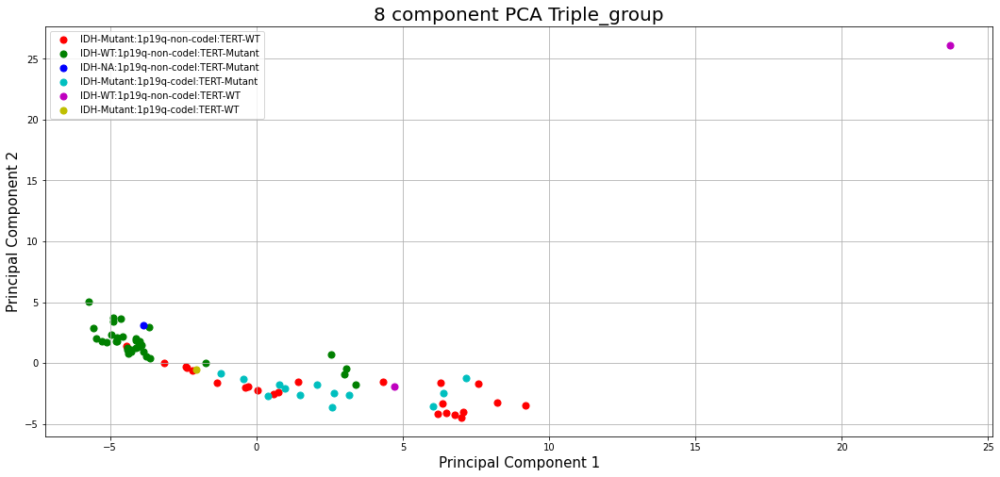

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr10 65052000' 'chr12 12566000' 'chr17 16146000'
 'chr17 18299000' 'chr18 50608000' 'chr2 37976000' 'chr20 32121000'
 'subject']


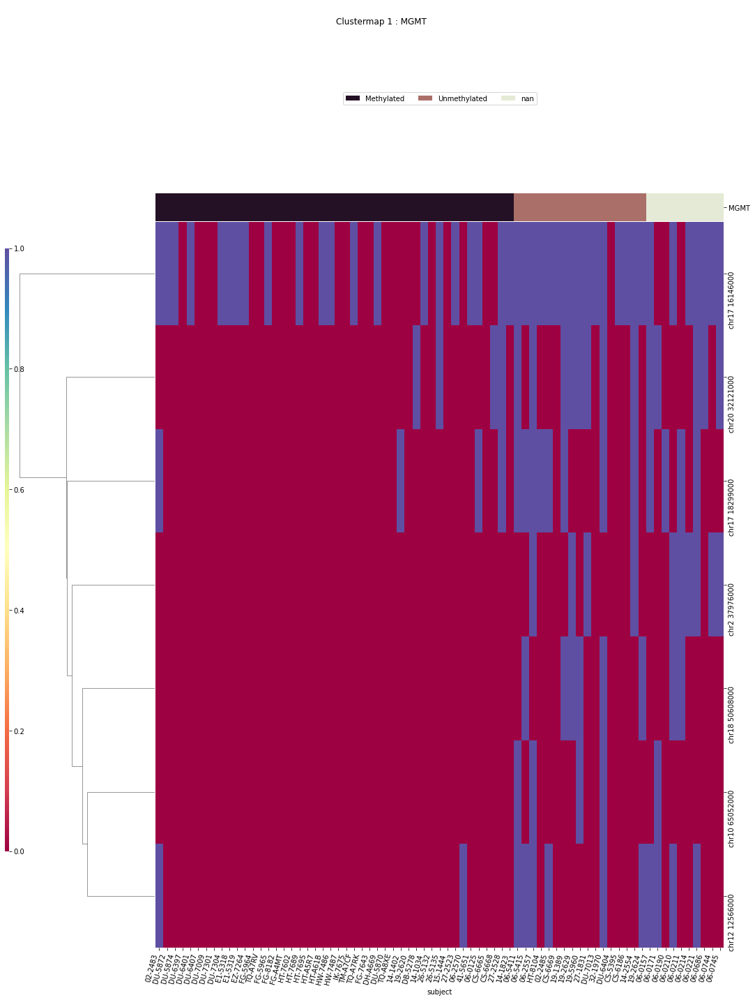

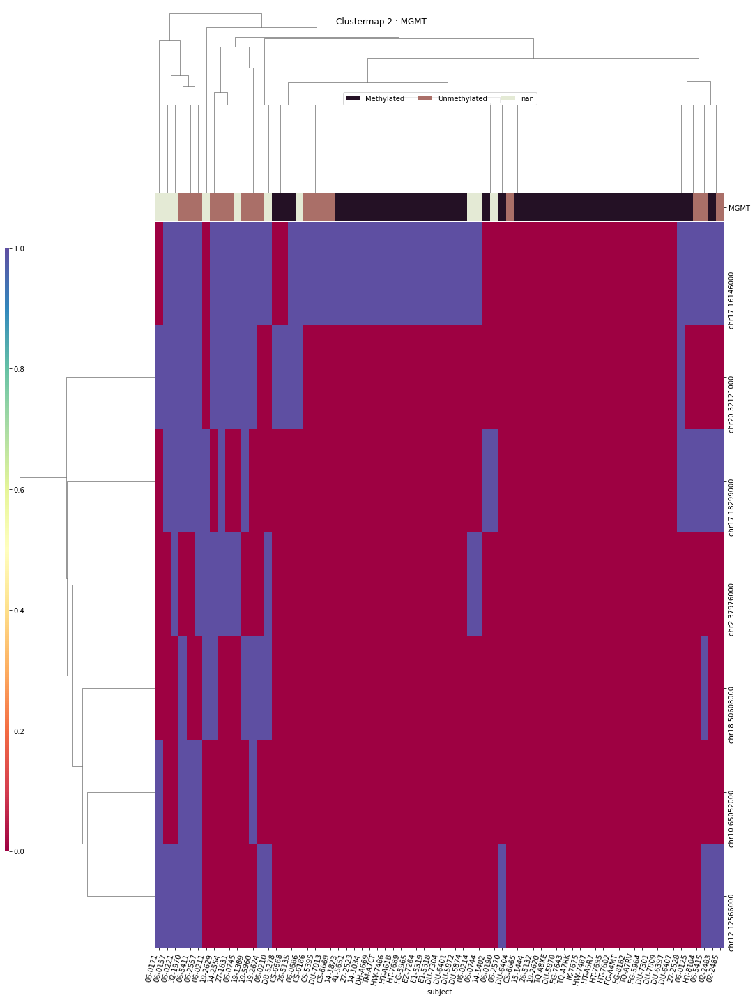

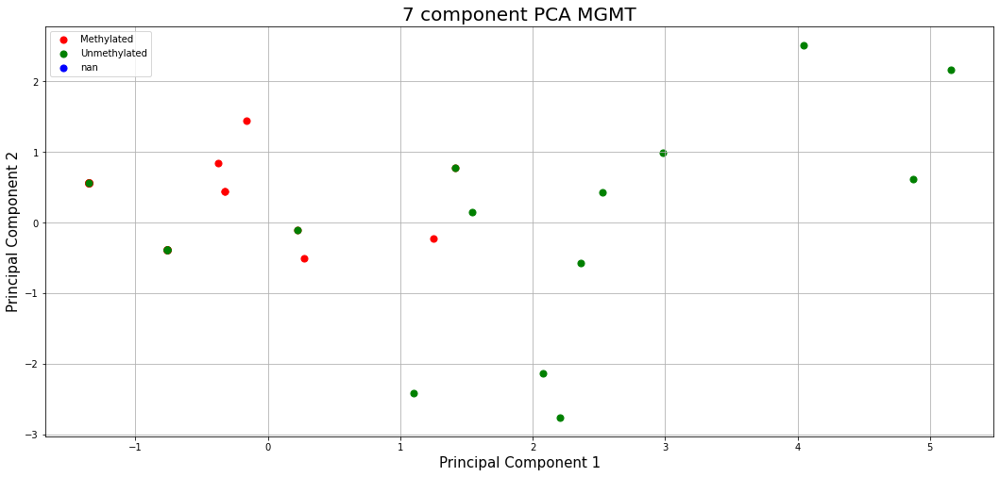

In [114]:
for column in ['primary_diagnosis','IDH','x1p19q','TERT','disease_type',
               'IDH_1p19q_status','WHO_groups','Triple_group','MGMT']:
    print(column)
    ttests_boxplots_and_heatmaps(compdf[compdf['hkle']==hkle],
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-15,heat_p=0.001)

In [115]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210601 21:45:04'

---

In [116]:
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [117]:
pd.set_option('display.max_columns', default_max_columns)

In [118]:
pd.set_option('display.max_rows',default_max_rows)

In [119]:
pd.set_option('display.precision', default_precision)